# Setup

## Libraries

In [1]:
# data manipulation
import pandas as pd
import numpy as np

# data viz
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns

# apply some cool styling
plt.style.use("ggplot")
rcParams['figure.figsize'] = (12, 6)

## Load Data

In [2]:
#load arrivals data from local csv
#last updated 05/19/23 11:19am
df = pd.read_csv("train_arrivals-May2023.csv")

In [3]:
#check dataframe
df

,Station_ID,Stop_ID,Station_Name,Destination,Route,Run_Number,Prediction_Time,Arrival_Time,Is_Approaching,Is_Scheduled,Is_Delayed,Is_Fault
0,40330,30065,Grand,95th/Dan Ryan,Red,809,2023-04-21T10:25:05,2023-04-21T10:26:05,1,0,0,0
1,40330,30065,Grand,95th/Dan Ryan,Red,809,2023-04-21T10:25:57,2023-04-21T10:26:57,1,0,0,0
2,40330,30065,Grand,95th/Dan Ryan,Red,809,2023-04-21T10:25:57,2023-04-21T10:26:57,1,0,0,0
3,41360,30265,California,Ashland/63rd,G,2,2023-04-21T10:26:34,2023-04-21T10:27:34,1,0,0,0
4,40840,30164,South Boulevard,Loop,P,506,2023-04-21T10:26:26,2023-04-21T10:27:26,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
57252,40330,30065,Grand,95th/Dan Ryan,Red,817,2023-05-19T11:12:17,2023-05-19T11:13:17,1,0,0,0
57253,41020,30198,Logan Square,UIC-Halsted,Blue,204,2023-05-19T11:12:51,2023-05-19T11:13:51,1,0,0,0
57254,40330,30065,Grand,95th/Dan Ryan,Red,817,2023-05-19T11:12:17,2023-05-19T11:13:17,1,0,0,0
57255,40330,30064,Grand,Howard,Red,807,2023-05-19T11:13:45,2023-05-19T11:14:45,1,0,0,0


# Cleanup

## All-Train

In [4]:
#We're using a subset of the data here. 57257 train arrival datapoints and 12 features.
df.shape

(57257, 12)

In [5]:
#Check for duplicate rows
df.duplicated().sum()

9411

In [6]:
#Looks like we have some duplicates. Let's view them.
df[df.duplicated()]

,Station_ID,Stop_ID,Station_Name,Destination,Route,Run_Number,Prediction_Time,Arrival_Time,Is_Approaching,Is_Scheduled,Is_Delayed,Is_Fault
2,40330,30065,Grand,95th/Dan Ryan,Red,809,2023-04-21T10:25:57,2023-04-21T10:26:57,1,0,0,0
8,41360,30265,California,Ashland/63rd,G,2,2023-04-21T10:27:35,2023-04-21T10:28:35,1,0,0,0
13,41360,30266,California,Harlem/Lake,G,607,2023-04-21T10:28:44,2023-04-21T10:29:44,1,0,0,0
18,40330,30064,Grand,Howard,Red,906,2023-04-21T10:30:59,2023-04-21T10:31:59,1,0,0,0
20,40330,30064,Grand,Howard,Red,906,2023-04-21T10:30:59,2023-04-21T10:31:59,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
57249,41020,30198,Logan Square,UIC-Halsted,Blue,204,2023-05-19T11:11:28,2023-05-19T11:12:28,1,0,0,0
57250,40840,30164,South Boulevard,Howard,P,509,2023-05-19T11:11:49,2023-05-19T11:12:49,1,0,0,0
57253,41020,30198,Logan Square,UIC-Halsted,Blue,204,2023-05-19T11:12:51,2023-05-19T11:13:51,1,0,0,0
57254,40330,30065,Grand,95th/Dan Ryan,Red,817,2023-05-19T11:12:17,2023-05-19T11:13:17,1,0,0,0


In [7]:
#Let's get rid of them
df_clean = df.drop_duplicates()
df_clean.shape #and check

(47846, 12)

In [8]:
#Check for nulls
df_clean.isna().sum()

Station_ID         0
Stop_ID            0
Station_Name       0
Destination        0
Route              2
Run_Number         0
Prediction_Time    0
Arrival_Time       0
Is_Approaching     0
Is_Scheduled       0
Is_Delayed         0
Is_Fault           0
dtype: int64

In [9]:
#Since NAs are minimal, let's just drop those rows
df_clean = df_clean.dropna(subset=['Route'])

In [10]:
df_clean.isna().sum() #and check again

Station_ID         0
Stop_ID            0
Station_Name       0
Destination        0
Route              0
Run_Number         0
Prediction_Time    0
Arrival_Time       0
Is_Approaching     0
Is_Scheduled       0
Is_Delayed         0
Is_Fault           0
dtype: int64

In [11]:
#check column datatypes
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47844 entries, 0 to 57255
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Station_ID       47844 non-null  int64 
 1   Stop_ID          47844 non-null  int64 
 2   Station_Name     47844 non-null  object
 3   Destination      47844 non-null  object
 4   Route            47844 non-null  object
 5   Run_Number       47844 non-null  int64 
 6   Prediction_Time  47844 non-null  object
 7   Arrival_Time     47844 non-null  object
 8   Is_Approaching   47844 non-null  int64 
 9   Is_Scheduled     47844 non-null  int64 
 10  Is_Delayed       47844 non-null  int64 
 11  Is_Fault         47844 non-null  int64 
dtypes: int64(7), object(5)
memory usage: 4.7+ MB


In [12]:
#change prediction and arrival times from object to datetime datatype
df_clean["Prediction_Time"] = pd.to_datetime(df_clean["Prediction_Time"])
df_clean["Arrival_Time"] = pd.to_datetime(df_clean["Arrival_Time"])
df_clean.info() #and check

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47844 entries, 0 to 57255
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Station_ID       47844 non-null  int64         
 1   Stop_ID          47844 non-null  int64         
 2   Station_Name     47844 non-null  object        
 3   Destination      47844 non-null  object        
 4   Route            47844 non-null  object        
 5   Run_Number       47844 non-null  int64         
 6   Prediction_Time  47844 non-null  datetime64[ns]
 7   Arrival_Time     47844 non-null  datetime64[ns]
 8   Is_Approaching   47844 non-null  int64         
 9   Is_Scheduled     47844 non-null  int64         
 10  Is_Delayed       47844 non-null  int64         
 11  Is_Fault         47844 non-null  int64         
dtypes: datetime64[ns](2), int64(7), object(3)
memory usage: 4.7+ MB


In [13]:
#view
df_clean

,Station_ID,Stop_ID,Station_Name,Destination,Route,Run_Number,Prediction_Time,Arrival_Time,Is_Approaching,Is_Scheduled,Is_Delayed,Is_Fault
0,40330,30065,Grand,95th/Dan Ryan,Red,809,2023-04-21 10:25:05,2023-04-21 10:26:05,1,0,0,0
1,40330,30065,Grand,95th/Dan Ryan,Red,809,2023-04-21 10:25:57,2023-04-21 10:26:57,1,0,0,0
3,41360,30265,California,Ashland/63rd,G,2,2023-04-21 10:26:34,2023-04-21 10:27:34,1,0,0,0
4,40840,30164,South Boulevard,Loop,P,506,2023-04-21 10:26:26,2023-04-21 10:27:26,1,0,0,0
5,41130,30215,Halsted,Loop,Org,706,2023-04-21 10:26:57,2023-04-21 10:27:57,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
57247,41020,30198,Logan Square,UIC-Halsted,Blue,204,2023-05-19 11:11:28,2023-05-19 11:12:28,1,0,0,0
57248,40840,30164,South Boulevard,Howard,P,509,2023-05-19 11:11:49,2023-05-19 11:12:49,1,0,0,0
57251,41020,30198,Logan Square,UIC-Halsted,Blue,204,2023-05-19 11:12:51,2023-05-19 11:13:51,1,0,0,0
57252,40330,30065,Grand,95th/Dan Ryan,Red,817,2023-05-19 11:12:17,2023-05-19 11:13:17,1,0,0,0


In [14]:
####### POTENTIAL TODO

#check if time series data looks right for each line
df_clean.loc[df_clean["Route"] == "Pink"].sort_values(by=["Arrival_Time"])

#Looks like Red, G, Org, Y, and Pink have some duplicates still that aren't "full" duplicates
#The same run appears to show twice within 30-60 seconds of itself

#FIGURE OUT HOW TO DE-DUPLICATE THESE ROWS BY IDENTIFYING WHEN IT'S THE SAME RUN AND THE ARRIVAL TIME IS WITHIN ~3 MINS OF ANOTHER ONE
#df_pink = df_clean.loc[df_clean["Route"] == "Pink"]

,Station_ID,Stop_ID,Station_Name,Destination,Route,Run_Number,Prediction_Time,Arrival_Time,Is_Approaching,Is_Scheduled,Is_Delayed,Is_Fault
32,41030,30199,Polk,Loop,Pink,305,2023-04-21 10:36:39,2023-04-21 10:37:39,1,0,0,0
33,41030,30199,Polk,Loop,Pink,305,2023-04-21 10:36:58,2023-04-21 10:37:58,1,0,0,0
57,41030,30199,Polk,Loop,Pink,302,2023-04-21 10:43:55,2023-04-21 10:44:55,1,0,0,0
58,41030,30199,Polk,Loop,Pink,302,2023-04-21 10:44:31,2023-04-21 10:45:31,1,0,0,0
82,41030,30199,Polk,Loop,Pink,303,2023-04-21 10:54:54,2023-04-21 10:55:54,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
57125,41030,30199,Polk,Loop,Pink,305,2023-05-19 10:30:54,2023-05-19 10:31:54,1,0,0,0
57130,41030,30199,Polk,Loop,Pink,305,2023-05-19 10:31:51,2023-05-19 10:32:51,1,0,0,0
57171,41030,30199,Polk,Loop,Pink,302,2023-05-19 10:44:46,2023-05-19 10:45:46,1,0,0,0
57198,41030,30199,Polk,Loop,Pink,303,2023-05-19 10:54:50,2023-05-19 10:55:50,1,0,0,0


In [15]:
#what timeframe of data do we have here?
print(df_clean.Arrival_Time.max())
print(df_clean.Arrival_Time.min())
#almost a month

2023-05-19 11:14:45
2023-04-21 10:26:05


In [16]:
#create new df to plot frequency of trains per hour over the last week
df_clean_frequency = df_clean[["Route","Arrival_Time"]]
df_clean_frequency = df_clean_frequency.groupby([df_clean_frequency.Arrival_Time.dt.floor('1H'),"Route"]).count()
df_clean_frequency = df_clean_frequency.rename(columns={'Arrival_Time': 'Frq'})
df_clean_frequency = df_clean_frequency.reset_index(drop=False)
df_clean_frequency['date'] = df_clean_frequency.Arrival_Time.dt.date
df_clean_frequency['hour'] = df_clean_frequency.Arrival_Time.dt.hour
df_clean_frequency['day'] = df_clean_frequency.Arrival_Time.dt.day_name()
df_clean_frequency

,Arrival_Time,Route,Frq,date,hour,day
0,2023-04-21 10:00:00,Blue,15,2023-04-21,10,Friday
1,2023-04-21 10:00:00,Brn,3,2023-04-21,10,Friday
2,2023-04-21 10:00:00,G,14,2023-04-21,10,Friday
3,2023-04-21 10:00:00,Org,6,2023-04-21,10,Friday
4,2023-04-21 10:00:00,P,1,2023-04-21,10,Friday
...,...,...,...,...,...,...
3583,2023-05-19 11:00:00,Org,1,2023-05-19,11,Friday
3584,2023-05-19 11:00:00,P,1,2023-05-19,11,Friday
3585,2023-05-19 11:00:00,Pink,1,2023-05-19,11,Friday
3586,2023-05-19 11:00:00,Red,5,2023-05-19,11,Friday


/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:712: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


Text(0.5, 1.05, 'Frequency of Hourly Train Arrivals by Day')

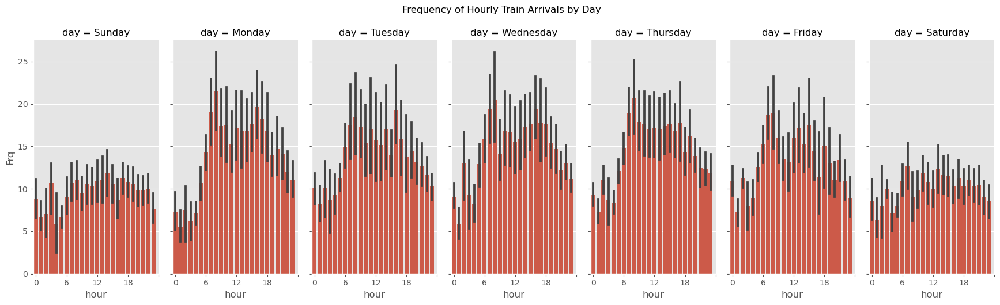

In [17]:
#plot
order = ["Sunday","Monday","Tuesday","Wednesday","Thursday","Friday","Saturday"]
g = sns.FacetGrid(df_clean_frequency, col="day", col_wrap=7, height=5, aspect=.5, col_order=order)
g.map(sns.barplot, "hour", "Frq")
g.set(xticks=np.arange(0,25,6))
g.fig.suptitle('Frequency of Hourly Train Arrivals by Day', y=1.05)

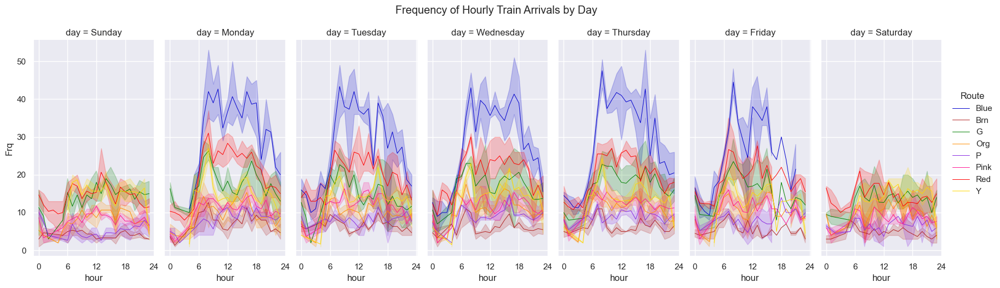

In [18]:
#sns.set_style("white")
sns.set(font_scale=1)
clrs = ["mediumblue", "firebrick", "green", "darkorange", "blueviolet", "deeppink", "red", "gold"]
order = ["Sunday","Monday","Tuesday","Wednesday","Thursday","Friday","Saturday"]
g = sns.FacetGrid(df_clean_frequency, col="day", col_wrap=7, hue="Route", height=5, aspect=.5, palette = clrs, col_order=order)
g.map(sns.lineplot, "hour", "Frq", linewidth=.7)
g.set(xticks=np.arange(0,25,6))
g.fig.suptitle('Frequency of Hourly Train Arrivals by Day', y=1.05)
g.add_legend()

In [383]:
#find some basic average stats by day of week
print("Saturday Frq Avg: ",df_clean_frequency.Frq.loc[df_clean_frequency["day"] == "Saturday"].mean())
print("Sunday Frq Avg: ",df_clean_frequency.Frq.loc[df_clean_frequency["day"] == "Sunday"].mean())
print("Monday Frq Avg: ",df_clean_frequency.Frq.loc[df_clean_frequency["day"] == "Monday"].mean())
print("Tuesday Frq Avg: ",df_clean_frequency.Frq.loc[df_clean_frequency["day"] == "Tuesday"].mean())
print("Wednesday Frq Avg: ",df_clean_frequency.Frq.loc[df_clean_frequency["day"] == "Wednesday"].mean())
print("Thursday Frq Avg: ",df_clean_frequency.Frq.loc[df_clean_frequency["day"] == "Thursday"].mean())
print("Friday Frq Avg: ",df_clean_frequency.Frq.loc[df_clean_frequency["day"] == "Friday"].mean())

Saturday Frq Avg:  10.198511166253102
Sunday Frq Avg:  9.825301204819278
Monday Frq Avg:  14.839388145315487
Tuesday Frq Avg:  13.8
Wednesday Frq Avg:  14.794921875
Thursday Frq Avg:  14.86685552407932
Friday Frq Avg:  13.705761316872428


In [389]:
#find some basic stats by train route
print("Brown",df_clean_frequency.Frq.loc[df_clean_frequency["Route"] == "Brn"].describe())
print("Red",df_clean_frequency.Frq.loc[df_clean_frequency["Route"] == "Red"].describe())
print("Pink",df_clean_frequency.Frq.loc[df_clean_frequency["Route"] == "Pink"].describe())
print("Purple",df_clean_frequency.Frq.loc[df_clean_frequency["Route"] == "P"].describe())
print("Yellow",df_clean_frequency.Frq.loc[df_clean_frequency["Route"] == "Y"].describe())
print("Blue",df_clean_frequency.Frq.loc[df_clean_frequency["Route"] == "Blue"].describe())
print("Green",df_clean_frequency.Frq.loc[df_clean_frequency["Route"] == "G"].describe())
print("Orange",df_clean_frequency.Frq.loc[df_clean_frequency["Route"] == "Org"].describe())

Brown count    464.000000
mean       5.808190
std        2.487953
min        1.000000
25%        4.000000
50%        5.000000
75%        7.000000
max       15.000000
Name: Frq, dtype: float64
Red count    509.000000
mean      17.939096
std        6.316631
min        2.000000
25%       13.000000
50%       17.000000
75%       23.000000
max       37.000000
Name: Frq, dtype: float64
Pink count    463.000000
mean      10.473002
std        3.654865
min        1.000000
25%        8.000000
50%       11.000000
75%       13.000000
max       20.000000
Name: Frq, dtype: float64
Purple count    439.000000
mean       7.813212
std        2.826281
min        1.000000
25%        6.000000
50%        8.000000
75%       10.000000
max       15.000000
Name: Frq, dtype: float64
Yellow count    418.000000
mean      14.217703
std        4.759237
min        1.000000
25%       13.000000
50%       15.000000
75%       17.000000
max       30.000000
Name: Frq, dtype: float64
Blue count    349.000000
mean      28.091

## Individual Train

In [266]:
#create individual train dfs
df_brn = df_clean_frequency.loc[df_clean_frequency["Route"] == "Brn"].sort_values(by=["Arrival_Time"])
df_red = df_clean_frequency.loc[df_clean_frequency["Route"] == "Red"].sort_values(by=["Arrival_Time"])
df_pink = df_clean_frequency.loc[df_clean_frequency["Route"] == "Pink"].sort_values(by=["Arrival_Time"])
df_purp = df_clean_frequency.loc[df_clean_frequency["Route"] == "P"].sort_values(by=["Arrival_Time"])
df_yell = df_clean_frequency.loc[df_clean_frequency["Route"] == "Y"].sort_values(by=["Arrival_Time"])
df_blue = df_clean_frequency.loc[df_clean_frequency["Route"] == "Blue"].sort_values(by=["Arrival_Time"])
df_green = df_clean_frequency.loc[df_clean_frequency["Route"] == "G"].sort_values(by=["Arrival_Time"])
df_org = df_clean_frequency.loc[df_clean_frequency["Route"] == "Org"].sort_values(by=["Arrival_Time"])

In [267]:
#add columns to calculate headways
df_brn['dArrival_Time'] = df_brn['Arrival_Time'] - df_brn['Arrival_Time'].shift(1)
df_red['dArrival_Time'] = df_red['Arrival_Time'] - df_red['Arrival_Time'].shift(1)
df_pink['dArrival_Time'] = df_pink['Arrival_Time'] - df_pink['Arrival_Time'].shift(1)
df_purp['dArrival_Time'] = df_purp['Arrival_Time'] - df_purp['Arrival_Time'].shift(1)
df_yell['dArrival_Time'] = df_yell['Arrival_Time'] - df_yell['Arrival_Time'].shift(1)
df_blue['dArrival_Time'] = df_blue['Arrival_Time'] - df_blue['Arrival_Time'].shift(1)
df_green['dArrival_Time'] = df_green['Arrival_Time'] - df_green['Arrival_Time'].shift(1)
df_org['dArrival_Time'] = df_org['Arrival_Time'] - df_org['Arrival_Time'].shift(1)

### Impute

In [268]:
#BROWN
#simplify dfs
df_brn = df_brn[["Arrival_Time", "Frq"]]
df_brn

,Arrival_Time,Frq
1,2023-04-21 10:00:00,3
9,2023-04-21 11:00:00,5
17,2023-04-21 12:00:00,3
25,2023-04-21 13:00:00,4
32,2023-04-21 14:00:00,3
...,...,...
3544,2023-05-19 00:00:00,3
3551,2023-05-19 01:00:00,6
3558,2023-05-19 08:00:00,6
3566,2023-05-19 09:00:00,5


In [269]:
#what's our range?
to_brn = df_brn.Arrival_Time.max()
from_brn = df_brn.Arrival_Time.min()
print("Brown Range: ",from_brn," - ",to_brn)

Brown Range:  2023-04-21 10:00:00  -  2023-05-19 10:00:00


In [270]:
#get a range of all hours between our start and end times
time_range_brn = pd.DataFrame()
time_range_brn["Arrival_Time"] = pd.date_range(start='2023-04-21 10:00:00', end='2023-05-19 10:00:00', freq='H')
time_range_brn

,Arrival_Time
0,2023-04-21 10:00:00
1,2023-04-21 11:00:00
2,2023-04-21 12:00:00
3,2023-04-21 13:00:00
4,2023-04-21 14:00:00
...,...
668,2023-05-19 06:00:00
669,2023-05-19 07:00:00
670,2023-05-19 08:00:00
671,2023-05-19 09:00:00


In [271]:
#create Frq column with all null values
time_range_brn['Frq'] = np.nan
time_range_brn

,Arrival_Time,Frq
0,2023-04-21 10:00:00,NaN
1,2023-04-21 11:00:00,NaN
2,2023-04-21 12:00:00,NaN
3,2023-04-21 13:00:00,NaN
4,2023-04-21 14:00:00,NaN
...,...,...
668,2023-05-19 06:00:00,NaN
669,2023-05-19 07:00:00,NaN
670,2023-05-19 08:00:00,NaN
671,2023-05-19 09:00:00,NaN


In [272]:
#find missing datetime values
missing_brn = time_range_brn[~time_range_brn.Arrival_Time.isin(df_brn.Arrival_Time)]
missing_brn

,Arrival_Time,Frq
7,2023-04-21 17:00:00,NaN
8,2023-04-21 18:00:00,NaN
9,2023-04-21 19:00:00,NaN
10,2023-04-21 20:00:00,NaN
11,2023-04-21 21:00:00,NaN
...,...,...
665,2023-05-19 03:00:00,NaN
666,2023-05-19 04:00:00,NaN
667,2023-05-19 05:00:00,NaN
668,2023-05-19 06:00:00,NaN


In [273]:
len(missing_brn)

209

In [274]:
len(df_brn)

464

In [275]:
#merge missing values with existing values
df_brn = df_brn.merge(missing_brn, how='outer')
df_brn

,Arrival_Time,Frq
0,2023-04-21 10:00:00,3.0
1,2023-04-21 11:00:00,5.0
2,2023-04-21 12:00:00,3.0
3,2023-04-21 13:00:00,4.0
4,2023-04-21 14:00:00,3.0
...,...,...
668,2023-05-19 03:00:00,NaN
669,2023-05-19 04:00:00,NaN
670,2023-05-19 05:00:00,NaN
671,2023-05-19 06:00:00,NaN


<Axes: xlabel='Arrival_Time'>

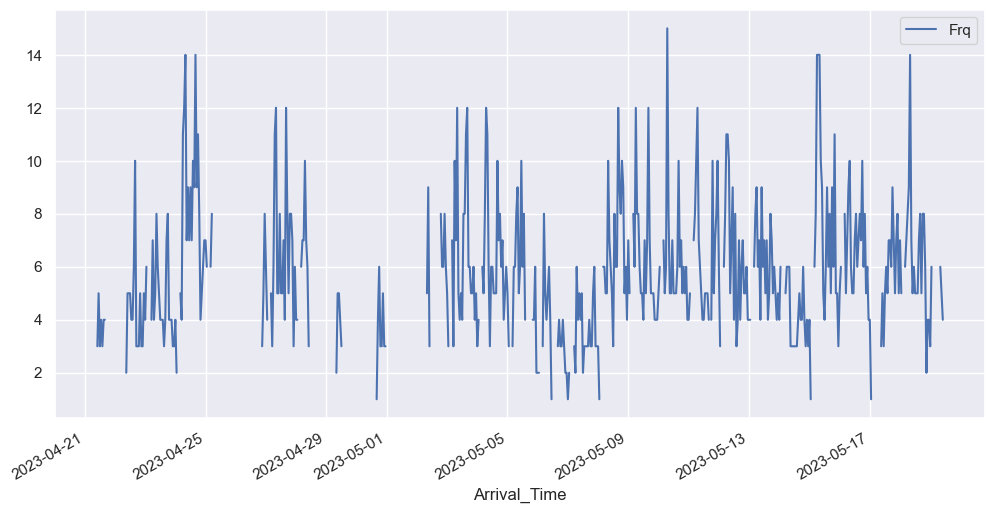

In [276]:
#plot
df_brn.set_index('Arrival_Time', inplace=True)
df_brn.plot()

In [277]:
#impute via linear interpolation
df_brn['Frq']= df_brn['Frq'].interpolate(method='linear')

<Axes: xlabel='Arrival_Time'>

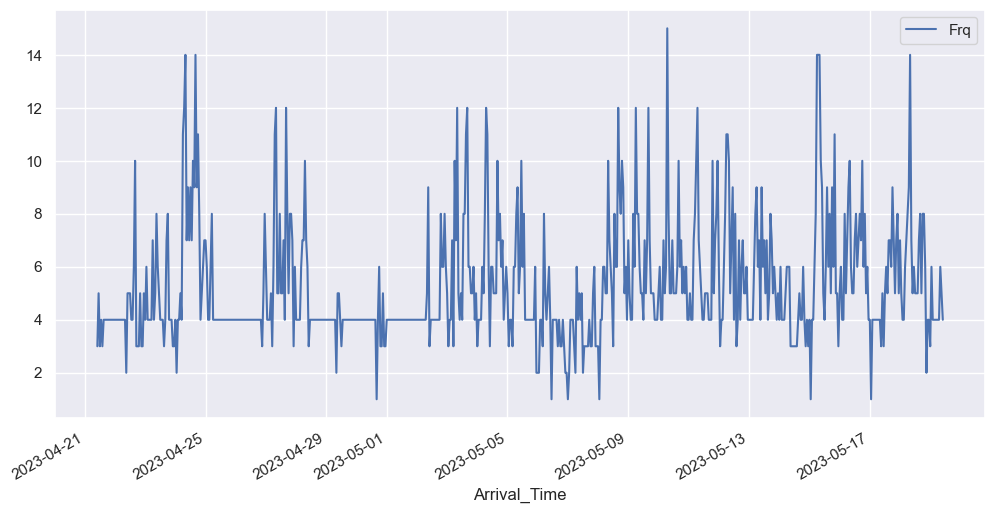

In [278]:
#and plot again
df_brn.plot()

In [279]:
#count check
len(df_brn)

673

In [280]:
#NOW THE REST OF THE LINES
#simplify dfs
df_red = df_red[["Arrival_Time", "Frq"]]
df_pink = df_pink[["Arrival_Time", "Frq"]]
df_purp = df_purp[["Arrival_Time", "Frq"]]
df_yell = df_yell[["Arrival_Time", "Frq"]]
df_blue = df_blue[["Arrival_Time", "Frq"]]
df_green = df_green[["Arrival_Time", "Frq"]]
df_org = df_org[["Arrival_Time", "Frq"]]

In [281]:
#what's our range?
to_red = df_red.Arrival_Time.max()
from_red = df_red.Arrival_Time.min()

to_pink = df_pink.Arrival_Time.max()
from_pink = df_pink.Arrival_Time.min()

to_purp = df_purp.Arrival_Time.max()
from_purp = df_purp.Arrival_Time.min()

to_yell = df_yell.Arrival_Time.max()
from_yell = df_yell.Arrival_Time.min()

to_blue = df_blue.Arrival_Time.max()
from_blue = df_blue.Arrival_Time.min()

to_green = df_green.Arrival_Time.max()
from_green = df_green.Arrival_Time.min()

to_org = df_org.Arrival_Time.max()
from_org = df_org.Arrival_Time.min()

print("Red Range: ",from_red," - ",to_red)
print("Pink Range: ",from_pink," - ",to_pink)
print("Purple Range: ",from_purp," - ",to_purp)
print("Yellow Range: ",from_yell," - ",to_yell)
print("Blue Range: ",from_blue," - ",to_blue)
print("Green Range: ",from_green," - ",to_green)
print("Orange Range: ",from_org," - ",to_org)
#they're all the same so we can use one df

Red Range:  2023-04-21 10:00:00  -  2023-05-19 11:00:00
Pink Range:  2023-04-21 10:00:00  -  2023-05-19 11:00:00
Purple Range:  2023-04-21 10:00:00  -  2023-05-19 11:00:00
Yellow Range:  2023-04-21 10:00:00  -  2023-05-19 11:00:00
Blue Range:  2023-04-21 10:00:00  -  2023-05-19 11:00:00
Green Range:  2023-04-21 10:00:00  -  2023-05-19 11:00:00
Orange Range:  2023-04-21 10:00:00  -  2023-05-19 11:00:00


In [282]:
#get a range of all hours between our start and end times
time_range = pd.DataFrame()
time_range["Arrival_Time"] = pd.date_range(start='2023-04-21 10:00:00', end='2023-05-19 11:00:00', freq='H')
time_range

,Arrival_Time
0,2023-04-21 10:00:00
1,2023-04-21 11:00:00
2,2023-04-21 12:00:00
3,2023-04-21 13:00:00
4,2023-04-21 14:00:00
...,...
669,2023-05-19 07:00:00
670,2023-05-19 08:00:00
671,2023-05-19 09:00:00
672,2023-05-19 10:00:00


In [283]:
#create Frq column with all null values
time_range['Frq'] = np.nan
time_range

,Arrival_Time,Frq
0,2023-04-21 10:00:00,NaN
1,2023-04-21 11:00:00,NaN
2,2023-04-21 12:00:00,NaN
3,2023-04-21 13:00:00,NaN
4,2023-04-21 14:00:00,NaN
...,...,...
669,2023-05-19 07:00:00,NaN
670,2023-05-19 08:00:00,NaN
671,2023-05-19 09:00:00,NaN
672,2023-05-19 10:00:00,NaN


In [284]:
#find missing datetime values
missing_red = time_range[~time_range.Arrival_Time.isin(df_red.Arrival_Time)]
missing_pink = time_range[~time_range.Arrival_Time.isin(df_pink.Arrival_Time)]
missing_purp = time_range[~time_range.Arrival_Time.isin(df_purp.Arrival_Time)]
missing_yell = time_range[~time_range.Arrival_Time.isin(df_yell.Arrival_Time)]
missing_blue = time_range[~time_range.Arrival_Time.isin(df_blue.Arrival_Time)]
missing_green = time_range[~time_range.Arrival_Time.isin(df_green.Arrival_Time)]
missing_org = time_range[~time_range.Arrival_Time.isin(df_org.Arrival_Time)]

In [285]:
#how many missing datetimes for each line?
print("Red: ",len(missing_red))
print("Pink: ",len(missing_pink))
print("Purple: ",len(missing_purp))
print("Yellow: ",len(missing_yell))
print("Blue: ",len(missing_blue))
print("Green: ",len(missing_green))
print("Orange: ",len(missing_org))

Red:  165
Pink:  211
Purple:  235
Yellow:  256
Blue:  325
Green:  209
Orange:  193


In [286]:
#how many existing datetimes for each line?
print("Red: ",len(df_red))
print("Pink: ",len(df_pink))
print("Purple: ",len(df_purp))
print("Yellow: ",len(df_yell))
print("Blue: ",len(df_blue))
print("Green: ",len(df_green))
print("Orange: ",len(df_org))

Red:  509
Pink:  463
Purple:  439
Yellow:  418
Blue:  349
Green:  465
Orange:  481


In [287]:
#merge missing values with existing values
df_red = df_red.merge(missing_red, how='outer')
df_pink = df_pink.merge(missing_pink, how='outer')
df_purp = df_purp.merge(missing_purp, how='outer')
df_yell = df_yell.merge(missing_yell, how='outer')
df_blue = df_blue.merge(missing_blue, how='outer')
df_green = df_green.merge(missing_green, how='outer')
df_org = df_org.merge(missing_org, how='outer')

<Axes: title={'center': 'Orange'}, xlabel='Arrival_Time'>

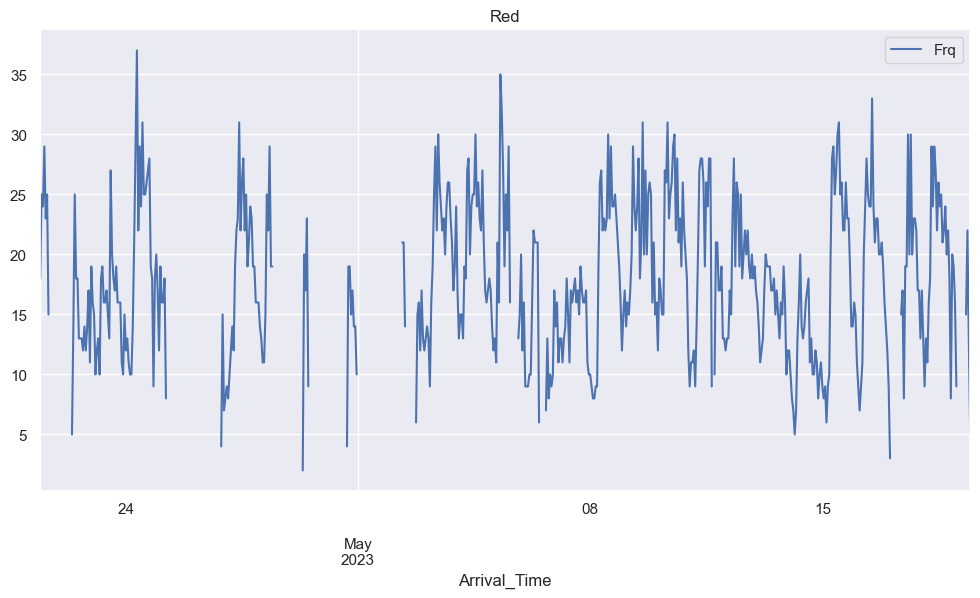

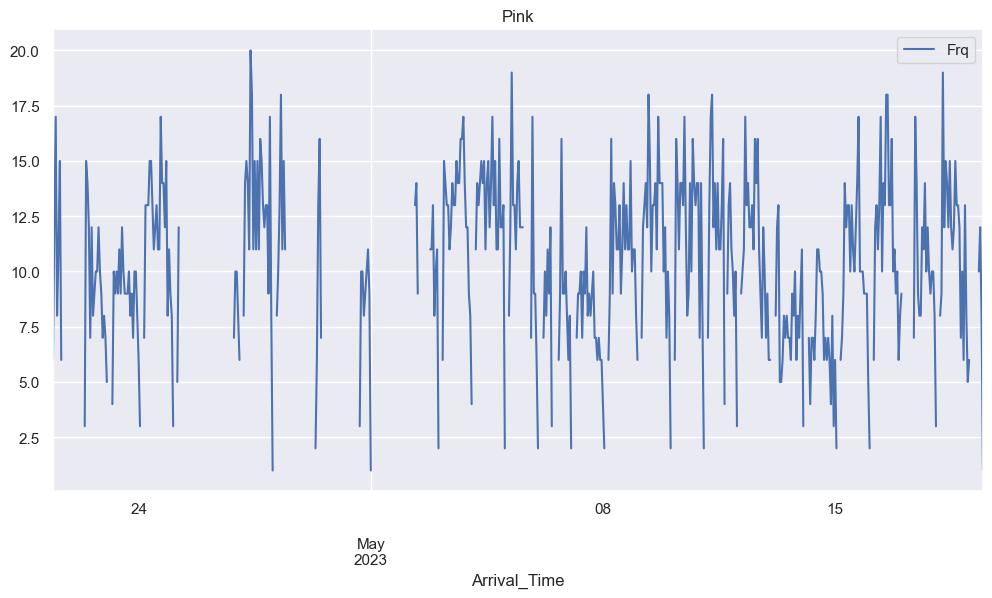

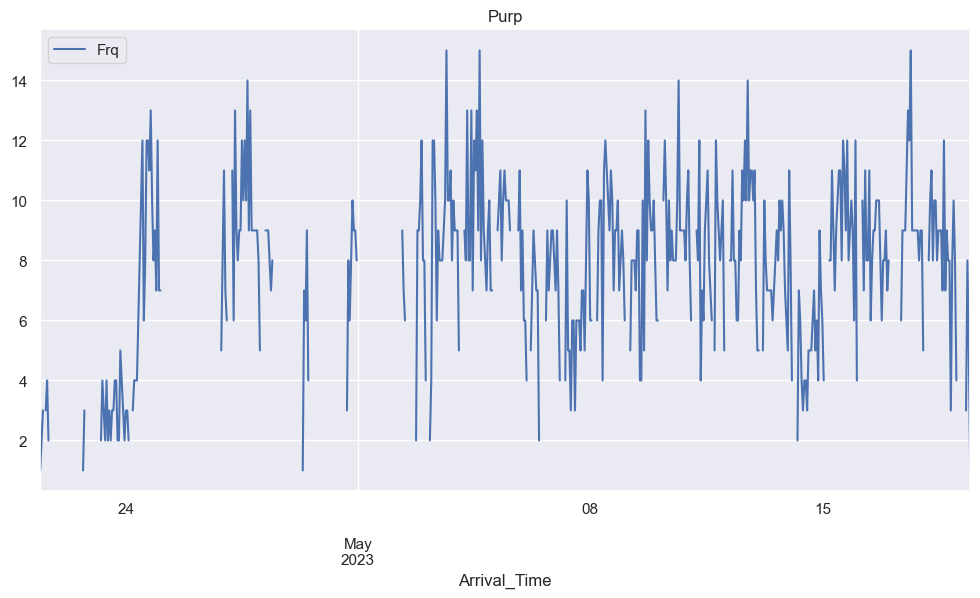

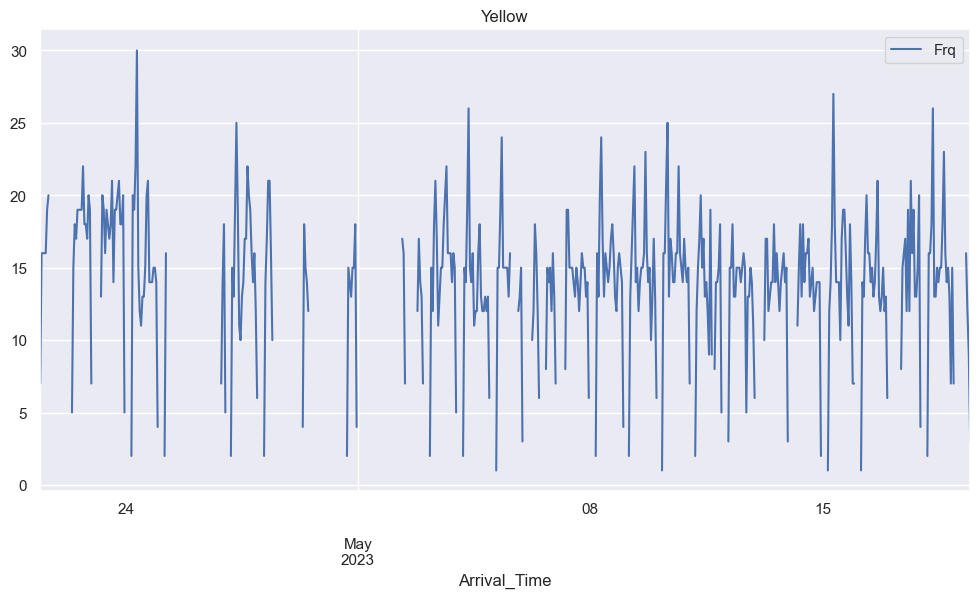

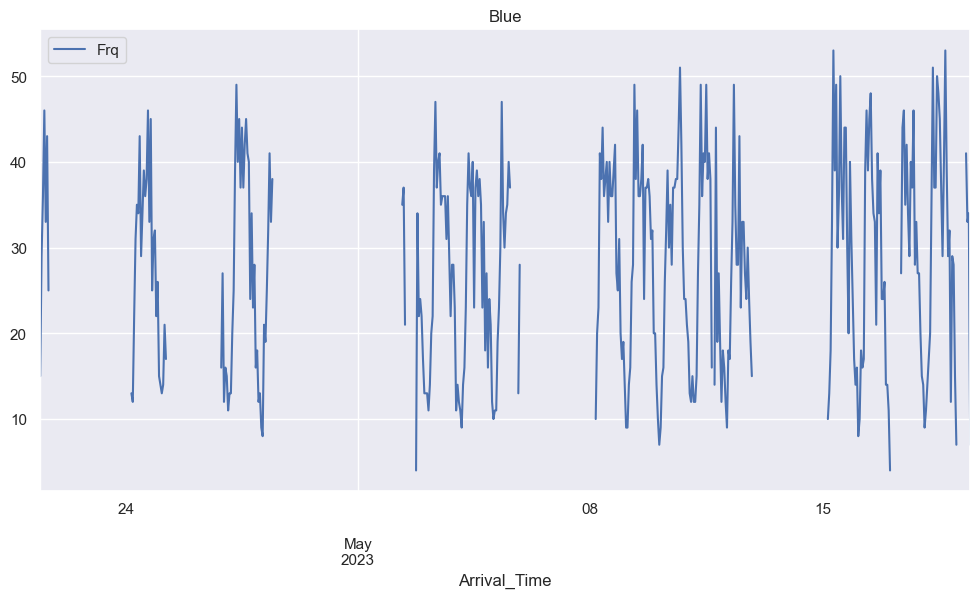

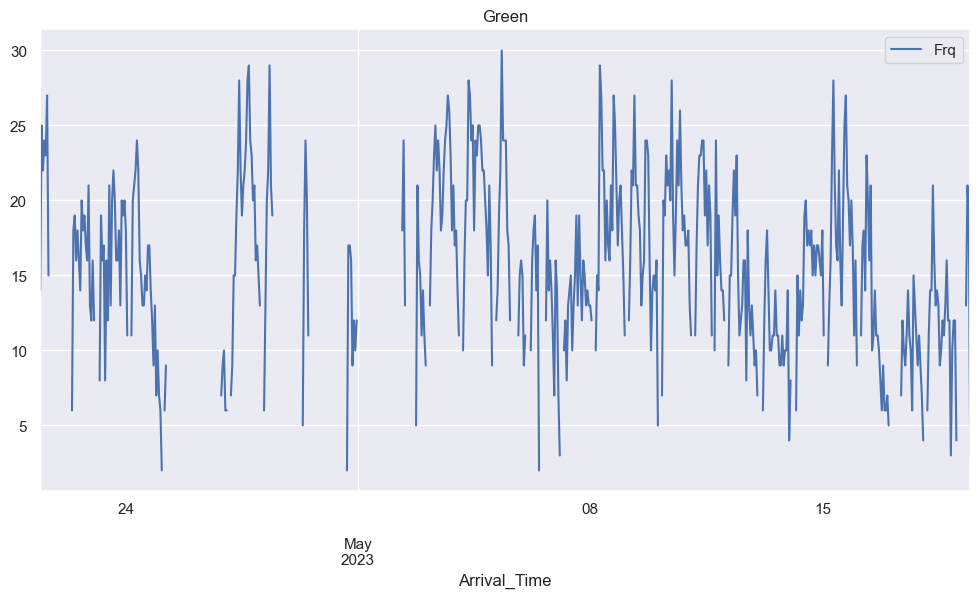

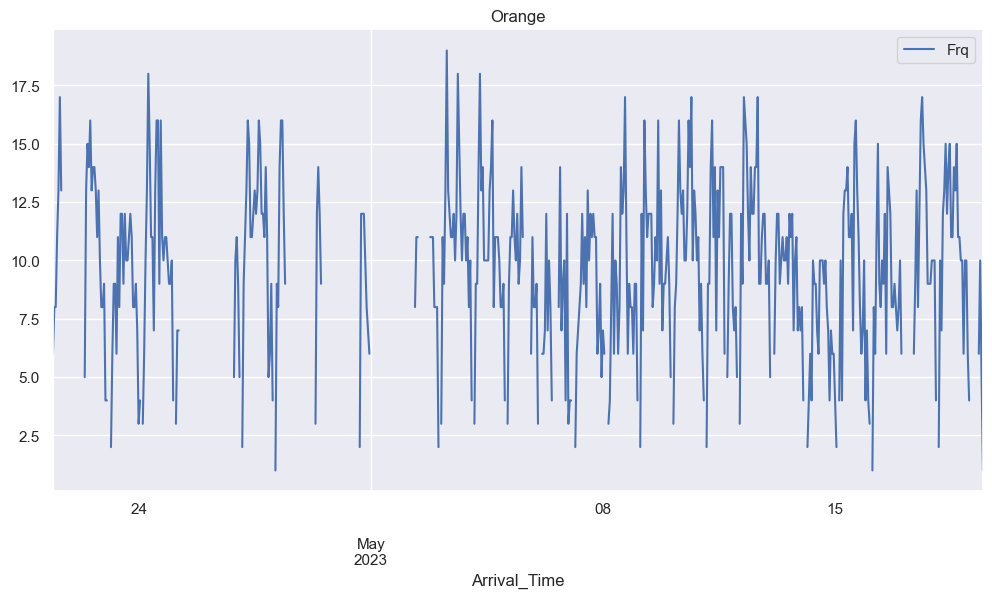

In [288]:
#set index to Arrival Times and plot to view missing values
df_red.set_index('Arrival_Time', inplace=True)
df_pink.set_index('Arrival_Time', inplace=True)
df_purp.set_index('Arrival_Time', inplace=True)
df_yell.set_index('Arrival_Time', inplace=True)
df_blue.set_index('Arrival_Time', inplace=True)
df_green.set_index('Arrival_Time', inplace=True)
df_org.set_index('Arrival_Time', inplace=True)
df_red.sort_index(inplace=True)
df_pink.sort_index(inplace=True)
df_purp.sort_index(inplace=True)
df_yell.sort_index(inplace=True)
df_blue.sort_index(inplace=True)
df_green.sort_index(inplace=True)
df_org.sort_index(inplace=True)
df_brn.sort_index(inplace=True)
df_red.plot(title='Red')
df_pink.plot(title='Pink')
df_purp.plot(title='Purp')
df_yell.plot(title='Yellow')
df_blue.plot(title='Blue')
df_green.plot(title='Green')
df_org.plot(title='Orange')

In [289]:
#impute via linear interpolation
df_red['Frq']= df_red['Frq'].interpolate(method='linear')
df_pink['Frq']= df_pink['Frq'].interpolate(method='linear')
df_purp['Frq']= df_purp['Frq'].interpolate(method='linear')
df_yell['Frq']= df_yell['Frq'].interpolate(method='linear')
df_blue['Frq']= df_blue['Frq'].interpolate(method='linear')
df_green['Frq']= df_green['Frq'].interpolate(method='linear')
df_org['Frq']= df_org['Frq'].interpolate(method='linear')

<Axes: title={'center': 'Orange'}, xlabel='Arrival_Time'>

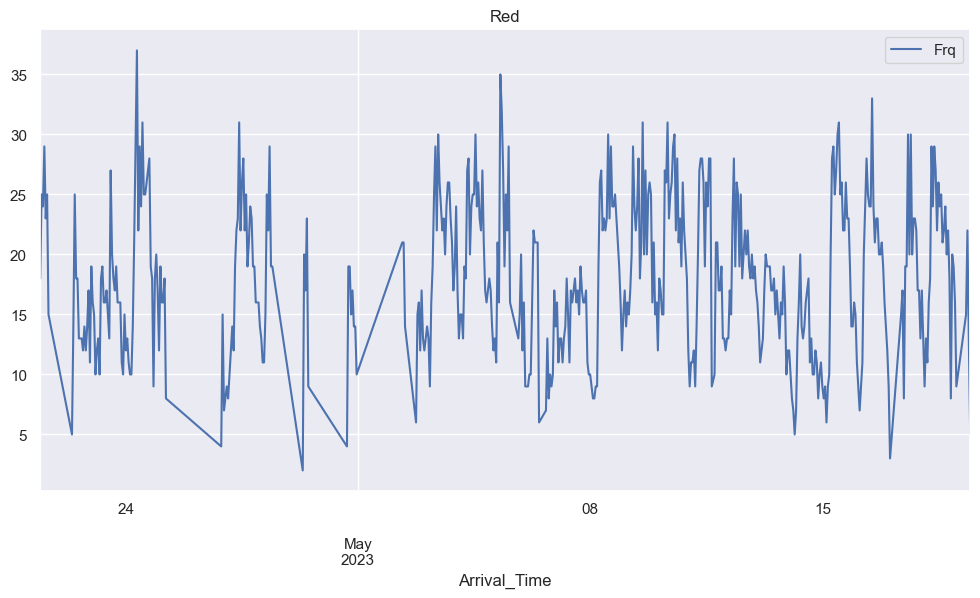

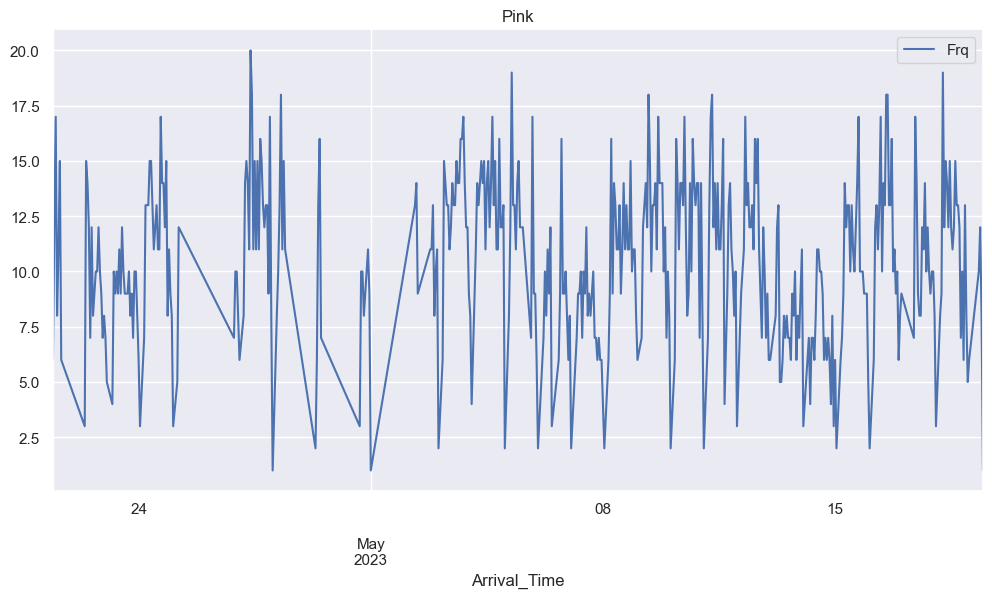

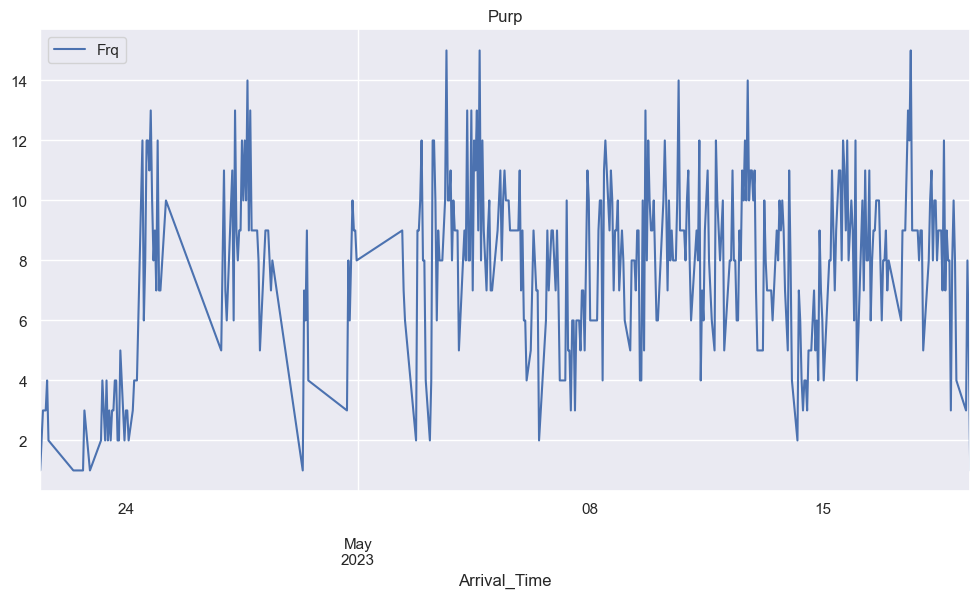

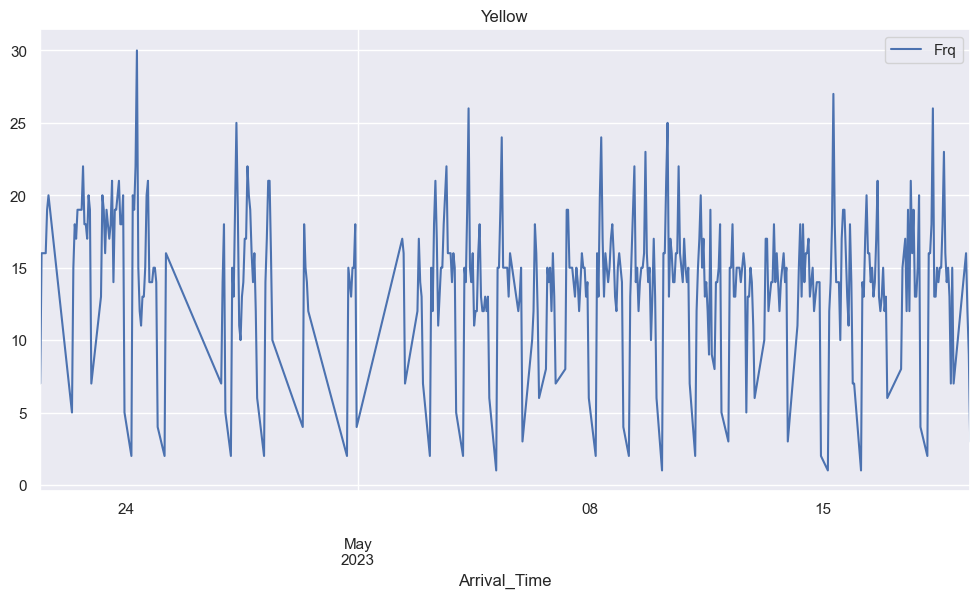

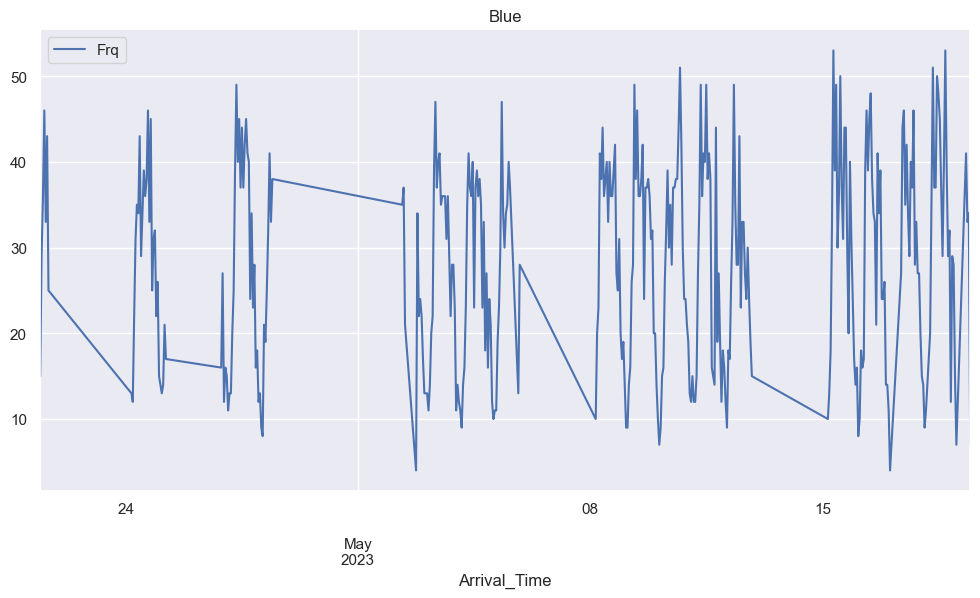

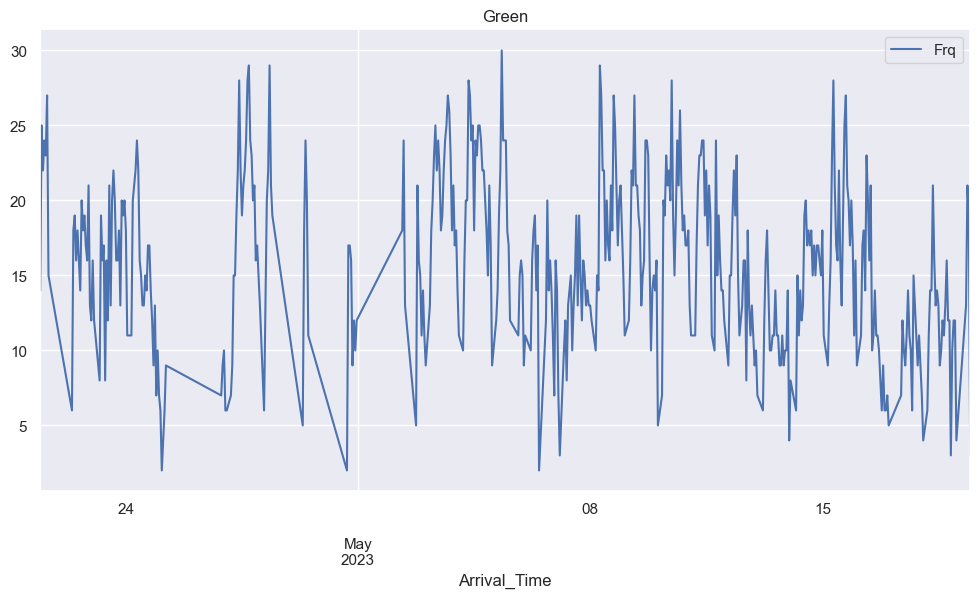

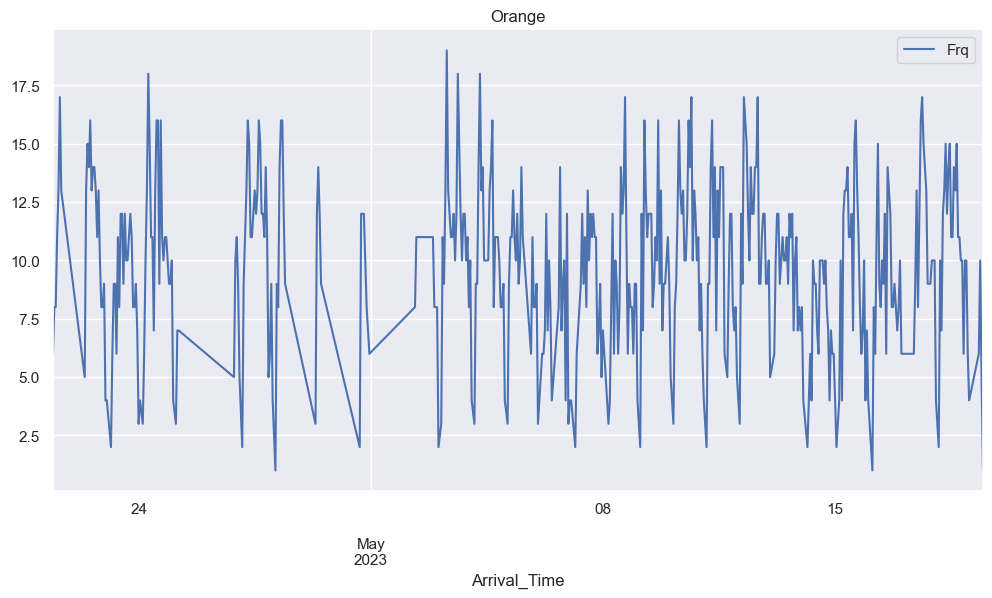

In [290]:
#and plot again
df_red.plot(title='Red')
df_pink.plot(title='Pink')
df_purp.plot(title='Purp')
df_yell.plot(title='Yellow')
df_blue.plot(title='Blue')
df_green.plot(title='Green')
df_org.plot(title='Orange')

In [291]:
#count check
print(len(df_red)," ?= ",len(missing_red)+509)
print(len(df_pink)," ?= ",len(missing_pink)+463)
print(len(df_purp)," ?= ",len(missing_purp)+439)
print(len(df_yell)," ?= ",len(missing_yell)+418)
print(len(df_blue)," ?= ",len(missing_blue)+349)
print(len(df_green)," ?= ",len(missing_green)+465)
print(len(df_org)," ?= ",len(missing_org)+481)

674  ?=  674
674  ?=  674
674  ?=  674
674  ?=  674
674  ?=  674
674  ?=  674
674  ?=  674


# Predict

## Red - Complete

### Check Stationarity

In [292]:
#Get a first look at stationarity with a Dickey-Fuller Test

from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(24).mean()
    rolstd = timeseries.rolling(24).std()
#Plot rolling statistics:
    plt.plot(timeseries, color='blue',label='Original')
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

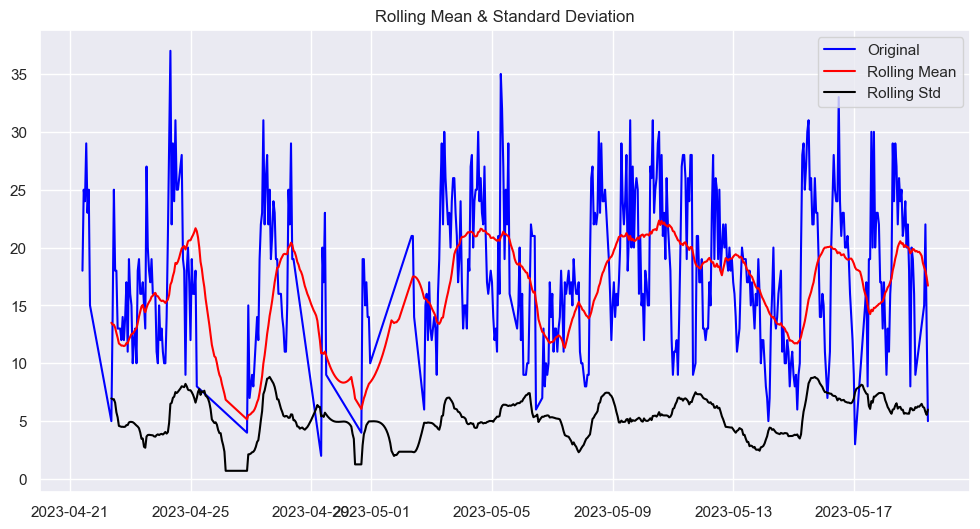

Results of Dickey-Fuller Test:
Test Statistic                -6.922747e+00
p-value                        1.135423e-09
#Lags Used                     2.000000e+00
Number of Observations Used    6.710000e+02
Critical Value (1%)           -3.440133e+00
Critical Value (5%)           -2.865857e+00
Critical Value (10%)          -2.569069e+00
dtype: float64


In [293]:
#We're looking for constant mean, no visible patterns/trends, 
#and a test statistic < critical value

test_stationarity(df_red)

#test statistic is less than 1% critical value, good
#mean and std aren't so constant, could be better
#not super visible pattern, okay

In [294]:
#remove trend and seasonality via differencing
#df_red['First Difference'] = df_red['Frq'] - df_red['Frq'].shift(1)
df_red['Diff'] = df_red['Frq'] - df_red['Frq'].shift(1)
df_red.head()

,Frq,Diff
Arrival_Time,,
2023-04-21 10:00:00,18.0,NaN
2023-04-21 11:00:00,25.0,7.0
2023-04-21 12:00:00,24.0,-1.0
2023-04-21 13:00:00,29.0,5.0
2023-04-21 14:00:00,23.0,-6.0


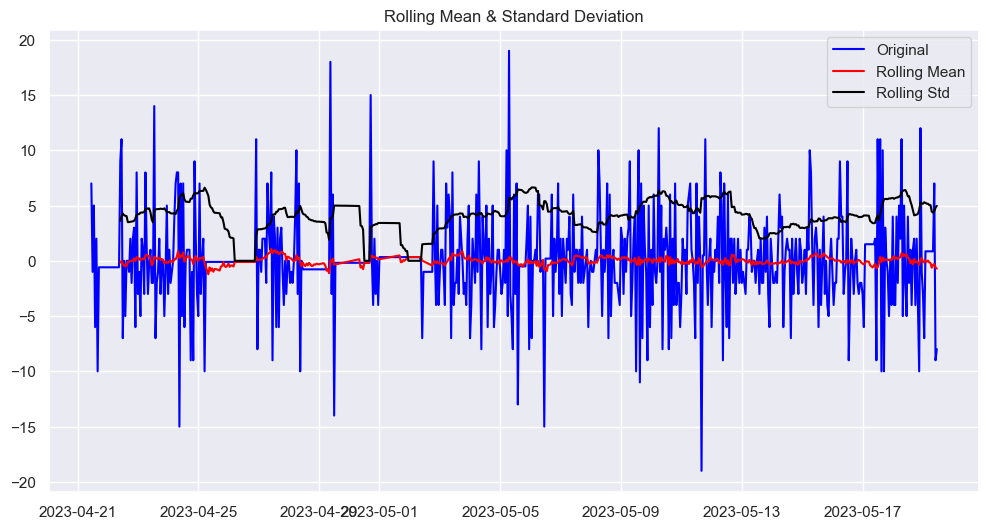

Results of Dickey-Fuller Test:
Test Statistic                -1.010681e+01
p-value                        1.024792e-17
#Lags Used                     2.000000e+01
Number of Observations Used    6.520000e+02
Critical Value (1%)           -3.440419e+00
Critical Value (5%)           -2.865983e+00
Critical Value (10%)          -2.569136e+00
dtype: float64


In [295]:
#test for stationarity again

#first remove the na's created by the shifting
df_red.dropna(inplace=True)
df_red.sort_index(inplace=True)
test_stationarity(df_red['Diff'])
#looking much better
#mean is constant
#no visibile pattern
#test statistic is less than 1% confidence level
#we will want to make sure to use differencing in our model

### Build Model

Now that we've taken care of stationarity, let's assess how to build an ARIMA prediction model
- Good for short-term forecasting
- Only needs historical data

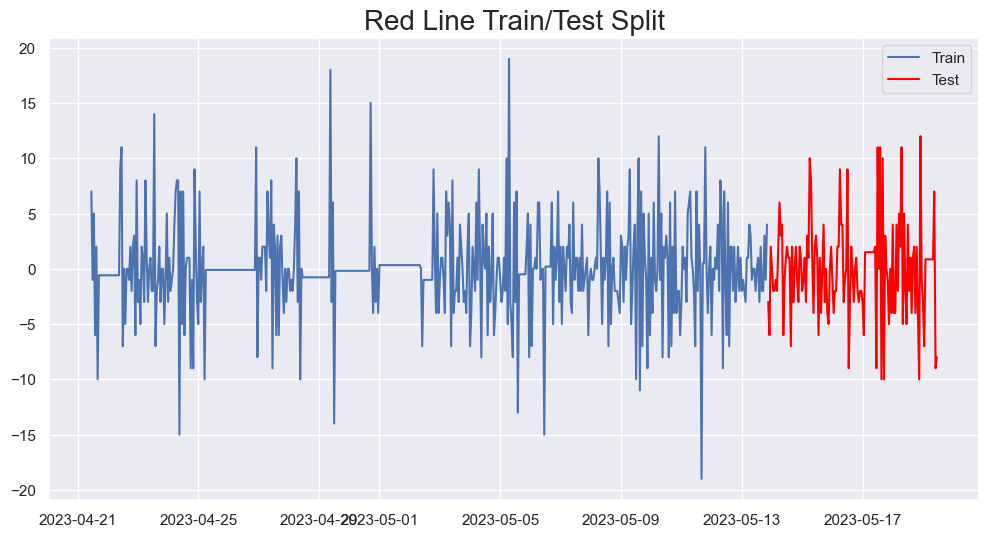

In [296]:
# split into train and test sets
X = df_red['Diff']
size = int(len(X) * 0.8)
df_train, df_test = X[0:size], X[size:len(X)]

#visualize train test split
plt.title('Red Line Train/Test Split', size=20)
plt.plot(df_train, label='Train')
plt.plot(df_test, label='Test', color='red')
plt.legend();

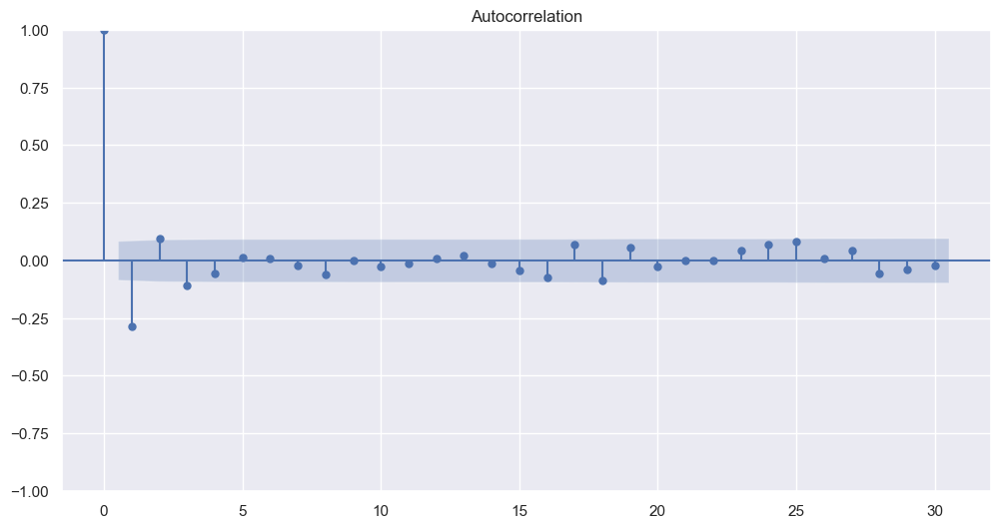

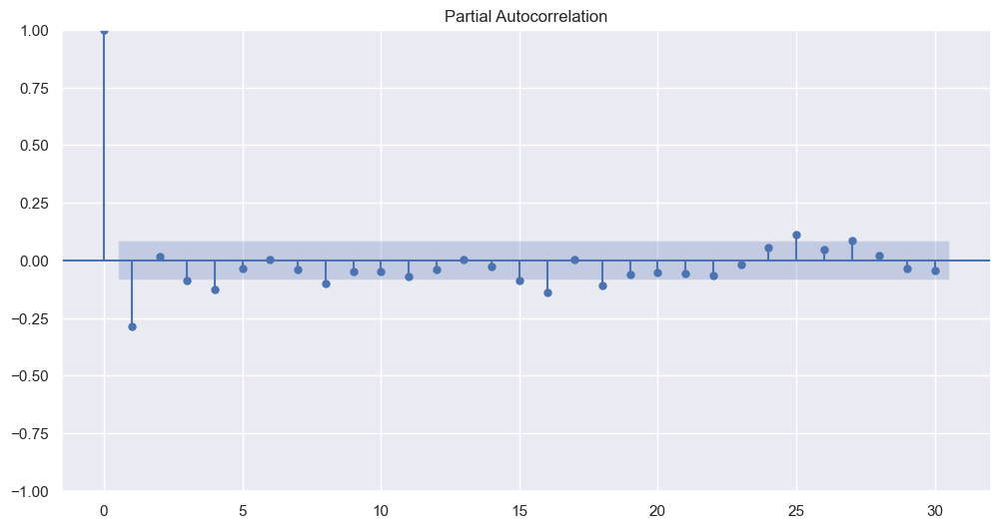

In [297]:
#Need to figure out p and q values
#Plot ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#from statsmodels.tsa.stattools import acf, pacf

acf_original = plot_acf(df_train, lags=30)
pacf_original = plot_pacf(df_train, lags=30)

#because we see ACF and PACF following similar behavior of a big drop
#at the beginning and then a gradual decline, we will combine the
# Auto Regressive (AR), Moving Average (MA), and Integrated (differencing)
#model -- ARIMA

#based on where the residuals cross the confidence interval in PACF, let's
#try p = 3
#based on where the residuals cross the confidence interval in ACF, let's
#try q = 12
#try d = 0 because we already adjusted with differencing

In [298]:
#build a first model
from statsmodels.tsa.arima.model import ARIMA
model=ARIMA(df_train,order=(1,0,1)) #p,d,q
model_fit=model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   Diff   No. Observations:                  538
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -1510.623
Date:                Sat, 27 May 2023   AIC                           3029.245
Time:                        13:38:19   BIC                           3046.397
Sample:                    04-21-2023   HQIC                          3035.954
                         - 05-13-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0023      0.147     -0.016      0.988      -0.290       0.286
ar.L1         -0.3800      0.123     -3.095      0.002      -0.621      -0.139
ma.L1          0.1026      0.129      0.794      0.427      -0.151       0.356
sigma2        16.0818      0.606     26.552      0.000      14.895      17.269
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               280.57
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               1.23   Skew:                             0.38
Prob(H) (two-sided):                  0.16   Kurtosis:                         6.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [299]:
# Import the library
from pmdarima import auto_arima
  
# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

#use stepwise autoarima to find best fit including seasonal order
stepwise_fit = auto_arima(df_train, start_p = 1, start_q = 1,
                          max_p = 3, max_q = 3, m = 24,
                          start_P = 0, seasonal = True, 
                          d = None, D = 1,
                          trace = True,
                          error_action ='ignore',   # we don't want to know if an order does not work
                          suppress_warnings = True,  # we don't want convergence warnings
                          stepwise = True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=3.94 sec
 ARIMA(0,0,0)(0,1,0)[24] intercept   : AIC=3266.556, Time=0.11 sec
 ARIMA(1,0,0)(1,1,0)[24] intercept   : AIC=3049.166, Time=1.24 sec
 ARIMA(0,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=1.72 sec
 ARIMA(0,0,0)(0,1,0)[24]             : AIC=3264.557, Time=0.08 sec
 ARIMA(1,0,0)(0,1,0)[24] intercept   : AIC=3189.684, Time=0.28 sec
 ARIMA(1,0,0)(2,1,0)[24] intercept   : AIC=2977.125, Time=3.98 sec
 ARIMA(1,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=5.36 sec
 ARIMA(1,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=2.37 sec
 ARIMA(0,0,0)(2,1,0)[24] intercept   : AIC=3046.268, Time=2.48 sec
 ARIMA(2,0,0)(2,1,0)[24] intercept   : AIC=2978.231, Time=5.20 sec
 ARIMA(1,0,1)(2,1,0)[24] intercept   : AIC=2975.415, Time=5.65 sec
 ARIMA(1,0,1)(1,1,0)[24] intercept   : AIC=3050.358, Time=1.85 sec
 ARIMA(1,0,1)(2,1,1)[24] intercept   : AIC=inf, Time=11.62 sec
 ARIMA(1,0,1)(1,1,1)[24] intercept   : AIC=

In [300]:
#use results from stepwise to train model on training set
#SARIMA:Seasonal ARIMA

from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(df_train, 
                order = (0, 0, 1), 
                seasonal_order =(2, 1, 0, 24))
  
result = model.fit()
result.summary()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.79844D+00    |proj g|=  6.59504D-02


 This problem is unconstrained.



At iterate    5    f=  2.75423D+00    |proj g|=  7.51193D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4      8     11      1     0     0   5.615D-06   2.754D+00
  F =   2.7542292133861443     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                Diff   No. Observations:                  538
Model:             SARIMAX(0, 0, 1)x(2, 1, [], 24)   Log Likelihood               -1481.775
Date:                             Sat, 27 May 2023   AIC                           2971.551
Time:                                     13:40:38   BIC                           2988.520
Sample:                                 04-21-2023   HQIC                          2978.201
                                      - 05-13-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.4001      0.034    -11.649      0.000      -0.467      -0.333
ar.S.L24      -0.6769      0.035    -19.117      0.000      -0.746      -0.607
ar.S.L48      -0.3967      0.038    -10.535      0.000      -0.471      -0.323
sigma2        18.1551      0.854     21.250      0.000      16.481      19.830
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                59.83
Prob(Q):                              0.92   Prob(JB):                         0.00
Heteroskedasticity (H):               0.82   Skew:                             0.12
Prob(H) (two-sided):                  0.20   Kurtosis:                         4.66
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

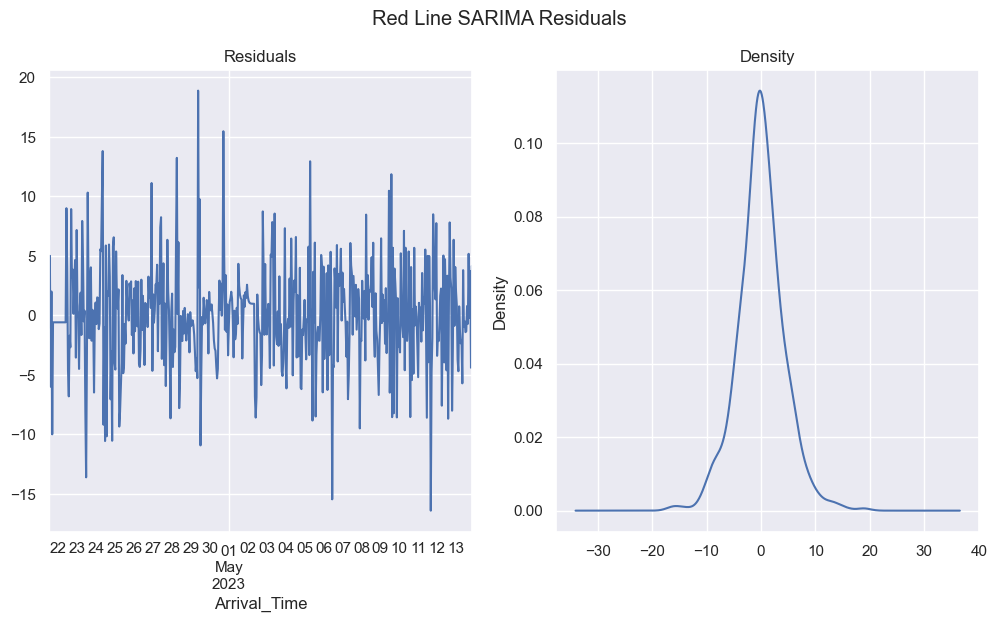

In [301]:
#check residuals
import matplotlib.pyplot as plt
residuals = result.resid[1:]
fig, ax = plt.subplots(1,2)
residuals.plot(title='Residuals', ax=ax[0])
residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.suptitle("Red Line SARIMA Residuals")
plt.show()
#residuals looks good
#random noise on the left
#normally distributed about the mean on the right

### Predict

In [302]:
#use sarima model to predict on test data set
start = len(df_train)
end = len(df_train) + len(df_test) - 1

predictions = result.predict(start, end,
                             typ = 'levels').rename("Predictions")+df_red['Frq'] #undifference

<Axes: title={'center': 'Red Line Predictions'}, xlabel='Arrival_Time'>

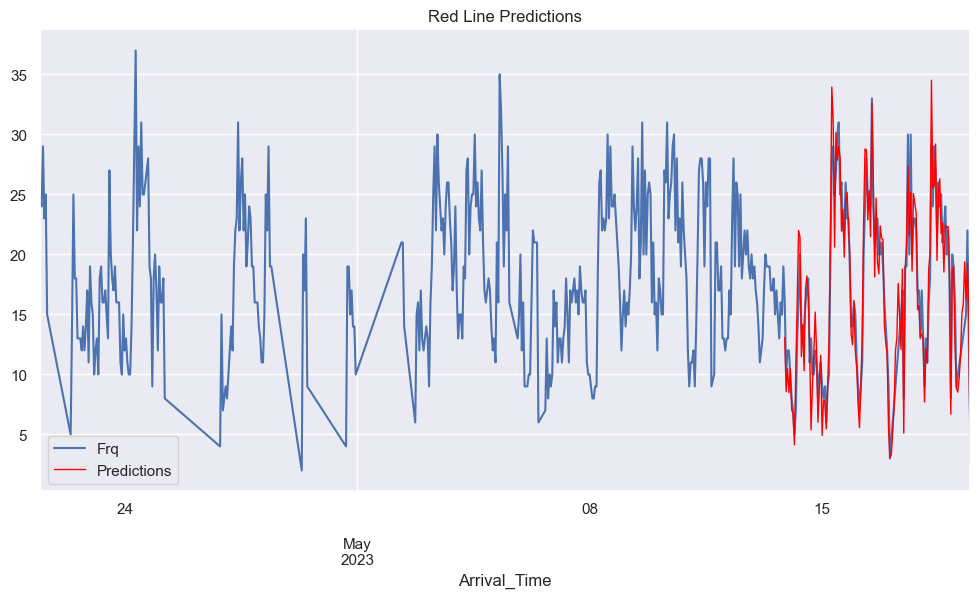

In [303]:
# plot predictions and actual values, showing whole dataset
df_red['Frq'].plot(legend = True)
predictions.plot(legend = True, title="Red Line Predictions", label='Predictions', lw=1, color="red")

<Axes: title={'center': 'Red Line Predictions'}, xlabel='Arrival_Time'>

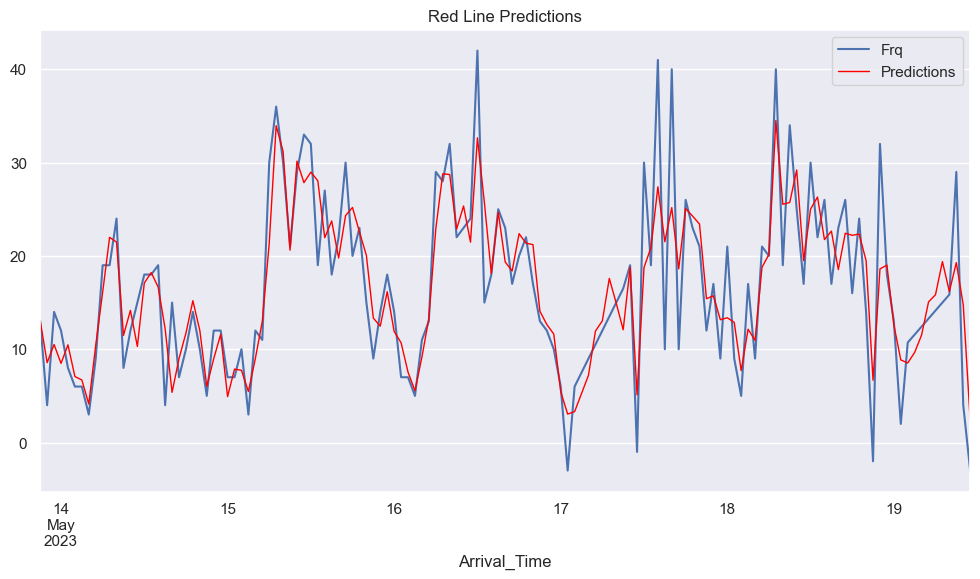

In [304]:
# plot predictions and actual values, zoom on testing dataset
df_test_undiff = df_test+df_red['Frq'] #undiff
df_test_undiff.dropna(inplace=True)
predictions.dropna(inplace=True)
df_test_undiff.plot(legend = True, label="Frq")
predictions.plot(legend = True, title="Red Line Predictions", label="Predictions", color="red", lw=1)

### Evaluate

In [305]:
# Load specific evaluation tools
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
  
# Calculate root mean squared error
rmse(df_test_undiff, predictions)

#example interpretation: The weighted average error between the predictions and actuals in this dataset is 9.55, which is likely a good value given that the average actual height in the dataset is 170.

4.714769246875975

### Forecast

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.08612D+00    |proj g|=  6.72623D-02

At iterate    5    f=  3.00044D+00    |proj g|=  5.59129D-02

At iterate   10    f=  2.99904D+00    |proj g|=  8.83388D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     11     13      1     0     0   8.673D-07   2.999D+00
  F =   2.9990393231491588     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<Axes: xlabel='Arrival_Time'>

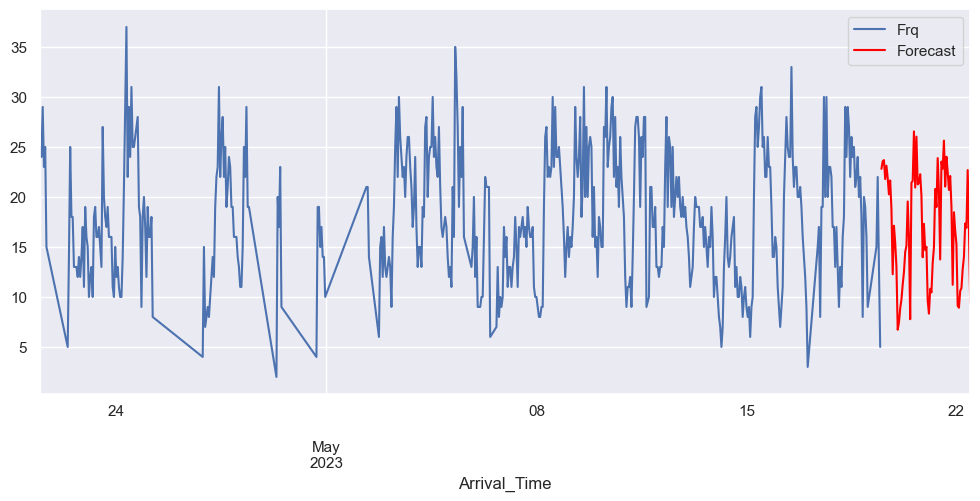

In [307]:
# Train the model on the full dataset
model = model = SARIMAX(df_red['Frq'], 
                        order = (0, 0, 1), 
                        seasonal_order =(2, 1, 0, 24))
result = model.fit()
  
# Forecast for the next 3 years
forecast = result.predict(start = len(df_red), 
                          end = (len(df_red)-1) + 3 * 24, 
                          typ = 'levels').rename('Forecast')
  
# Plot the forecast values
df_red['Frq'].plot(figsize = (12, 5), legend = True)
forecast.plot(legend = True, color="red")

In [308]:
#final model summary
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                 Frq   No. Observations:                  673
Model:             SARIMAX(0, 0, 1)x(2, 1, [], 24)   Log Likelihood               -2018.353
Date:                             Sat, 27 May 2023   AIC                           4044.707
Time:                                     13:42:39   BIC                           4062.609
Sample:                                 04-21-2023   HQIC                          4051.651
                                      - 05-19-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.5161      0.032     16.354      0.000       0.454       0.578
ar.S.L24      -0.5228      0.034    -15.225      0.000      -0.590      -0.456
ar.S.L48      -0.4367      0.033    -13.171      0.000      -0.502      -0.372
sigma2        28.8073      1.506     19.124      0.000      25.855      31.760
===================================================================================
Ljung-Box (L1) (Q):                  50.28   Jarque-Bera (JB):                 5.52
Prob(Q):                              0.00   Prob(JB):                         0.06
Heteroskedasticity (H):               0.69   Skew:                             0.18
Prob(H) (two-sided):                  0.01   Kurtosis:                         3.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Brown - Complete

### Check Stationarity

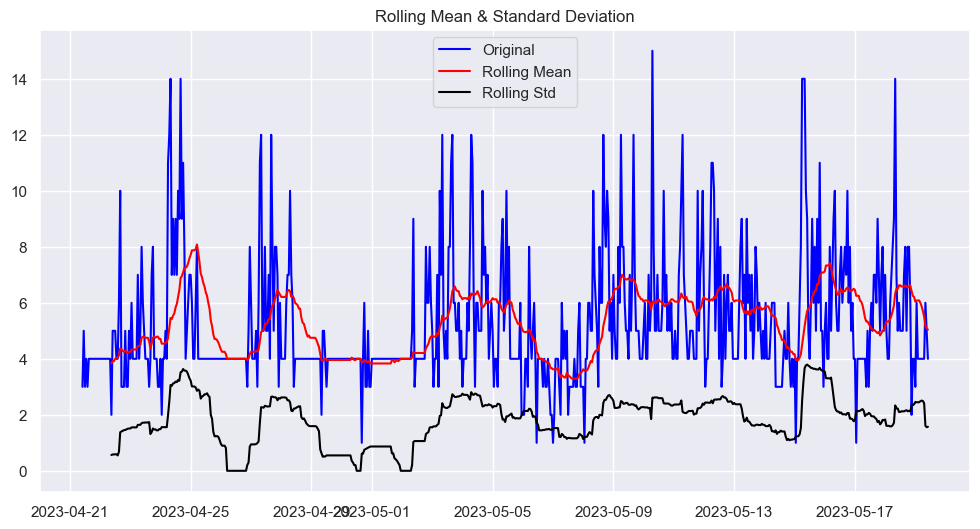

Results of Dickey-Fuller Test:
Test Statistic                -5.787799e+00
p-value                        4.952478e-07
#Lags Used                     7.000000e+00
Number of Observations Used    6.650000e+02
Critical Value (1%)           -3.440222e+00
Critical Value (5%)           -2.865896e+00
Critical Value (10%)          -2.569090e+00
dtype: float64


In [309]:
#Get a first look at stationarity with a Dickey-Fuller Test
#We're looking for constant mean, no visible patterns/trends, 
#and a test statistic < critical value

test_stationarity(df_brn)

#test statistic is less than 1% critical value, good
#mean and std aren't so constant, could be better
#not super visible pattern, okay

In [310]:
#remove trend and seasonality via differencing
df_brn['Diff'] = df_brn['Frq'] - df_brn['Frq'].shift(1)
df_brn.head()

,Frq,Diff
Arrival_Time,,
2023-04-21 10:00:00,3.0,NaN
2023-04-21 11:00:00,5.0,2.0
2023-04-21 12:00:00,3.0,-2.0
2023-04-21 13:00:00,4.0,1.0
2023-04-21 14:00:00,3.0,-1.0


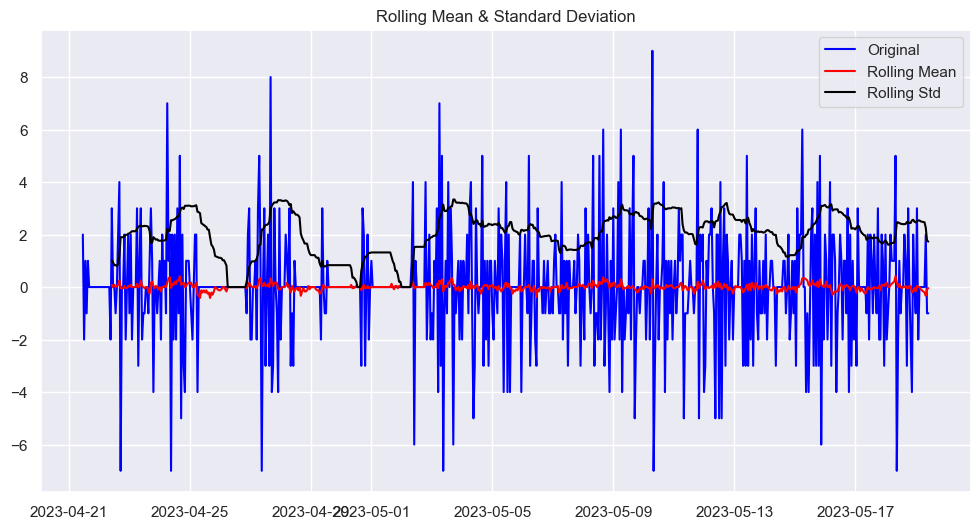

Results of Dickey-Fuller Test:
Test Statistic                -8.889172e+00
p-value                        1.256071e-14
#Lags Used                     2.000000e+01
Number of Observations Used    6.510000e+02
Critical Value (1%)           -3.440435e+00
Critical Value (5%)           -2.865990e+00
Critical Value (10%)          -2.569140e+00
dtype: float64


In [311]:
#test for stationarity again

#first remove the na's created by the shifting
df_brn.dropna(inplace=True)
df_brn.sort_index(inplace=True)
test_stationarity(df_brn['Diff'])
#looking much better
#mean is constant
#no visibile pattern
#test statistic is less than 1% confidence level
#we will want to make sure to use differencing in our model

### Build Model

Now that we've taken care of stationarity, let's assess how to build an ARIMA prediction model
- Good for short-term forecasting
- Only needs historical data

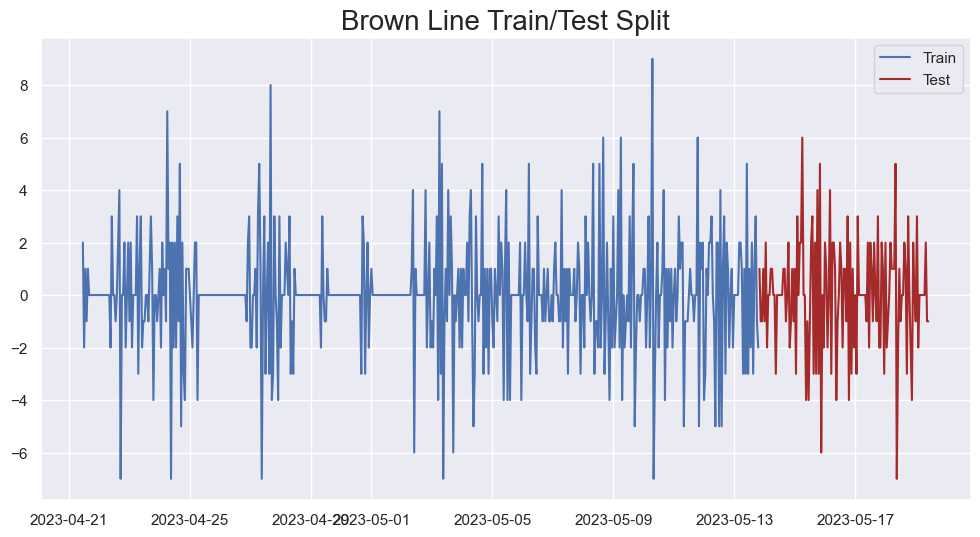

In [361]:
# split into train and test sets
X = df_brn['Diff']
size = int(len(X) * 0.8)
df_train, df_test = X[0:size], X[size:len(X)]

#visualize train test split
plt.title('Brown Line Train/Test Split', size=20)
plt.plot(df_train, label='Train')
plt.plot(df_test, label='Test', color='brown')
plt.legend();

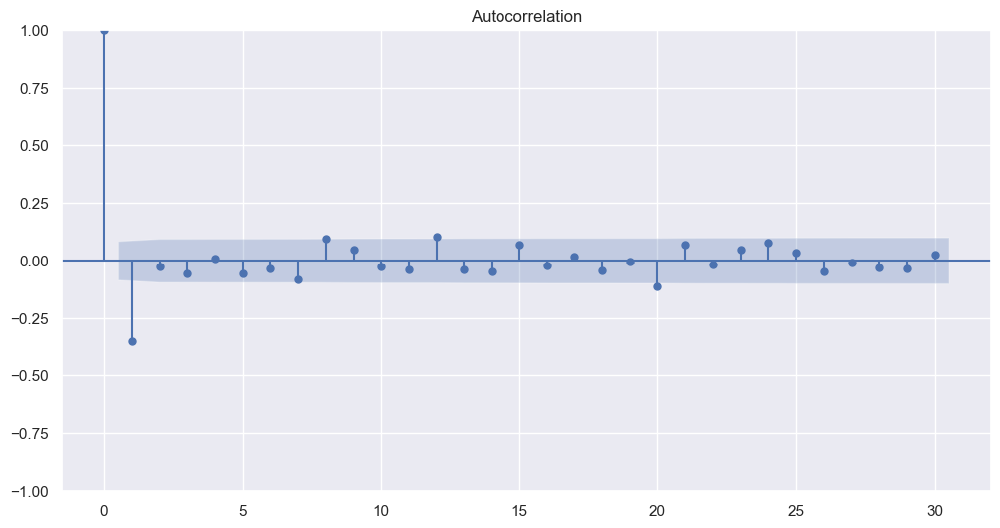

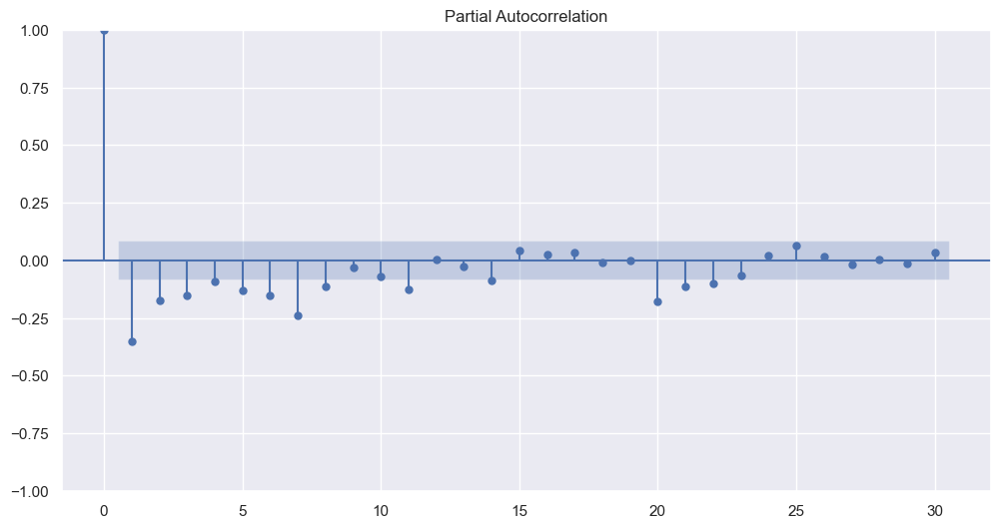

In [313]:
#Need to figure out p and q values
#Plot ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#from statsmodels.tsa.stattools import acf, pacf

acf_original = plot_acf(df_train, lags=30)
pacf_original = plot_pacf(df_train, lags=30)

#because we see ACF and PACF following similar behavior of a big drop
#at the beginning and then a gradual decline, we will combine the
# Auto Regressive (AR), Moving Average (MA), and Integrated (differencing)
#model -- ARIMA

#based on where the residuals cross the confidence interval in PACF, let's
#try p = 4
#based on where the residuals cross the confidence interval in ACF, let's
#try q = 2
#try d = 0 because we already adjusted with differencing

In [363]:
#build a first model
from statsmodels.tsa.arima.model import ARIMA
model=ARIMA(df_train,order=(4,0,2)) #p,d,q
model_fit=model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   Diff   No. Observations:                  537
Model:                 ARIMA(4, 0, 2)   Log Likelihood               -1085.291
Date:                Sat, 27 May 2023   AIC                           2186.581
Time:                        16:53:12   BIC                           2220.869
Sample:                    04-21-2023   HQIC                          2199.994
                         - 05-13-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0039      0.012      0.323      0.747      -0.020       0.027
ar.L1         -0.4221      0.420     -1.006      0.314      -1.244       0.400
ar.L2          0.4075      0.174      2.336      0.019       0.066       0.749
ar.L3          0.0502      0.072      0.695      0.487      -0.091       0.192
ar.L4          0.0011      0.053      0.020      0.984      -0.104       0.106
ma.L1         -0.1337      0.417     -0.321      0.748      -0.951       0.684
ma.L2         -0.7588      0.397     -1.913      0.056      -1.536       0.019
sigma2         3.3263      0.158     21.019      0.000       3.016       3.637
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               320.27
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               1.27   Skew:                             1.22
Prob(H) (two-sided):                  0.11   Kurtosis:                         5.89
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [364]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   Diff   No. Observations:                  537
Model:                 ARIMA(4, 0, 2)   Log Likelihood               -1085.291
Date:                Sat, 27 May 2023   AIC                           2186.581
Time:                        16:53:15   BIC                           2220.869
Sample:                    04-21-2023   HQIC                          2199.994
                         - 05-13-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0039      0.012      0.323      0.747      -0.020       0.027
ar.L1         -0.4221      0.420     -1.006      0.314      -1.244       0.400
ar.L2          0.4075      0.174      2.336      0.019       0.066       0.749
ar.L3          0.0502      0.072      0.695      0.487      -0.091       0.192
ar.L4          0.0011      0.053      0.020      0.984      -0.104       0.106
ma.L1         -0.1337      0.417     -0.321      0.748      -0.951       0.684
ma.L2         -0.7588      0.397     -1.913      0.056      -1.536       0.019
sigma2         3.3263      0.158     21.019      0.000       3.016       3.637
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               320.27
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               1.27   Skew:                             1.22
Prob(H) (two-sided):                  0.11   Kurtosis:                         5.89
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [315]:
# Import the library
from pmdarima import auto_arima
  
# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

#use stepwise autoarima to find best fit including seasonal order
stepwise_fit = auto_arima(df_train, start_p = 1, start_q = 1,
                          max_p = 3, max_q = 3, m = 24,
                          start_P = 0, seasonal = True, 
                          d = None, D = 1,
                          trace = True,
                          error_action ='ignore',   # we don't want to know if an order does not work
                          suppress_warnings = True,  # we don't want convergence warnings
                          stepwise = True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=7.02 sec
 ARIMA(0,0,0)(0,1,0)[24] intercept   : AIC=2550.514, Time=0.11 sec
 ARIMA(1,0,0)(1,1,0)[24] intercept   : AIC=2341.052, Time=1.14 sec
 ARIMA(0,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=4.99 sec
 ARIMA(0,0,0)(0,1,0)[24]             : AIC=2548.517, Time=0.10 sec
 ARIMA(1,0,0)(0,1,0)[24] intercept   : AIC=2452.817, Time=0.26 sec
 ARIMA(1,0,0)(2,1,0)[24] intercept   : AIC=2287.847, Time=3.70 sec
 ARIMA(1,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=16.38 sec
 ARIMA(1,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=6.45 sec
 ARIMA(0,0,0)(2,1,0)[24] intercept   : AIC=2370.835, Time=5.49 sec
 ARIMA(2,0,0)(2,1,0)[24] intercept   : AIC=2265.256, Time=4.52 sec
 ARIMA(2,0,0)(1,1,0)[24] intercept   : AIC=2320.611, Time=2.11 sec
 ARIMA(2,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=17.82 sec
 ARIMA(2,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=7.57 sec
 ARIMA(3,0,0)(2,1,0)[24] intercept   : AIC=2240

In [362]:
#use results from stepwise to train model on training set
#SARIMA:Seasonal ARIMA

from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(df_train, 
                order = (1, 0, 1), 
                seasonal_order =(2, 1, 0, 24))
  
result = model.fit()
result.summary()

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.09011D+00    |proj g|=  1.25491D-01

At iterate    5    f=  2.03637D+00    |proj g|=  1.87227D-02

At iterate   10    f=  2.03601D+00    |proj g|=  4.28995D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     10     14      1     0     0   4.290D-06   2.036D+00
  F =   2.0360118808517482     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                Diff   No. Observations:                  537
Model:             SARIMAX(1, 0, 1)x(2, 1, [], 24)   Log Likelihood               -1093.338
Date:                             Sat, 27 May 2023   AIC                           2196.677
Time:                                     16:52:54   BIC                           2217.878
Sample:                                 04-21-2023   HQIC                          2204.987
                                      - 05-13-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2418      0.050      4.823      0.000       0.144       0.340
ma.L1         -0.8659      0.028    -31.326      0.000      -0.920      -0.812
ar.S.L24      -0.6186      0.038    -16.075      0.000      -0.694      -0.543
ar.S.L48      -0.3651      0.035    -10.364      0.000      -0.434      -0.296
sigma2         4.0493      0.193     20.954      0.000       3.671       4.428
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):                66.70
Prob(Q):                              0.85   Prob(JB):                         0.00
Heteroskedasticity (H):               1.16   Skew:                             0.44
Prob(H) (two-sided):                  0.34   Kurtosis:                         4.53
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

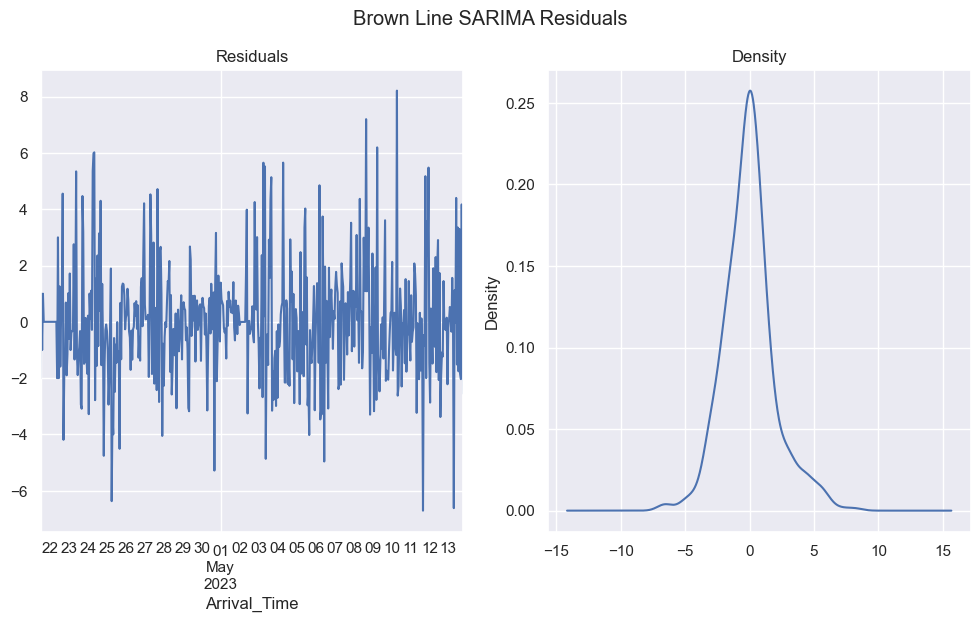

In [365]:
#check residuals
import matplotlib.pyplot as plt
residuals = result.resid[1:]
fig, ax = plt.subplots(1,2)
residuals.plot(title='Residuals', ax=ax[0])
residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.suptitle("Brown Line SARIMA Residuals")
plt.show()
#residuals looks good
#random noise on the left
#normally distributed about the mean on the right

### Predict

In [318]:
#use sarima model to predict on test data set
start = len(df_train)
end = len(df_train) + len(df_test) - 1

predictions = result.predict(start, end,
                             typ = 'levels').rename("Predictions")+df_brn['Frq'] #undifference

<Axes: title={'center': 'Brown Line Predictions'}, xlabel='Arrival_Time'>

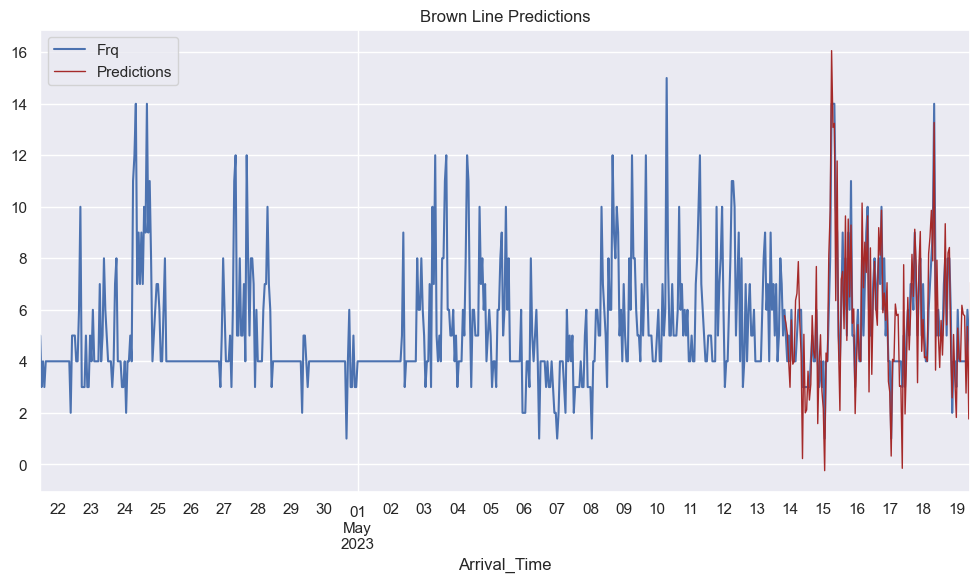

In [319]:
# plot predictions and actual values, showing whole dataset
df_brn['Frq'].plot(legend = True)
predictions.plot(legend = True, title="Brown Line Predictions", label='Predictions', lw=1, color="brown")

<Axes: title={'center': 'Brown Line Predictions'}, xlabel='Arrival_Time'>

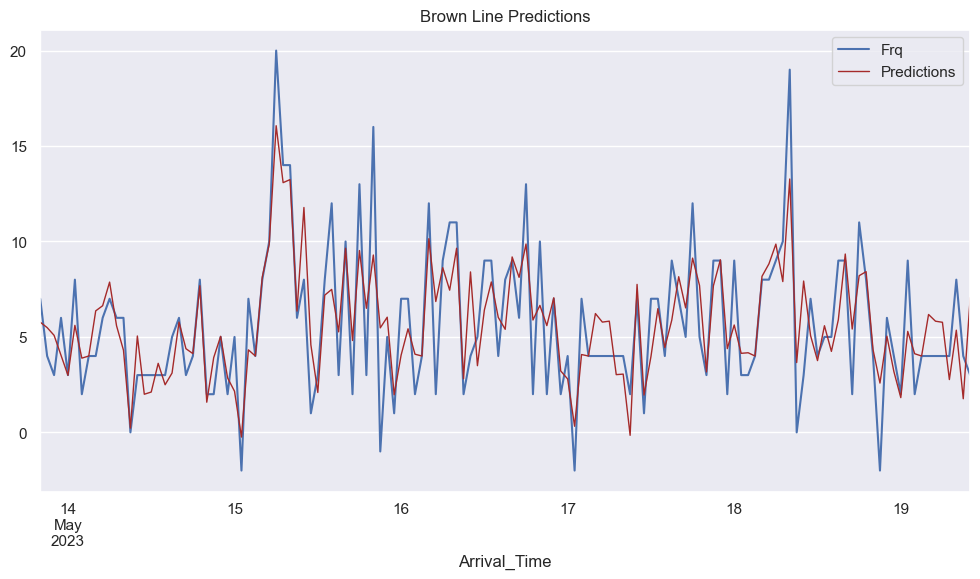

In [320]:
# plot predictions and actual values, zoom on testing dataset
df_test_undiff = df_test+df_brn['Frq'] #undiff
df_test_undiff.dropna(inplace=True)
predictions.dropna(inplace=True)
df_test_undiff.plot(legend = True, label="Frq")
predictions.plot(legend = True, title="Brown Line Predictions", label="Predictions", lw=1, color="brown")

### Evaluate

In [321]:
# Load specific evaluation tools
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
  
# Calculate root mean squared error
rmse(df_test_undiff, predictions)

#example interpretation: The weighted average error between the predictions and actuals in this dataset is 9.55, which is likely a good value given that the average actual height in the dataset is 170.

2.2765875665441313

In [377]:
df_brn['Frq'].describe()

count    672.00000
mean       5.25000
std        2.22839
min        1.00000
25%        4.00000
50%        4.00000
75%        6.00000
max       15.00000
Name: Frq, dtype: float64

### Forecast

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.07398D+00    |proj g|=  1.29095D-01


 This problem is unconstrained.



At iterate    5    f=  2.03871D+00    |proj g|=  3.49409D-03

At iterate   10    f=  2.03845D+00    |proj g|=  1.37603D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     12     15      1     0     0   2.422D-06   2.038D+00
  F =   2.0384504766355795     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<Axes: xlabel='Arrival_Time'>

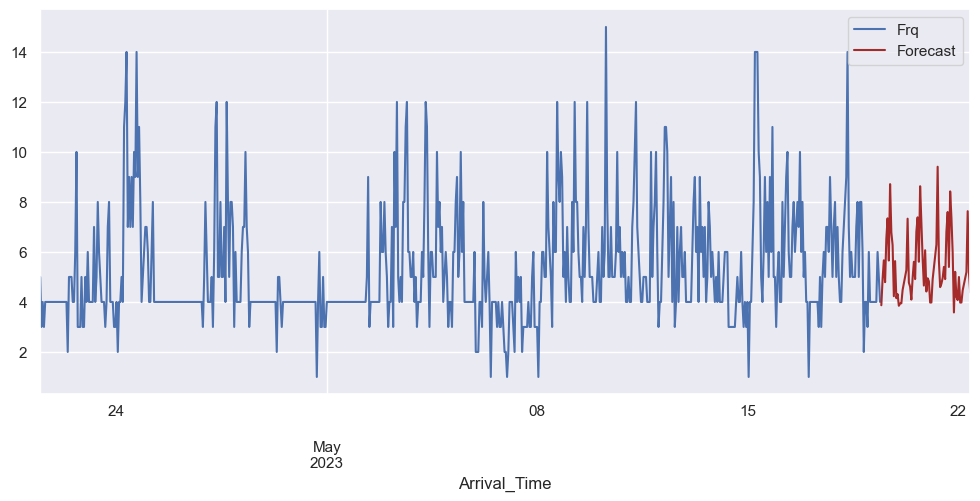

In [323]:
# Train the model on the full dataset
model = SARIMAX(df_brn['Frq'], 
                        order = (1, 0, 1), 
                        seasonal_order =(2, 1, 0, 24))
result = model.fit()
  
# Forecast for the next 3 years
forecast = result.predict(start = len(df_brn), 
                          end = (len(df_brn)-1) + 3 * 24, 
                          typ = 'levels').rename('Forecast')
  
# Plot the forecast values
df_brn['Frq'].plot(figsize = (12, 5), legend = True)
forecast.plot(legend = True, color="brown")

In [324]:
#final model summary
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                 Frq   No. Observations:                  672
Model:             SARIMAX(1, 0, 1)x(2, 1, [], 24)   Log Likelihood               -1369.839
Date:                             Sat, 27 May 2023   AIC                           2749.677
Time:                                     13:55:27   BIC                           2772.047
Sample:                                 04-21-2023   HQIC                          2758.355
                                      - 05-19-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8326      0.038     21.784      0.000       0.758       0.908
ma.L1         -0.4752      0.058     -8.233      0.000      -0.588      -0.362
ar.S.L24      -0.6232      0.034    -18.352      0.000      -0.690      -0.557
ar.S.L48      -0.3634      0.030    -11.917      0.000      -0.423      -0.304
sigma2         3.9362      0.169     23.264      0.000       3.605       4.268
===================================================================================
Ljung-Box (L1) (Q):                   0.59   Jarque-Bera (JB):                86.62
Prob(Q):                              0.44   Prob(JB):                         0.00
Heteroskedasticity (H):               1.15   Skew:                             0.50
Prob(H) (two-sided):                  0.31   Kurtosis:                         4.49
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Purple - Complete

### Check Stationarity

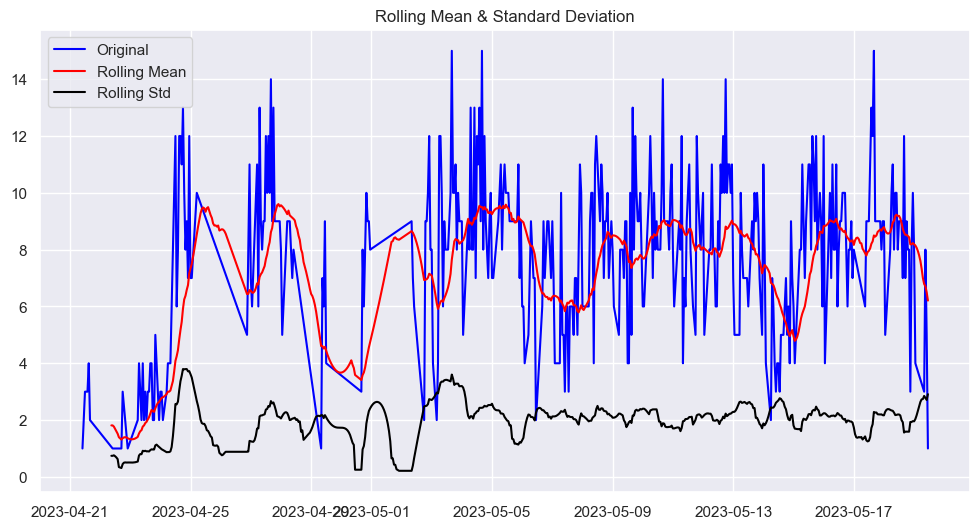

Results of Dickey-Fuller Test:
Test Statistic                  -3.866441
p-value                          0.002296
#Lags Used                       7.000000
Number of Observations Used    666.000000
Critical Value (1%)             -3.440207
Critical Value (5%)             -2.865889
Critical Value (10%)            -2.569086
dtype: float64


In [325]:
#We're looking for constant mean, no visible patterns/trends, 
#and a test statistic < critical value

test_stationarity(df_purp)

#test statistic is less than 1% critical value, good
#mean and std aren't so constant, could be better
#not super visible pattern, okay

In [326]:
#remove trend and seasonality via differencing
df_purp['Diff'] = df_purp['Frq'] - df_purp['Frq'].shift(1)
df_purp.head()

,Frq,Diff
Arrival_Time,,
2023-04-21 10:00:00,1.0,NaN
2023-04-21 11:00:00,2.0,1.0
2023-04-21 12:00:00,3.0,1.0
2023-04-21 13:00:00,3.0,0.0
2023-04-21 14:00:00,3.0,0.0


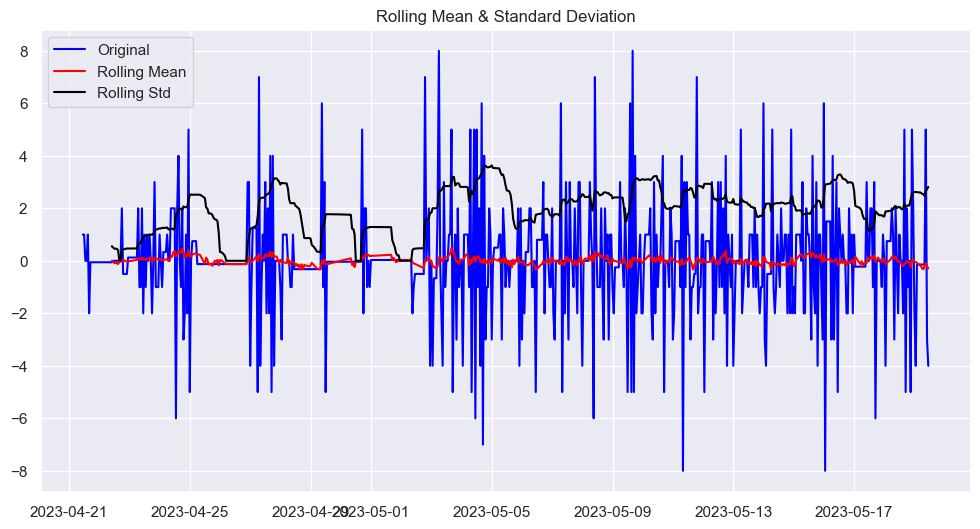

Results of Dickey-Fuller Test:
Test Statistic                -1.453932e+01
p-value                        5.176816e-27
#Lags Used                     6.000000e+00
Number of Observations Used    6.660000e+02
Critical Value (1%)           -3.440207e+00
Critical Value (5%)           -2.865889e+00
Critical Value (10%)          -2.569086e+00
dtype: float64


In [327]:
#test for stationarity again

#first remove the na's created by the shifting
df_purp.dropna(inplace=True)
df_purp.sort_index(inplace=True)
test_stationarity(df_purp['Diff'])
#looking much better
#mean is constant
#no visibile pattern
#test statistic is less than 1% confidence level
#we will want to make sure to use differencing in our model

### Build Model

Now that we've taken care of stationarity, let's assess how to build an ARIMA prediction model
- Good for short-term forecasting
- Only needs historical data

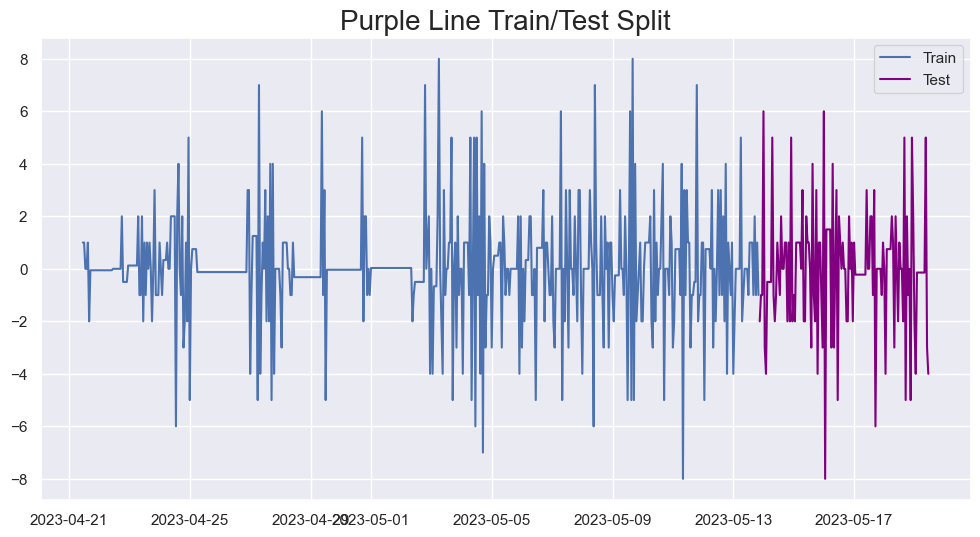

In [328]:
# split into train and test sets
X = df_purp['Diff']
size = int(len(X) * 0.8)
df_train, df_test = X[0:size], X[size:len(X)]

#visualize train test split
plt.title('Purple Line Train/Test Split', size=20)
plt.plot(df_train, label='Train')
plt.plot(df_test, label='Test', color='purple')
plt.legend();

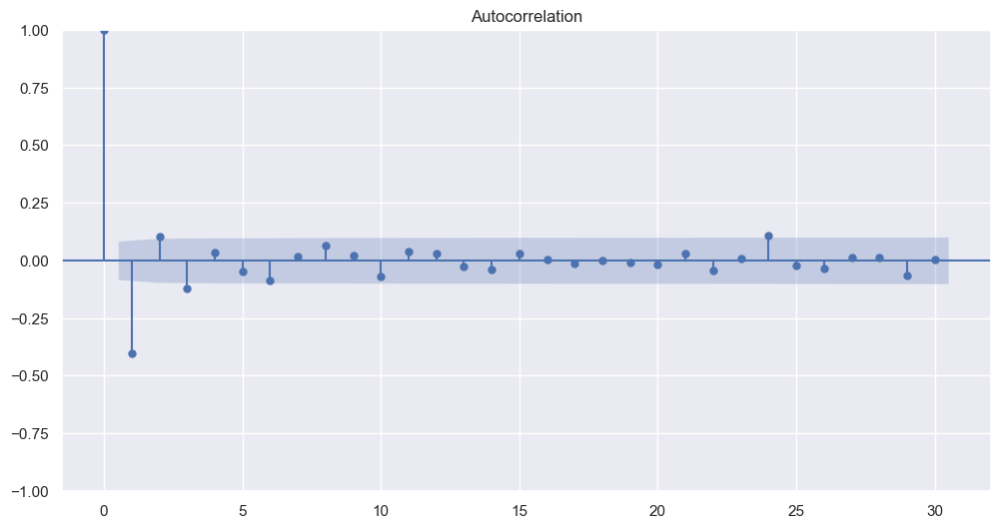

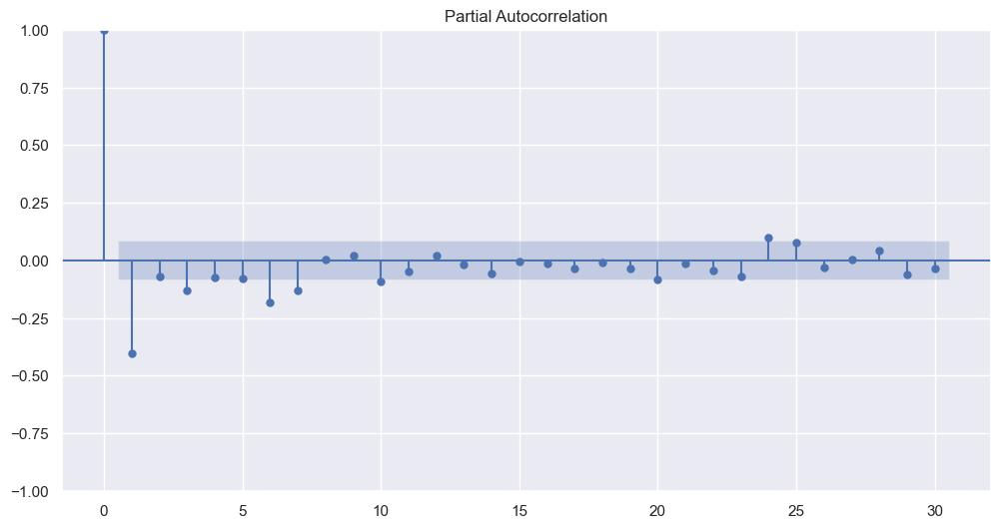

In [329]:
#Need to figure out p and q values
#Plot ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#from statsmodels.tsa.stattools import acf, pacf

acf_original = plot_acf(df_train, lags=30)
pacf_original = plot_pacf(df_train, lags=30)

#because we see ACF and PACF following similar behavior of a big drop
#at the beginning and then a gradual decline, we will combine the
# Auto Regressive (AR), Moving Average (MA), and Integrated (differencing)
#model -- ARIMA

#based on where the residuals cross the confidence interval in PACF, let's
#try p = 3
#based on where the residuals cross the confidence interval in ACF, let's
#try q = 3
#try d = 0 because we already adjusted with differencing

In [330]:
#build a first model
from statsmodels.tsa.arima.model import ARIMA
model=ARIMA(df_train,order=(3,0,3)) #p,d,q
model_fit=model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   Diff   No. Observations:                  538
Model:                 ARIMA(3, 0, 3)   Log Likelihood               -1073.237
Date:                Sat, 27 May 2023   AIC                           2162.473
Time:                        13:55:54   BIC                           2196.776
Sample:                    04-21-2023   HQIC                          2175.891
                         - 05-13-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0125      0.022      0.571      0.568      -0.030       0.056
ar.L1          0.7056      1.205      0.586      0.558      -1.656       3.067
ar.L2          0.1868      0.241      0.774      0.439      -0.286       0.660
ar.L3         -0.1799      0.454     -0.396      0.692      -1.069       0.710
ma.L1         -1.2025      1.206     -0.997      0.319      -3.567       1.162
ma.L2          0.2043      0.714      0.286      0.775      -1.195       1.603
ma.L3          0.0729      0.408      0.179      0.858      -0.727       0.872
sigma2         3.1605      0.153     20.651      0.000       2.861       3.461
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               149.44
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               2.08   Skew:                             0.67
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.21
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [331]:
# Import the library
from pmdarima import auto_arima
  
# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

#use stepwise autoarima to find best fit including seasonal order
stepwise_fit = auto_arima(df_train, start_p = 1, start_q = 1,
                          max_p = 3, max_q = 3, m = 24,
                          start_P = 0, seasonal = True, 
                          d = None, D = 1,
                          trace = True,
                          error_action ='ignore',   # we don't want to know if an order does not work
                          suppress_warnings = True,  # we don't want convergence warnings
                          stepwise = True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=6.70 sec
 ARIMA(0,0,0)(0,1,0)[24] intercept   : AIC=2493.146, Time=0.09 sec
 ARIMA(1,0,0)(1,1,0)[24] intercept   : AIC=2271.540, Time=1.32 sec
 ARIMA(0,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=2.48 sec
 ARIMA(0,0,0)(0,1,0)[24]             : AIC=2491.147, Time=0.10 sec
 ARIMA(1,0,0)(0,1,0)[24] intercept   : AIC=2377.952, Time=0.46 sec
 ARIMA(1,0,0)(2,1,0)[24] intercept   : AIC=2204.171, Time=3.59 sec
 ARIMA(1,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=8.54 sec
 ARIMA(1,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=3.18 sec
 ARIMA(0,0,0)(2,1,0)[24] intercept   : AIC=2327.502, Time=3.28 sec
 ARIMA(2,0,0)(2,1,0)[24] intercept   : AIC=2201.599, Time=4.75 sec
 ARIMA(2,0,0)(1,1,0)[24] intercept   : AIC=2271.992, Time=2.12 sec
 ARIMA(2,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=7.72 sec
 ARIMA(2,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=2.95 sec
 ARIMA(3,0,0)(2,1,0)[24] intercept   : AIC=2195.2

In [332]:
#use results from stepwise to train model on training set
#SARIMA:Seasonal ARIMA

from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(df_train, 
                order = (2, 0, 1), 
                seasonal_order =(2, 1, 0, 24))
  
result = model.fit()
result.summary()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.15885D+00    |proj g|=  3.98745D-01


 This problem is unconstrained.



At iterate    5    f=  2.03393D+00    |proj g|=  7.57142D-02

At iterate   10    f=  2.02179D+00    |proj g|=  4.79395D-02

At iterate   15    f=  2.01282D+00    |proj g|=  1.01004D-02

At iterate   20    f=  2.01241D+00    |proj g|=  3.98775D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6     22     24      1     0     0   1.275D-06   2.012D+00
  F =   2.0124143894727808     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                Diff   No. Observations:                  538
Model:             SARIMAX(2, 0, 1)x(2, 1, [], 24)   Log Likelihood               -1082.679
Date:                             Sat, 27 May 2023   AIC                           2177.358
Time:                                     14:01:20   BIC                           2202.811
Sample:                                 04-21-2023   HQIC                          2187.334
                                      - 05-13-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3394      0.056      6.104      0.000       0.230       0.448
ar.L2          0.2909      0.049      5.923      0.000       0.195       0.387
ma.L1         -0.9081      0.039    -23.084      0.000      -0.985      -0.831
ar.S.L24      -0.5996      0.039    -15.363      0.000      -0.676      -0.523
ar.S.L48      -0.3732      0.040     -9.402      0.000      -0.451      -0.295
sigma2         3.8559      0.209     18.455      0.000       3.446       4.265
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                41.12
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               1.63   Skew:                             0.46
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.04
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

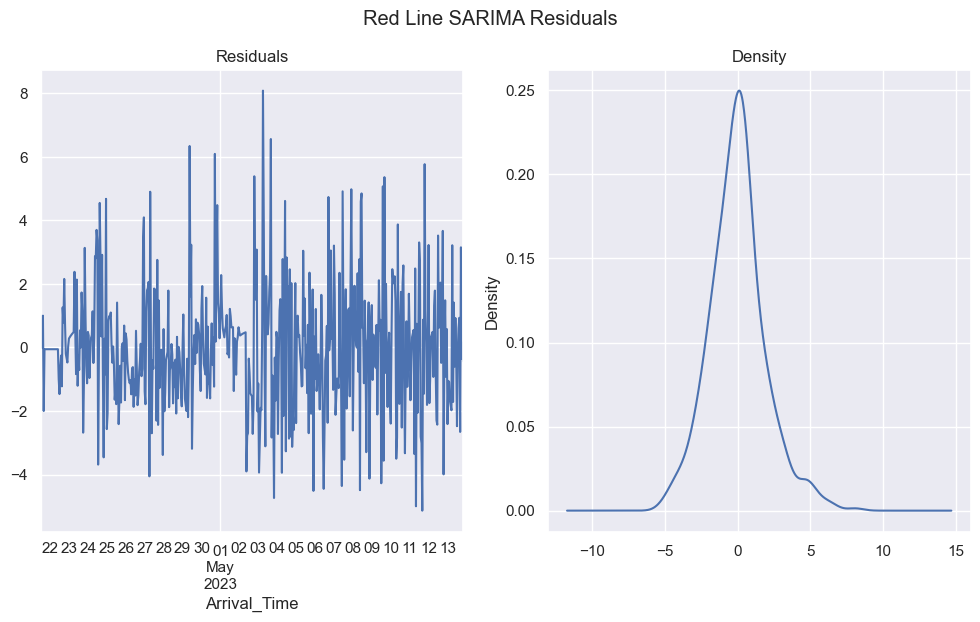

In [333]:
#check residuals
import matplotlib.pyplot as plt
residuals = result.resid[1:]
fig, ax = plt.subplots(1,2)
residuals.plot(title='Residuals', ax=ax[0])
residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.suptitle("Red Line SARIMA Residuals")
plt.show()
#residuals looks good
#random noise on the left
#normally distributed about the mean on the right

### Predict

In [334]:
#use sarima model to predict on test data set
start = len(df_train)
end = len(df_train) + len(df_test) - 1

predictions = result.predict(start, end,
                             typ = 'levels').rename("Predictions")+df_purp['Frq'] #undifference

<Axes: title={'center': 'Purple Line Predictions'}, xlabel='Arrival_Time'>

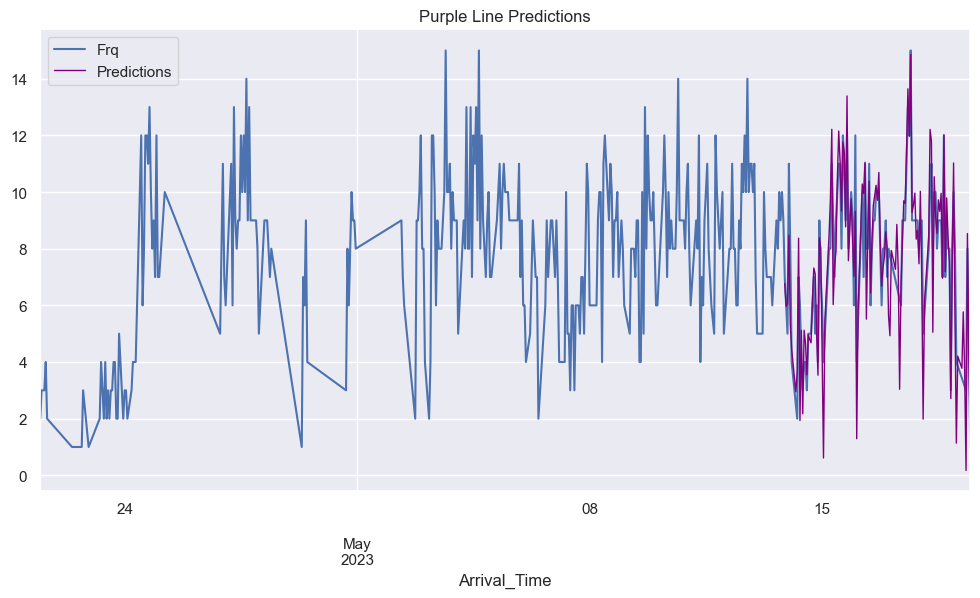

In [335]:
# plot predictions and actual values, showing whole dataset
df_purp['Frq'].plot(legend = True)
predictions.plot(legend = True, title="Purple Line Predictions", label='Predictions', lw=1, color="purple")

<Axes: title={'center': 'Purple Line Predictions'}, xlabel='Arrival_Time'>

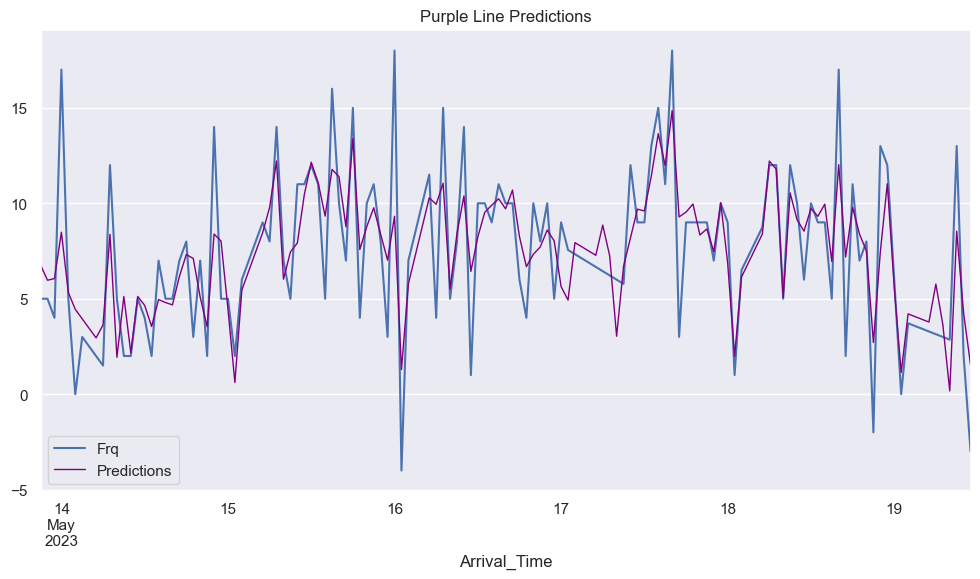

In [336]:
# plot predictions and actual values, zoom on testing dataset
df_test_undiff = df_test+df_purp['Frq'] #undiff
df_test_undiff.dropna(inplace=True)
predictions.dropna(inplace=True)
df_test_undiff.plot(legend = True, label="Frq")
predictions.plot(legend = True, title="Purple Line Predictions", label="Predictions", lw=1, color="purple")

### Evaluate

In [337]:
# Load specific evaluation tools
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
  
# Calculate root mean squared error
rmse(df_test_undiff, predictions)

#example interpretation: The weighted average error between the predictions and actuals in this dataset is 9.55, which is likely a good value given that the average actual height in the dataset is 170.

2.515579619938541

### Forecast

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.09106D+00    |proj g|=  1.51970D-01


 This problem is unconstrained.



At iterate    5    f=  2.05406D+00    |proj g|=  7.89100D-03

At iterate   10    f=  2.04969D+00    |proj g|=  8.34486D-03

At iterate   15    f=  2.04956D+00    |proj g|=  1.02144D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6     17     22      1     0     0   2.825D-06   2.050D+00
  F =   2.0495638339187439     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<Axes: xlabel='Arrival_Time'>

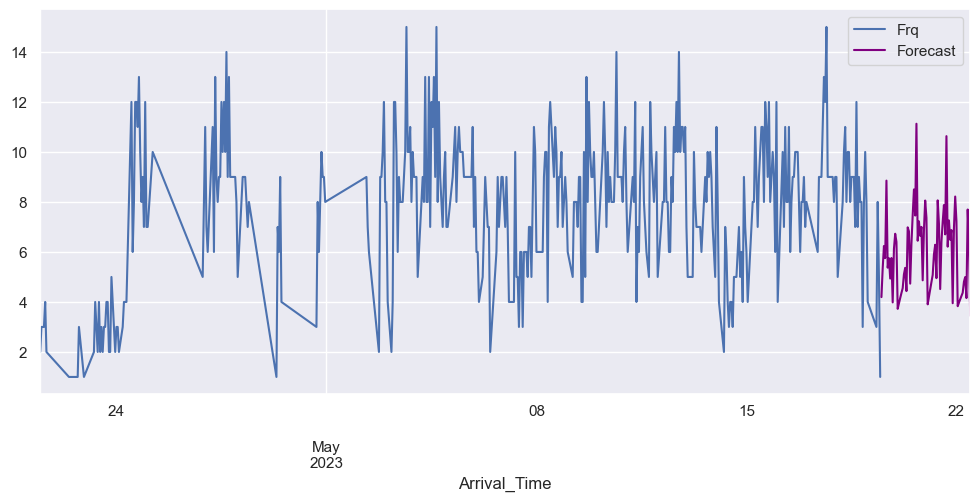

In [339]:
# Train the model on the full dataset
model = SARIMAX(df_purp['Frq'], 
                        order = (2, 0, 1), 
                        seasonal_order =(2, 1, 0, 24))
result = model.fit()
  
# Forecast for the next 3 years
forecast = result.predict(start = len(df_purp), 
                          end = (len(df_purp)-1) + 3 * 24, 
                          typ = 'levels').rename('Forecast')
  
# Plot the forecast values
df_purp['Frq'].plot(figsize = (12, 5), legend = True)
forecast.plot(legend = True, color="purple")

In [340]:
#final model summary
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                 Frq   No. Observations:                  673
Model:             SARIMAX(2, 0, 1)x(2, 1, [], 24)   Log Likelihood               -1379.356
Date:                             Sat, 27 May 2023   AIC                           2770.713
Time:                                     14:02:30   BIC                           2797.566
Sample:                                 04-21-2023   HQIC                          2781.129
                                      - 05-19-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8886      0.083     10.671      0.000       0.725       1.052
ar.L2          0.0378      0.069      0.548      0.584      -0.097       0.173
ma.L1         -0.4661      0.079     -5.932      0.000      -0.620      -0.312
ar.S.L24      -0.6088      0.037    -16.249      0.000      -0.682      -0.535
ar.S.L48      -0.3144      0.036     -8.749      0.000      -0.385      -0.244
sigma2         4.0345      0.197     20.475      0.000       3.648       4.421
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                28.42
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               1.65   Skew:                             0.37
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.71
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Yellow - Complete

### Check Stationarity

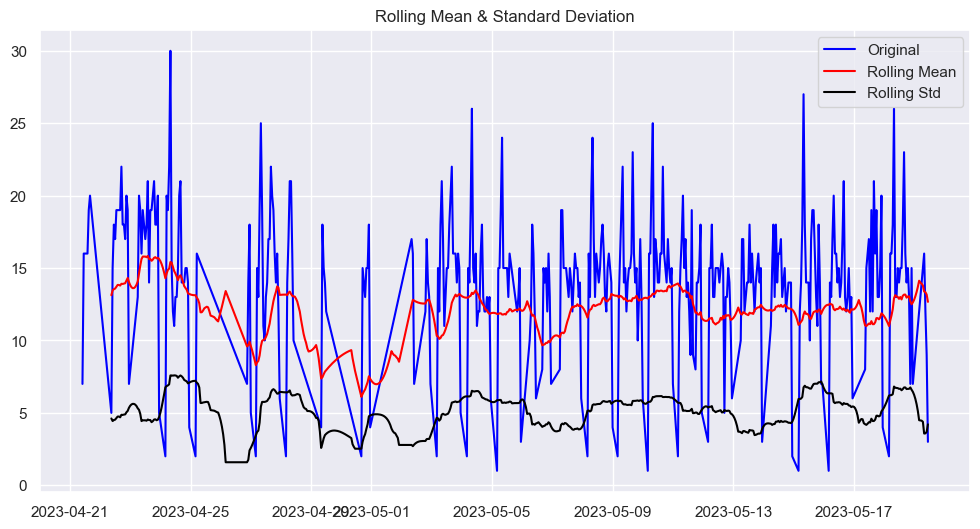

Results of Dickey-Fuller Test:
Test Statistic                  -4.272640
p-value                          0.000495
#Lags Used                      20.000000
Number of Observations Used    653.000000
Critical Value (1%)             -3.440404
Critical Value (5%)             -2.865976
Critical Value (10%)            -2.569132
dtype: float64


In [341]:
#We're looking for constant mean, no visible patterns/trends, 
#and a test statistic < critical value

test_stationarity(df_yell)

#test statistic is less than 1% critical value, good
#mean and std aren't so constant, could be better
#not super visible pattern, okay

In [342]:
#remove trend and seasonality via differencing
df_yell['Diff'] = df_yell['Frq'] - df_yell['Frq'].shift(1)
df_yell.head()

,Frq,Diff
Arrival_Time,,
2023-04-21 10:00:00,7.0,NaN
2023-04-21 11:00:00,16.0,9.0
2023-04-21 12:00:00,16.0,0.0
2023-04-21 13:00:00,16.0,0.0
2023-04-21 14:00:00,16.0,0.0


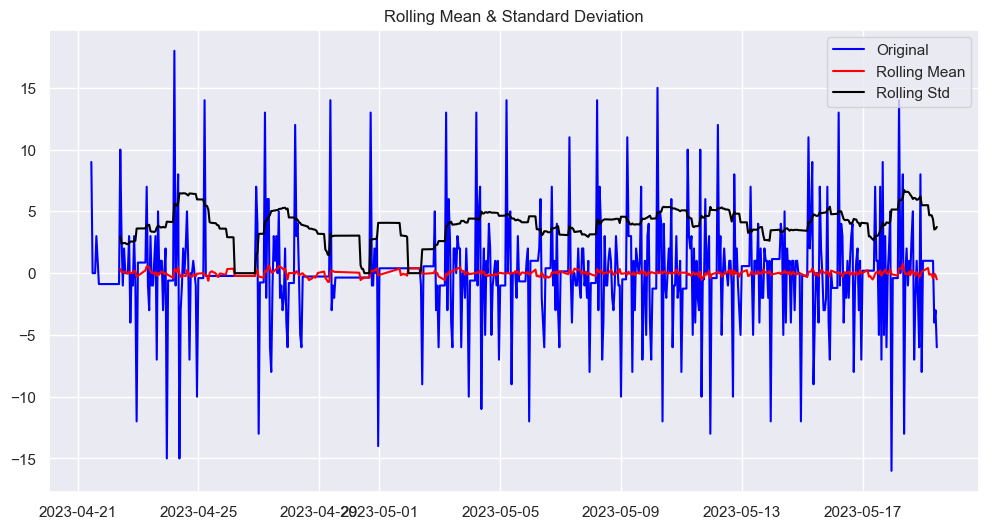

Results of Dickey-Fuller Test:
Test Statistic                -1.446431e+01
p-value                        6.766441e-27
#Lags Used                     2.000000e+01
Number of Observations Used    6.520000e+02
Critical Value (1%)           -3.440419e+00
Critical Value (5%)           -2.865983e+00
Critical Value (10%)          -2.569136e+00
dtype: float64


In [343]:
#test for stationarity again

#first remove the na's created by the shifting
df_yell.dropna(inplace=True)
df_yell.sort_index(inplace=True)
test_stationarity(df_yell['Diff'])
#looking much better
#mean is constant
#no visibile pattern
#test statistic is less than 1% confidence level
#we will want to make sure to use differencing in our model

### Build Model

Now that we've taken care of stationarity, let's assess how to build an ARIMA prediction model
- Good for short-term forecasting
- Only needs historical data

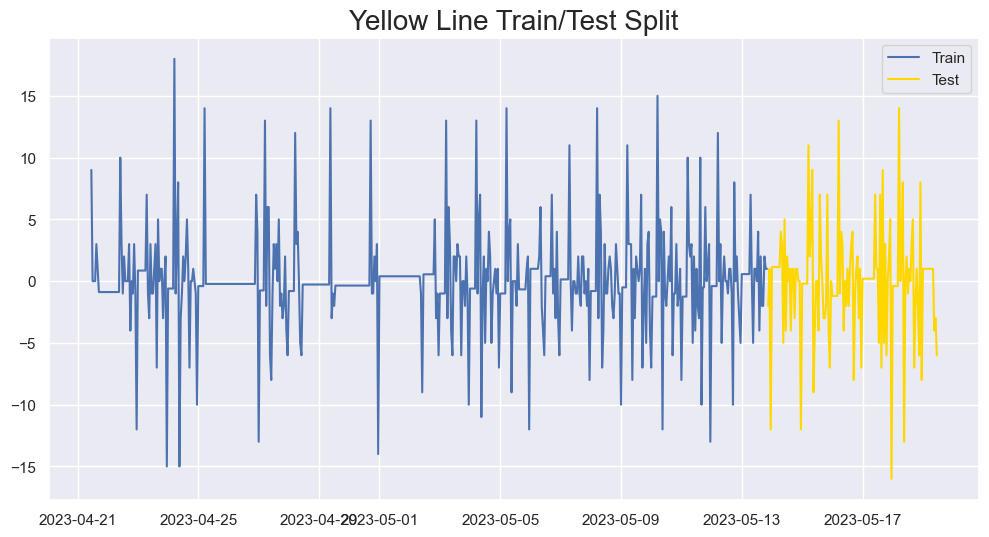

In [345]:
# split into train and test sets
X = df_yell['Diff']
size = int(len(X) * 0.8)
df_train, df_test = X[0:size], X[size:len(X)]

#visualize train test split
plt.title('Yellow Line Train/Test Split', size=20)
plt.plot(df_train, label='Train')
plt.plot(df_test, label='Test', color='gold')
plt.legend();

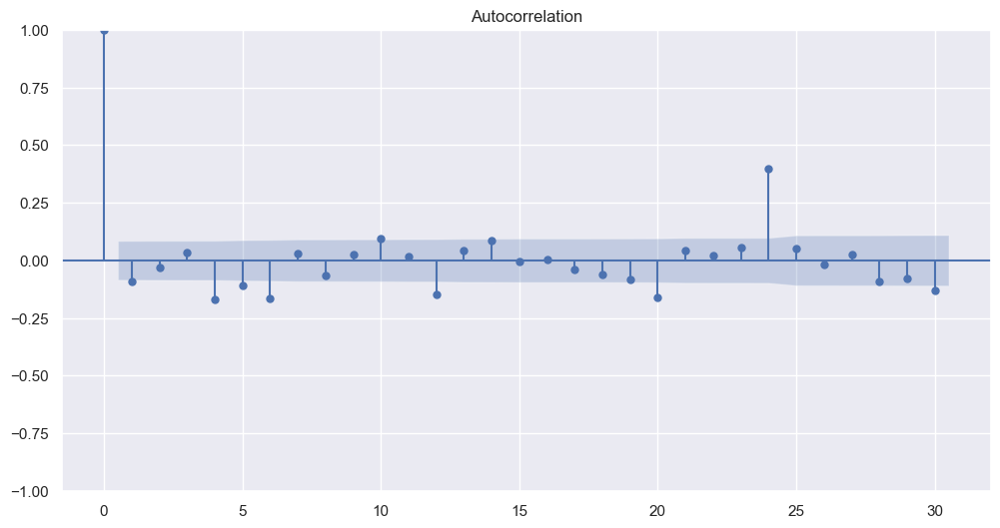

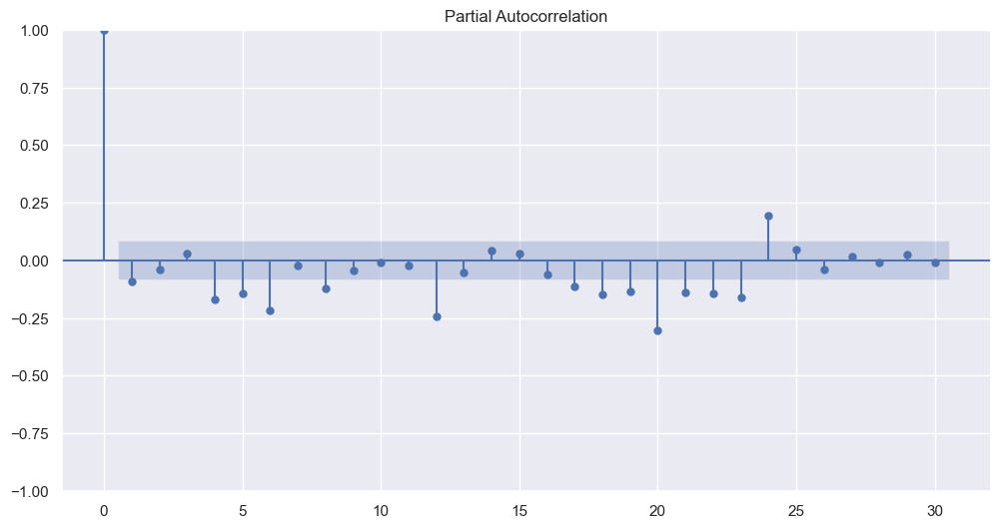

In [346]:
#Need to figure out p and q values
#Plot ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#from statsmodels.tsa.stattools import acf, pacf

acf_original = plot_acf(df_train, lags=30)
pacf_original = plot_pacf(df_train, lags=30)

#because we see ACF and PACF following similar behavior of a big drop
#at the beginning and then a gradual decline, we will combine the
# Auto Regressive (AR), Moving Average (MA), and Integrated (differencing)
#model -- ARIMA

#based on where the residuals cross the confidence interval in PACF, let's
#try p = 1
#based on where the residuals cross the confidence interval in ACF, let's
#try q = 1
#try d = 0 because we already adjusted with differencing

In [347]:
#build a first model
from statsmodels.tsa.arima.model import ARIMA
model=ARIMA(df_train,order=(1,0,1)) #p,d,q
model_fit=model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   Diff   No. Observations:                  538
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -1454.756
Date:                Sat, 27 May 2023   AIC                           2917.511
Time:                        14:03:16   BIC                           2934.663
Sample:                    04-21-2023   HQIC                          2924.220
                         - 05-13-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0002      0.004     -0.053      0.958      -0.008       0.008
ar.L1          0.7365      0.029     25.473      0.000       0.680       0.793
ma.L1         -0.9999      0.660     -1.516      0.130      -2.293       0.293
sigma2        12.9611      8.598      1.507      0.132      -3.890      29.812
===================================================================================
Ljung-Box (L1) (Q):                   0.64   Jarque-Bera (JB):               181.54
Prob(Q):                              0.42   Prob(JB):                         0.00
Heteroskedasticity (H):               1.06   Skew:                             0.41
Prob(H) (two-sided):                  0.71   Kurtosis:                         5.72
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [348]:
# Import the library
from pmdarima import auto_arima
  
# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

#use stepwise autoarima to find best fit including seasonal order
stepwise_fit = auto_arima(df_train, start_p = 1, start_q = 1,
                          max_p = 3, max_q = 3, m = 24,
                          start_P = 0, seasonal = True, 
                          d = None, D = 1,
                          trace = True,
                          error_action ='ignore',   # we don't want to know if an order does not work
                          suppress_warnings = True,  # we don't want convergence warnings
                          stepwise = True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=4.87 sec
 ARIMA(0,0,0)(0,1,0)[24] intercept   : AIC=2952.623, Time=0.12 sec
 ARIMA(1,0,0)(1,1,0)[24] intercept   : AIC=2854.892, Time=1.61 sec
 ARIMA(0,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=3.00 sec
 ARIMA(0,0,0)(0,1,0)[24]             : AIC=2950.629, Time=0.16 sec
 ARIMA(1,0,0)(0,1,0)[24] intercept   : AIC=2924.926, Time=0.36 sec
 ARIMA(1,0,0)(2,1,0)[24] intercept   : AIC=2796.084, Time=3.93 sec
 ARIMA(1,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=14.30 sec
 ARIMA(1,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=5.46 sec
 ARIMA(0,0,0)(2,1,0)[24] intercept   : AIC=2818.435, Time=4.23 sec
 ARIMA(2,0,0)(2,1,0)[24] intercept   : AIC=2792.815, Time=5.86 sec
 ARIMA(2,0,0)(1,1,0)[24] intercept   : AIC=2849.127, Time=2.85 sec
 ARIMA(2,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=15.99 sec
 ARIMA(2,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=5.67 sec
 ARIMA(3,0,0)(2,1,0)[24] intercept   : AIC=2793

In [349]:
#use results from stepwise to train model on training set
#SARIMA:Seasonal ARIMA

from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(df_train, 
                order = (2, 0, 0), 
                seasonal_order =(2, 1, 0, 24))
  
result = model.fit()
result.summary()

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.60249D+00    |proj g|=  5.47894D-02

At iterate    5    f=  2.58442D+00    |proj g|=  2.04940D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      8     12      1     0     0   4.268D-06   2.584D+00
  F =   2.5844071246531444     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                               Diff   No. Observations:                  538
Model:             SARIMAX(2, 0, 0)x(2, 1, 0, 24)   Log Likelihood               -1390.411
Date:                            Sat, 27 May 2023   AIC                           2790.822
Time:                                    14:06:47   BIC                           2812.033
Sample:                                04-21-2023   HQIC                          2799.135
                                     - 05-13-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2402      0.041     -5.929      0.000      -0.320      -0.161
ar.L2         -0.1014      0.051     -1.996      0.046      -0.201      -0.002
ar.S.L24      -0.5099      0.036    -14.207      0.000      -0.580      -0.440
ar.S.L48      -0.3598      0.032    -11.296      0.000      -0.422      -0.297
sigma2        12.8343      0.533     24.098      0.000      11.790      13.878
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               255.70
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               0.79   Skew:                             0.20
Prob(H) (two-sided):                  0.13   Kurtosis:                         6.43
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

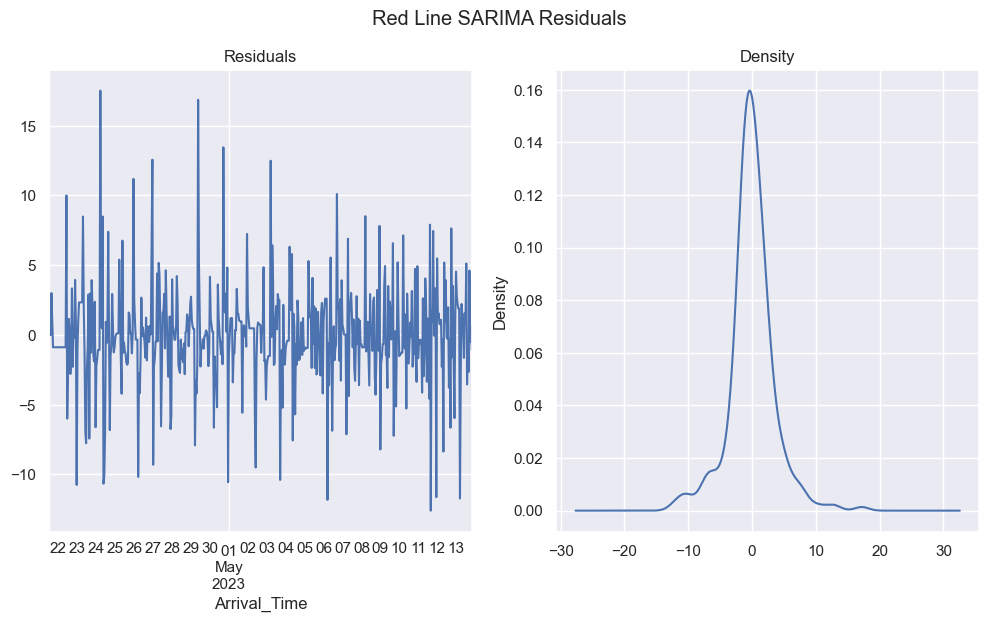

In [350]:
#check residuals
import matplotlib.pyplot as plt
residuals = result.resid[1:]
fig, ax = plt.subplots(1,2)
residuals.plot(title='Residuals', ax=ax[0])
residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.suptitle("Red Line SARIMA Residuals")
plt.show()
#residuals looks good
#random noise on the left
#normally distributed about the mean on the right

### Predict

In [351]:
#use sarima model to predict on test data set
start = len(df_train)
end = len(df_train) + len(df_test) - 1

predictions = result.predict(start, end,
                             typ = 'levels').rename("Predictions")+df_yell['Frq'] #undifference

<Axes: title={'center': 'Yellow Line Predictions'}, xlabel='Arrival_Time'>

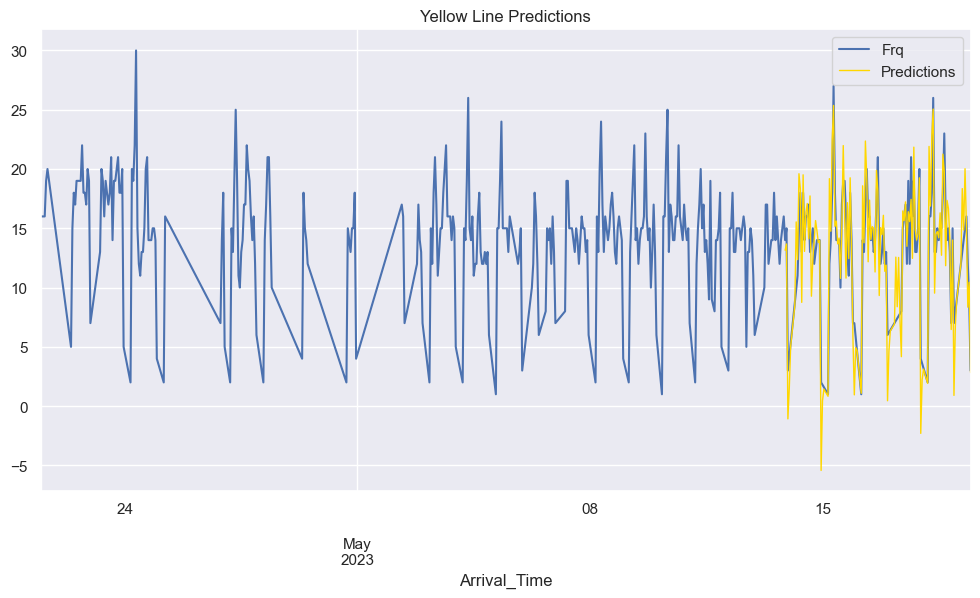

In [352]:
# plot predictions and actual values, showing whole dataset
df_yell['Frq'].plot(legend = True)
predictions.plot(legend = True, title="Yellow Line Predictions", label='Predictions', color="gold", lw=1)

<Axes: title={'center': 'Yellow Line Predictions'}, xlabel='Arrival_Time'>

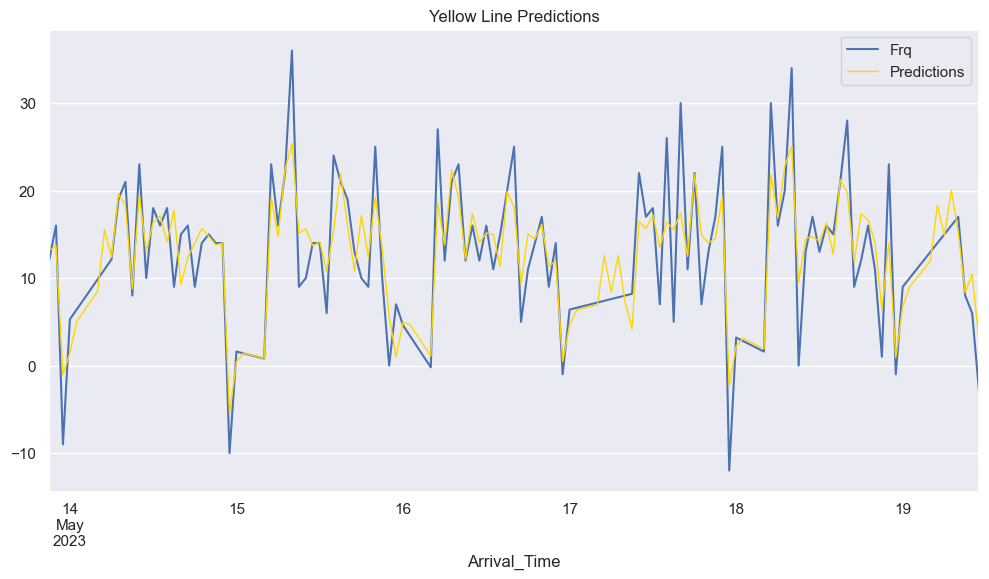

In [353]:
# plot predictions and actual values, zoom on testing dataset
df_test_undiff = df_test+df_yell['Frq'] #undiff
df_test_undiff.dropna(inplace=True)
predictions.dropna(inplace=True)
df_test_undiff.plot(legend = True, label="Frq")
predictions.plot(legend = True, title="Yellow Line Predictions", label="Predictions", lw=1, color="gold")

### Evaluate

In [354]:
# Load specific evaluation tools
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
  
# Calculate root mean squared error
rmse(df_test_undiff, predictions)

#example interpretation: The weighted average error between the predictions and actuals in this dataset is 9.55, which is likely a good value given that the average actual height in the dataset is 170.

4.169830707194822

### Forecast

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.57522D+00    |proj g|=  6.09520D-02


 This problem is unconstrained.



At iterate    5    f=  2.55169D+00    |proj g|=  4.13247D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      9     11      1     0     0   7.471D-06   2.552D+00
  F =   2.5516489414737649     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<Axes: xlabel='Arrival_Time'>

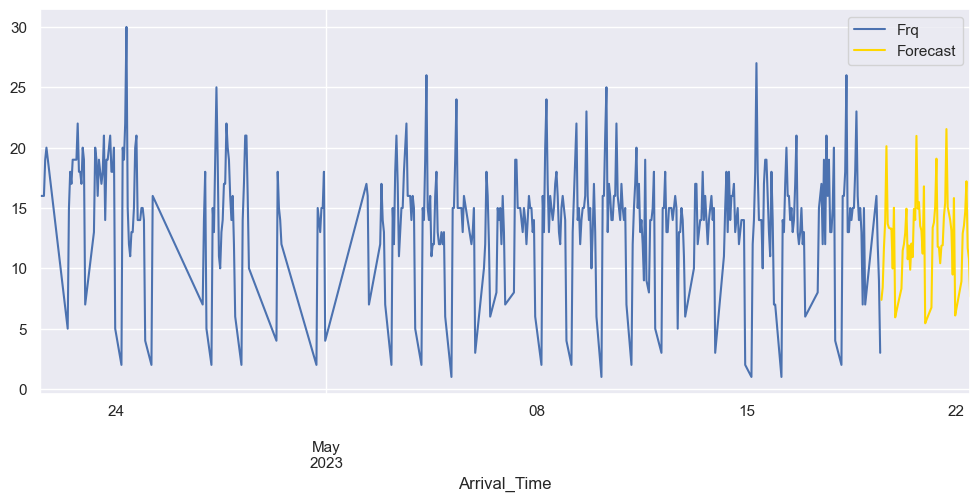

In [355]:
# Train the model on the full dataset
model = model = SARIMAX(df_yell['Frq'], 
                        order = (2, 0, 0), 
                        seasonal_order =(2, 1, 0, 24))
result = model.fit()
  
# Forecast for the next 3 years
forecast = result.predict(start = len(df_yell), 
                          end = (len(df_yell)-1) + 3 * 24, 
                          typ = 'levels').rename('Forecast')
  
# Plot the forecast values
df_yell['Frq'].plot(figsize = (12, 5), legend = True)
forecast.plot(legend = True, color="gold")

In [356]:
#final model summary
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                Frq   No. Observations:                  673
Model:             SARIMAX(2, 0, 0)x(2, 1, 0, 24)   Log Likelihood               -1717.260
Date:                            Sat, 27 May 2023   AIC                           3444.519
Time:                                    14:07:52   BIC                           3466.897
Sample:                                04-21-2023   HQIC                          3453.200
                                     - 05-19-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6083      0.037     16.640      0.000       0.537       0.680
ar.L2          0.0615      0.039      1.595      0.111      -0.014       0.137
ar.S.L24      -0.5440      0.033    -16.557      0.000      -0.608      -0.480
ar.S.L48      -0.3569      0.031    -11.517      0.000      -0.418      -0.296
sigma2        11.4355      0.540     21.162      0.000      10.376      12.495
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                58.51
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               0.96   Skew:                             0.13
Prob(H) (two-sided):                  0.76   Kurtosis:                         4.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Pink - Complete

### Check Stationarity

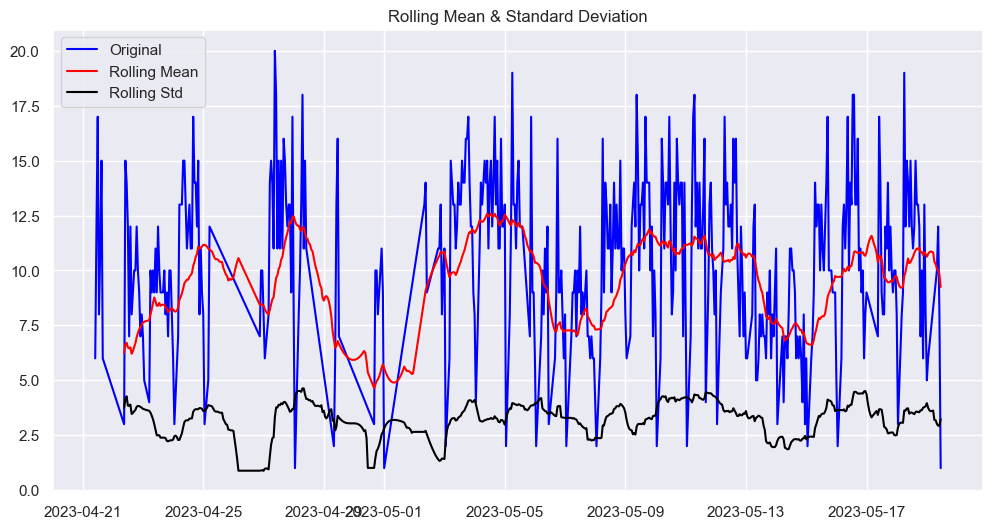

Results of Dickey-Fuller Test:
Test Statistic                  -3.356837
p-value                          0.012521
#Lags Used                      20.000000
Number of Observations Used    653.000000
Critical Value (1%)             -3.440404
Critical Value (5%)             -2.865976
Critical Value (10%)            -2.569132
dtype: float64


In [357]:
#We're looking for constant mean, no visible patterns/trends, 
#and a test statistic < critical value

test_stationarity(df_pink)

#test statistic is less than 5% critical value, good
#mean and std aren't so constant, could be better
#not super visible pattern, okay

In [358]:
#remove trend and seasonality via differencing
#df_red['First Difference'] = df_red['Frq'] - df_red['Frq'].shift(1)
df_pink['Diff'] = df_pink['Frq'] - df_pink['Frq'].shift(1)
df_pink.head()

,Frq,Diff
Arrival_Time,,
2023-04-21 10:00:00,6.0,NaN
2023-04-21 11:00:00,12.0,6.0
2023-04-21 12:00:00,17.0,5.0
2023-04-21 13:00:00,8.0,-9.0
2023-04-21 14:00:00,11.0,3.0


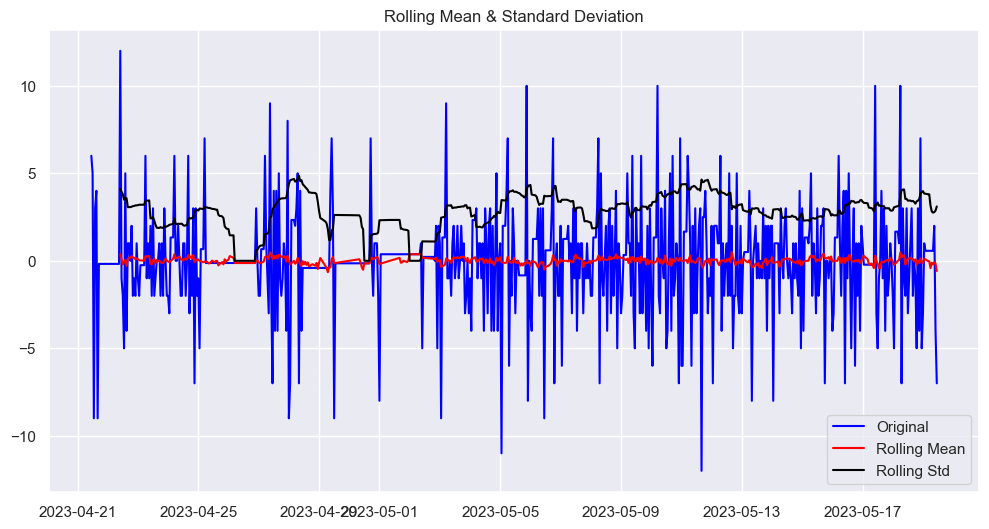

Results of Dickey-Fuller Test:
Test Statistic                -1.174162e+01
p-value                        1.269691e-21
#Lags Used                     2.000000e+01
Number of Observations Used    6.520000e+02
Critical Value (1%)           -3.440419e+00
Critical Value (5%)           -2.865983e+00
Critical Value (10%)          -2.569136e+00
dtype: float64


In [359]:
#test for stationarity again

#first remove the na's created by the shifting
df_pink.dropna(inplace=True)
df_pink.sort_index(inplace=True)
test_stationarity(df_pink['Diff'])
#looking much better
#mean is constant
#no visibile pattern
#test statistic is less than 1% confidence level
#we will want to make sure to use differencing in our model

### Build Model

Now that we've taken care of stationarity, let's assess how to build an ARIMA prediction model
- Good for short-term forecasting
- Only needs historical data

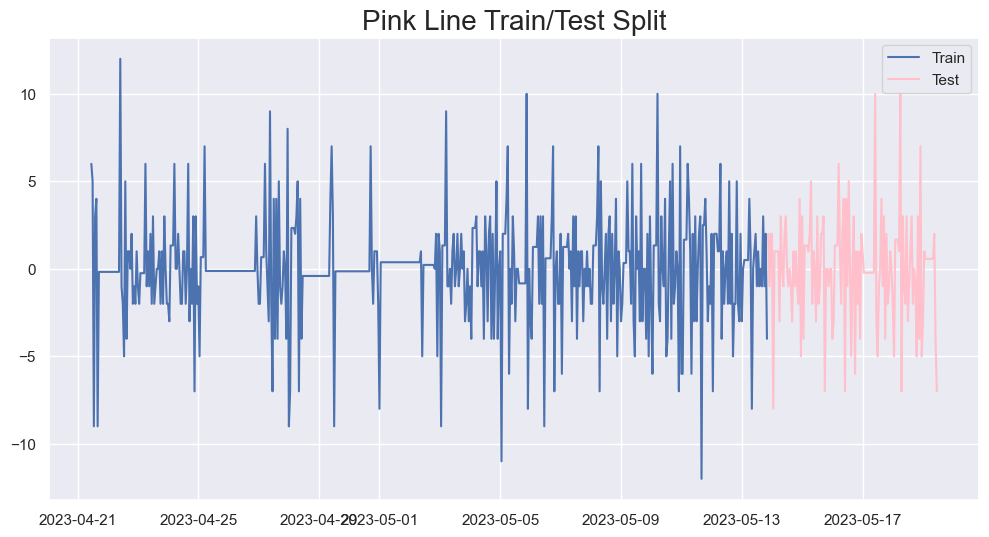

In [165]:
# split into train and test sets
X = df_pink['Diff']
size = int(len(X) * 0.8)
df_train, df_test = X[0:size], X[size:len(X)]

#visualize train test split
plt.title('Pink Line Train/Test Split', size=20)
plt.plot(df_train, label='Train')
plt.plot(df_test, label='Test', color='pink')
plt.legend();

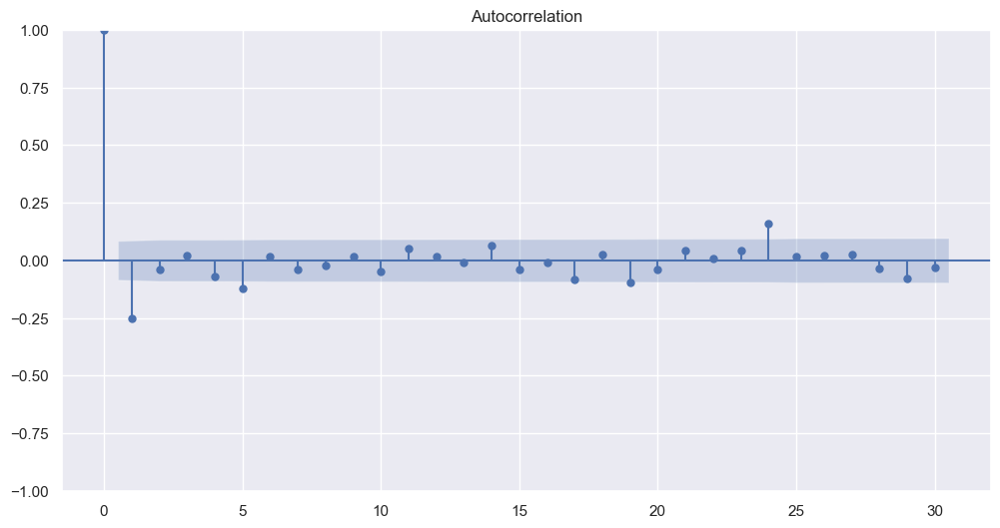

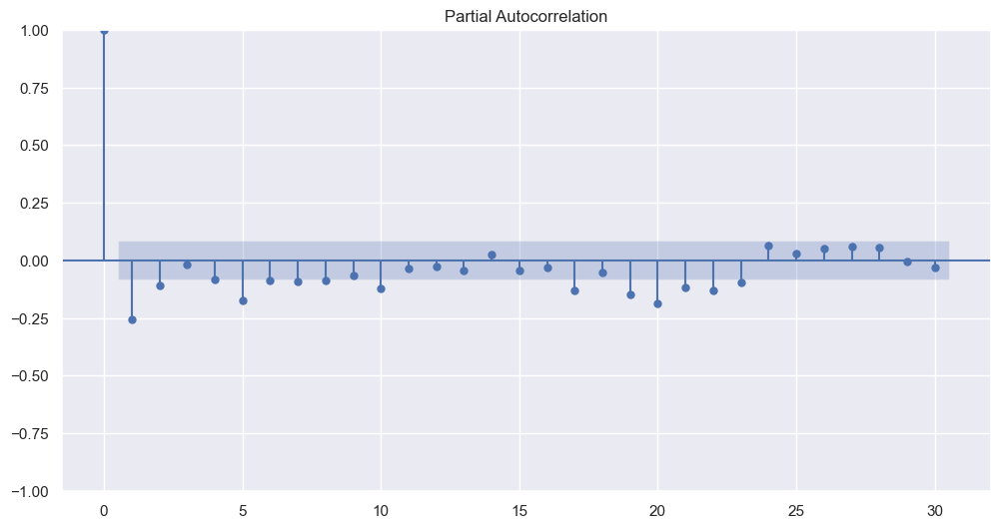

In [166]:
#Need to figure out p and q values
#Plot ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#from statsmodels.tsa.stattools import acf, pacf

acf_original = plot_acf(df_train, lags=30)
pacf_original = plot_pacf(df_train, lags=30)

#because we see ACF and PACF following similar behavior of a big drop
#at the beginning and then a gradual decline, we will combine the
# Auto Regressive (AR), Moving Average (MA), and Integrated (differencing)
#model -- ARIMA

#based on where the residuals cross the confidence interval in PACF, let's
#try p = 2
#based on where the residuals cross the confidence interval in ACF, let's
#try q = 1
#try d = 0 because we already adjusted with differencing

In [167]:
#build a first model
from statsmodels.tsa.arima.model import ARIMA
model=ARIMA(df_train,order=(2,0,1)) #p,d,q
model_fit=model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   Diff   No. Observations:                  538
Model:                 ARIMA(2, 0, 1)   Log Likelihood               -1298.729
Date:                Sat, 27 May 2023   AIC                           2607.459
Time:                        12:27:49   BIC                           2628.898
Sample:                    04-21-2023   HQIC                          2615.845
                         - 05-13-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0032      0.003      1.072      0.284      -0.003       0.009
ar.L1          0.6133      0.042     14.730      0.000       0.532       0.695
ar.L2          0.1259      0.039      3.260      0.001       0.050       0.202
ma.L1         -0.9999      0.837     -1.195      0.232      -2.641       0.641
sigma2         7.2578      6.046      1.200      0.230      -4.592      19.107
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               135.35
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.30   Skew:                             0.19
Prob(H) (two-sided):                  0.08   Kurtosis:                         5.43
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [168]:
# Import the library
from pmdarima import auto_arima
  
# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

#use stepwise autoarima to find best fit including seasonal order
stepwise_fit = auto_arima(df_train, start_p = 1, start_q = 1,
                          max_p = 3, max_q = 3, m = 24,
                          start_P = 0, seasonal = True, 
                          d = None, D = 1,
                          trace = True,
                          error_action ='ignore',   # we don't want to know if an order does not work
                          suppress_warnings = True,  # we don't want convergence warnings
                          stepwise = True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=4.29 sec
 ARIMA(0,0,0)(0,1,0)[24] intercept   : AIC=2827.363, Time=0.08 sec
 ARIMA(1,0,0)(1,1,0)[24] intercept   : AIC=2635.075, Time=1.19 sec
 ARIMA(0,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=1.77 sec
 ARIMA(0,0,0)(0,1,0)[24]             : AIC=2825.393, Time=0.10 sec
 ARIMA(1,0,0)(0,1,0)[24] intercept   : AIC=2767.380, Time=0.32 sec
 ARIMA(1,0,0)(2,1,0)[24] intercept   : AIC=2583.553, Time=3.63 sec
 ARIMA(1,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=13.55 sec
 ARIMA(1,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=4.79 sec
 ARIMA(0,0,0)(2,1,0)[24] intercept   : AIC=2646.449, Time=2.43 sec
 ARIMA(2,0,0)(2,1,0)[24] intercept   : AIC=2564.170, Time=4.34 sec
 ARIMA(2,0,0)(1,1,0)[24] intercept   : AIC=2619.989, Time=1.64 sec
 ARIMA(2,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=10.67 sec
 ARIMA(2,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=3.72 sec
 ARIMA(3,0,0)(2,1,0)[24] intercept   : AIC=2561

In [169]:
#use results from stepwise to train model on training set
#SARIMA:Seasonal ARIMA

from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(df_train, 
                order = (1, 0, 2), 
                seasonal_order =(2, 1, 0, 24))
  
result = model.fit()
result.summary()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.38019D+00    |proj g|=  8.84115D-02


 This problem is unconstrained.



At iterate    5    f=  2.34545D+00    |proj g|=  6.72105D-03

At iterate   10    f=  2.34134D+00    |proj g|=  5.27770D-03

At iterate   15    f=  2.34128D+00    |proj g|=  1.79577D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6     16     19      1     0     0   9.582D-06   2.341D+00
  F =   2.3412844988069730     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                Diff   No. Observations:                  538
Model:             SARIMAX(1, 0, 2)x(2, 1, [], 24)   Log Likelihood               -1259.611
Date:                             Sat, 27 May 2023   AIC                           2531.222
Time:                                     12:37:32   BIC                           2556.675
Sample:                                 04-21-2023   HQIC                          2541.198
                                      - 05-13-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6665      0.122      5.447      0.000       0.427       0.906
ma.L1         -1.1655      0.133     -8.742      0.000      -1.427      -0.904
ma.L2          0.2361      0.101      2.347      0.019       0.039       0.433
ar.S.L24      -0.6513      0.039    -16.763      0.000      -0.727      -0.575
ar.S.L48      -0.3331      0.039     -8.650      0.000      -0.409      -0.258
sigma2         7.6757      0.429     17.892      0.000       6.835       8.516
===================================================================================
Ljung-Box (L1) (Q):                   0.10   Jarque-Bera (JB):                14.20
Prob(Q):                              0.76   Prob(JB):                         0.00
Heteroskedasticity (H):               1.02   Skew:                             0.04
Prob(H) (two-sided):                  0.90   Kurtosis:                         3.81
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

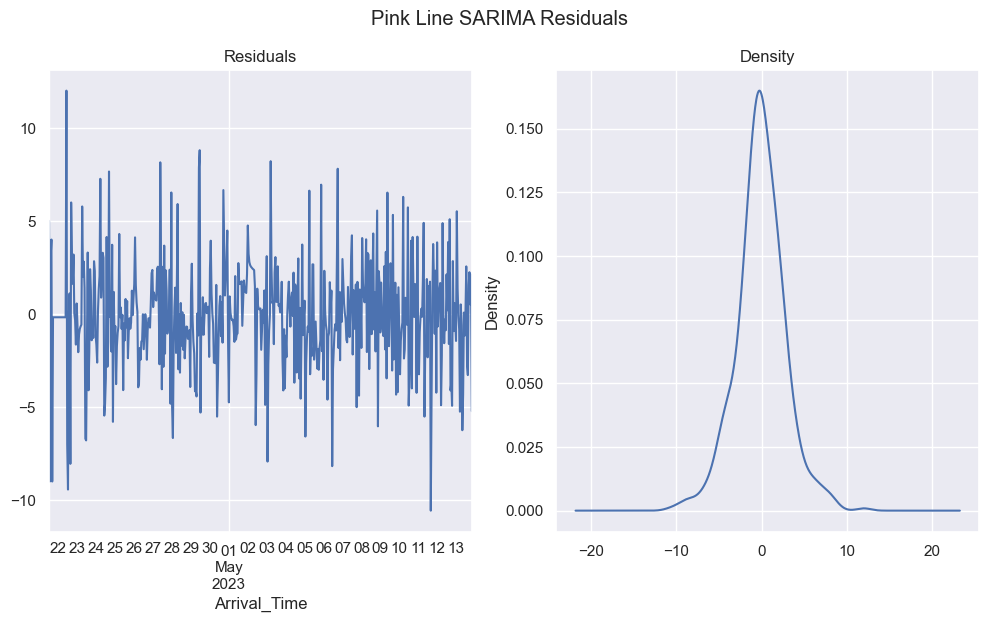

In [170]:
#check residuals
import matplotlib.pyplot as plt
residuals = result.resid[1:]
fig, ax = plt.subplots(1,2)
residuals.plot(title='Residuals', ax=ax[0])
residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.suptitle("Pink Line SARIMA Residuals")
plt.show()
#residuals looks good
#random noise on the left
#normally distributed about the mean on the right

### Predict

In [171]:
#use sarima model to predict on test data set
start = len(df_train)
end = len(df_train) + len(df_test) - 1

predictions = result.predict(start, end,
                             typ = 'levels').rename("Predictions")+df_pink['Frq'] #undifference

<Axes: title={'center': 'Pink Line Predictions'}, xlabel='Arrival_Time'>

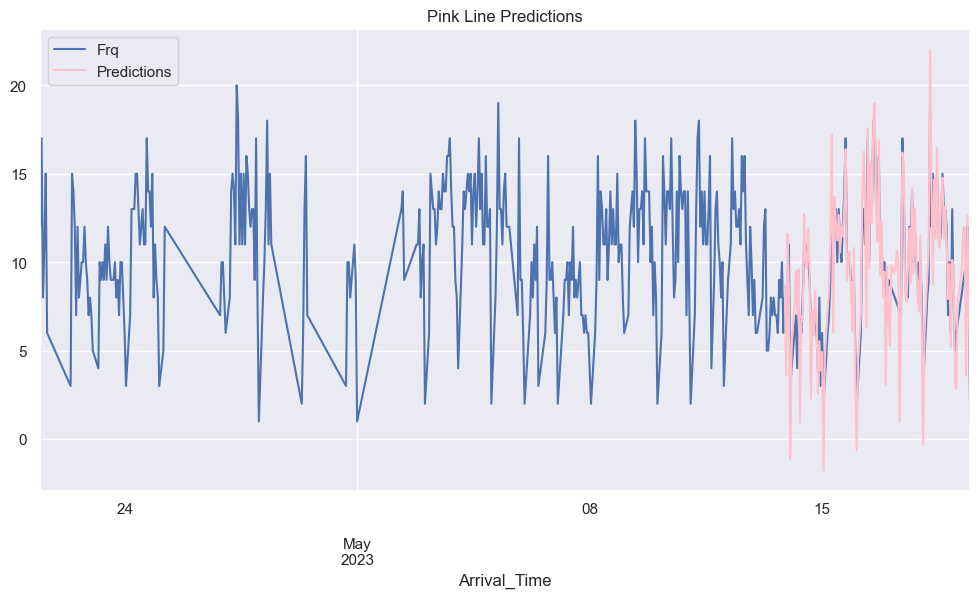

In [172]:
# plot predictions and actual values, showing whole dataset
df_pink['Frq'].plot(legend = True)
predictions.plot(legend = True, title="Pink Line Predictions", label='Predictions', color="pink")

<Axes: title={'center': 'Pink Line Predictions'}, xlabel='Arrival_Time'>

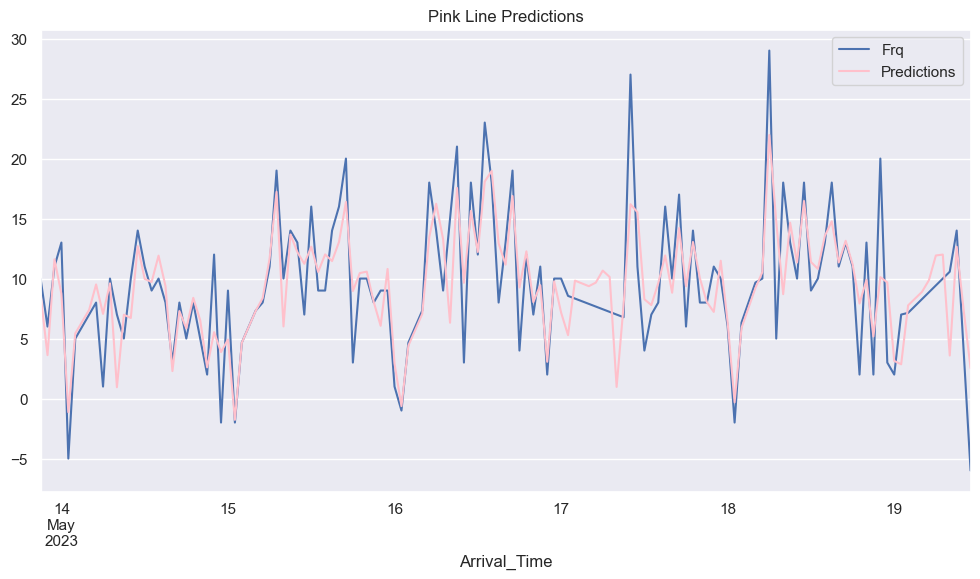

In [174]:
# plot predictions and actual values, zoom on testing dataset
df_test_undiff = df_test+df_pink['Frq'] #undiff
df_test_undiff.dropna(inplace=True)
predictions.dropna(inplace=True)
df_test_undiff.plot(legend = True, label="Frq")
predictions.plot(legend = True, title="Pink Line Predictions", label="Predictions", color="pink")

### Evaluate

In [175]:
# Load specific evaluation tools
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
  
# Calculate root mean squared error
rmse(df_test_undiff, predictions)

#example interpretation: The weighted average error between the predictions and actuals in this dataset is 9.55, which is likely a good value given that the average actual height in the dataset is 170.

3.4154879424707545

### Forecast

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.41643D+00    |proj g|=  1.39116D-01


 This problem is unconstrained.



At iterate    5    f=  2.36854D+00    |proj g|=  1.38591D-02

At iterate   10    f=  2.36342D+00    |proj g|=  3.55811D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6     14     19      1     0     0   9.945D-06   2.363D+00
  F =   2.3633598371298867     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<Axes: xlabel='Arrival_Time'>

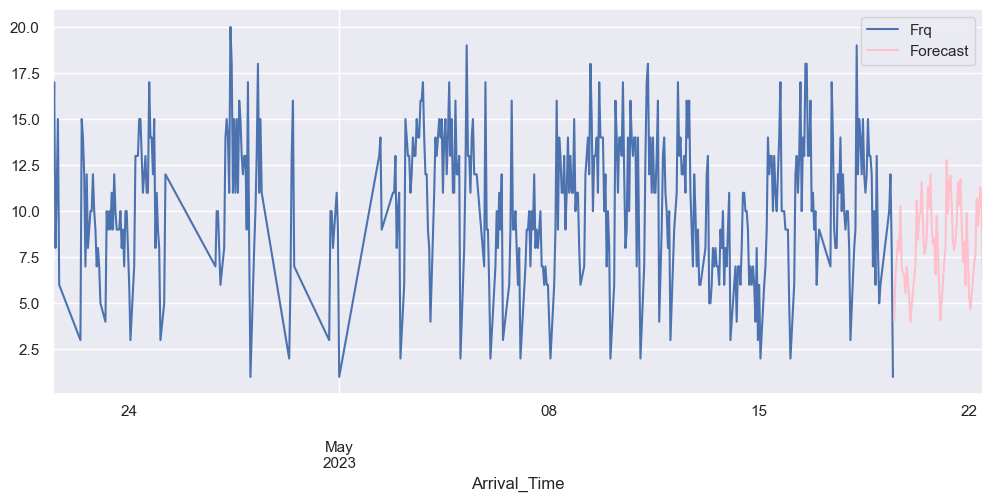

In [177]:
# Train the model on the full dataset
model = SARIMAX(df_pink['Frq'], 
                        order = (1, 0, 2), 
                        seasonal_order =(2, 1, 0, 24))
result = model.fit()
  
# Forecast for the next 3 years
forecast = result.predict(start = len(df_pink), 
                          end = (len(df_pink)-1) + 3 * 24, 
                          typ = 'levels').rename('Forecast')
  
# Plot the forecast values
df_pink['Frq'].plot(figsize = (12, 5), legend = True)
forecast.plot(legend = True, color="pink")

In [178]:
#final model summary
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                 Frq   No. Observations:                  673
Model:             SARIMAX(1, 0, 2)x(2, 1, [], 24)   Log Likelihood               -1590.541
Date:                             Sat, 27 May 2023   AIC                           3193.082
Time:                                     12:40:54   BIC                           3219.935
Sample:                                 04-21-2023   HQIC                          3203.499
                                      - 05-19-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9141      0.025     36.530      0.000       0.865       0.963
ma.L1         -0.4322      0.042    -10.193      0.000      -0.515      -0.349
ma.L2         -0.0797      0.049     -1.641      0.101      -0.175       0.015
ar.S.L24      -0.6817      0.034    -20.003      0.000      -0.749      -0.615
ar.S.L48      -0.3466      0.035     -9.781      0.000      -0.416      -0.277
sigma2         7.7075      0.359     21.491      0.000       7.005       8.410
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                31.53
Prob(Q):                              0.92   Prob(JB):                         0.00
Heteroskedasticity (H):               1.20   Skew:                             0.11
Prob(H) (two-sided):                  0.18   Kurtosis:                         4.06
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Green - Complete

### Check Stationarity

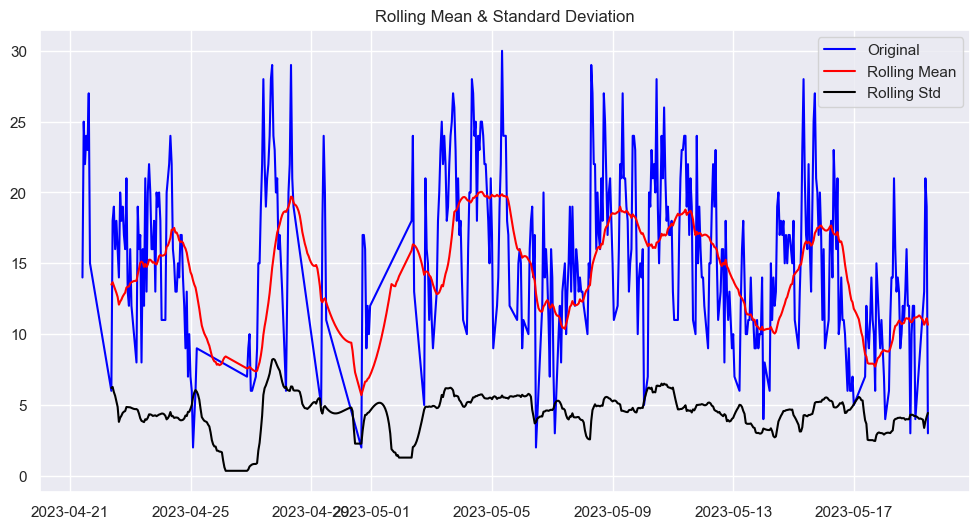

Results of Dickey-Fuller Test:
Test Statistic                -7.802710e+00
p-value                        7.419746e-12
#Lags Used                     2.000000e+00
Number of Observations Used    6.710000e+02
Critical Value (1%)           -3.440133e+00
Critical Value (5%)           -2.865857e+00
Critical Value (10%)          -2.569069e+00
dtype: float64


In [179]:
#We're looking for constant mean, no visible patterns/trends, 
#and a test statistic < critical value

test_stationarity(df_green)

#test statistic is less than 1% critical value, good
#mean and std aren't so constant, could be better
#not super visible pattern, okay

In [180]:
#remove trend and seasonality via differencing
df_green['Diff'] = df_green['Frq'] - df_green['Frq'].shift(1)
df_green.head()

,Frq,Diff
Arrival_Time,,
2023-04-21 10:00:00,14.0,NaN
2023-04-21 11:00:00,25.0,11.0
2023-04-21 12:00:00,22.0,-3.0
2023-04-21 13:00:00,24.0,2.0
2023-04-21 14:00:00,23.0,-1.0


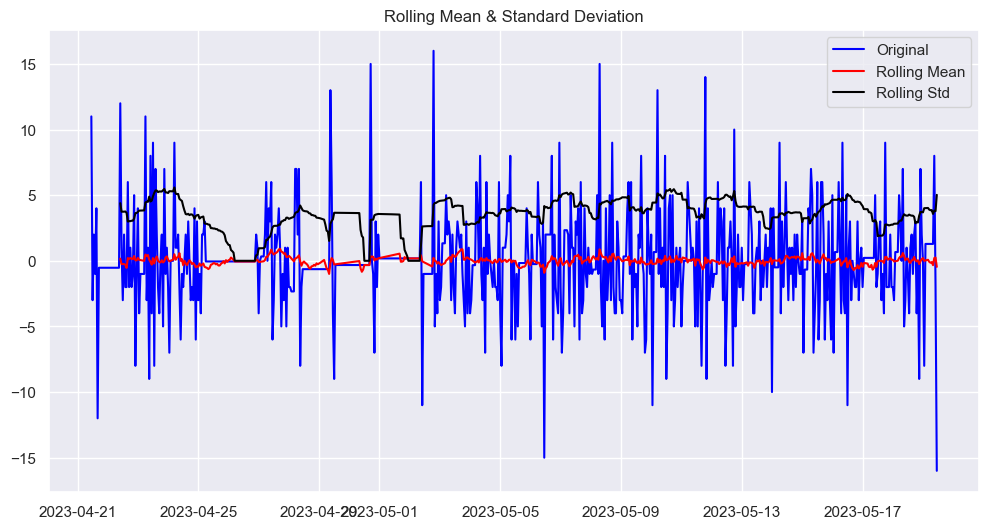

Results of Dickey-Fuller Test:
Test Statistic                -1.043277e+01
p-value                        1.594751e-18
#Lags Used                     2.000000e+01
Number of Observations Used    6.520000e+02
Critical Value (1%)           -3.440419e+00
Critical Value (5%)           -2.865983e+00
Critical Value (10%)          -2.569136e+00
dtype: float64


In [181]:
#test for stationarity again

#first remove the na's created by the shifting
df_green.dropna(inplace=True)
df_green.sort_index(inplace=True)
test_stationarity(df_green['Diff'])
#looking much better
#mean is constant
#no visibile pattern
#test statistic is less than 1% confidence level
#we will want to make sure to use differencing in our model

### Build Model

Now that we've taken care of stationarity, let's assess how to build an ARIMA prediction model
- Good for short-term forecasting
- Only needs historical data

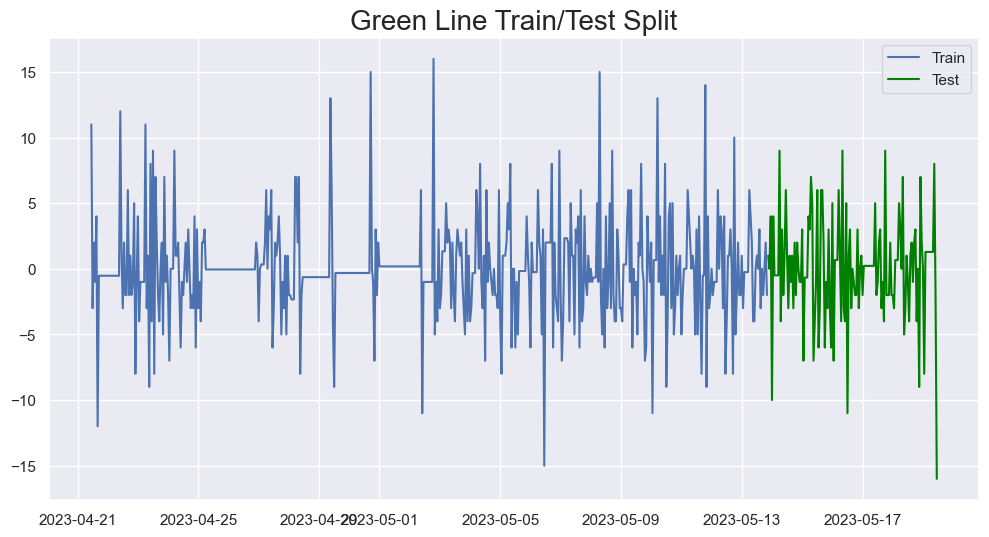

In [182]:
# split into train and test sets
X = df_green['Diff']
size = int(len(X) * 0.8)
df_train, df_test = X[0:size], X[size:len(X)]

#visualize train test split
plt.title('Green Line Train/Test Split', size=20)
plt.plot(df_train, label='Train')
plt.plot(df_test, label='Test', color='green')
plt.legend();

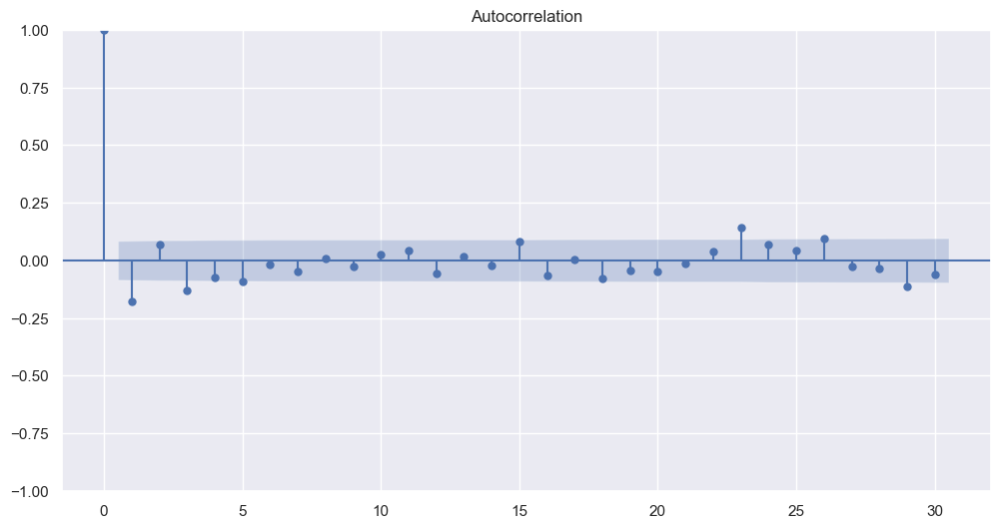

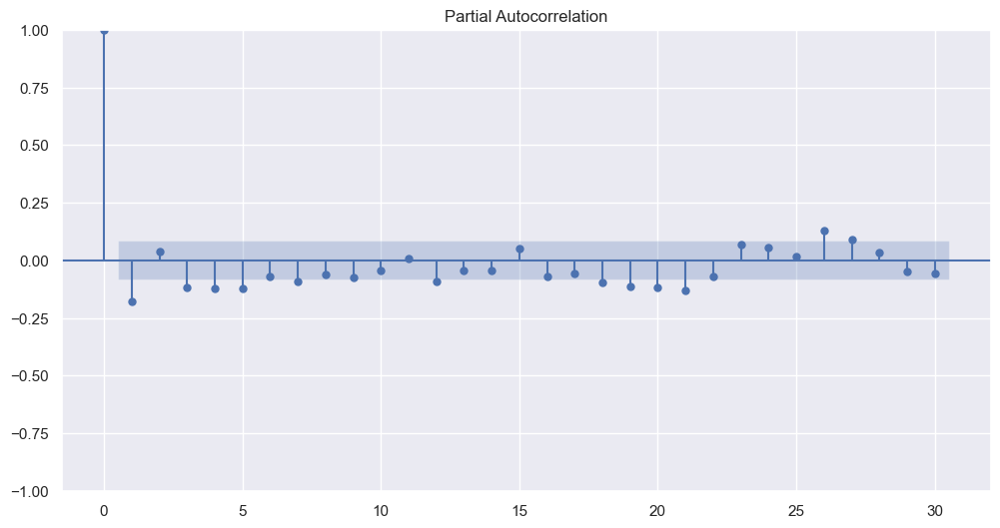

In [183]:
#Need to figure out p and q values
#Plot ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#from statsmodels.tsa.stattools import acf, pacf

acf_original = plot_acf(df_train, lags=30)
pacf_original = plot_pacf(df_train, lags=30)

#because we see ACF and PACF following similar behavior of a big drop
#at the beginning and then a gradual decline, we will combine the
# Auto Regressive (AR), Moving Average (MA), and Integrated (differencing)
#model -- ARIMA

#based on where the residuals cross the confidence interval in PACF, let's
#try p = 2
#based on where the residuals cross the confidence interval in ACF, let's
#try q = 2
#try d = 0 because we already adjusted with differencing

In [184]:
#build a first model
from statsmodels.tsa.arima.model import ARIMA
model=ARIMA(df_train,order=(2,0,2)) #p,d,q
model_fit=model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   Diff   No. Observations:                  538
Model:                 ARIMA(2, 0, 2)   Log Likelihood               -1433.829
Date:                Sat, 27 May 2023   AIC                           2879.657
Time:                        12:43:01   BIC                           2905.384
Sample:                    04-21-2023   HQIC                          2889.721
                         - 05-13-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0049      0.008      0.638      0.524      -0.010       0.020
ar.L1          0.1192      0.191      0.624      0.533      -0.255       0.494
ar.L2          0.5874      0.145      4.062      0.000       0.304       0.871
ma.L1         -0.3945      0.418     -0.945      0.345      -1.213       0.424
ma.L2         -0.6053      0.301     -2.011      0.044      -1.195      -0.015
sigma2        11.9997      4.478      2.680      0.007       3.223      20.776
===================================================================================
Ljung-Box (L1) (Q):                   0.24   Jarque-Bera (JB):               205.43
Prob(Q):                              0.62   Prob(JB):                         0.00
Heteroskedasticity (H):               1.56   Skew:                             0.74
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [185]:
# Import the library
from pmdarima import auto_arima
  
# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

#use stepwise autoarima to find best fit including seasonal order
stepwise_fit = auto_arima(df_train, start_p = 1, start_q = 1,
                          max_p = 3, max_q = 3, m = 24,
                          start_P = 0, seasonal = True, 
                          d = None, D = 1,
                          trace = True,
                          error_action ='ignore',   # we don't want to know if an order does not work
                          suppress_warnings = True,  # we don't want convergence warnings
                          stepwise = True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=7.27 sec
 ARIMA(0,0,0)(0,1,0)[24] intercept   : AIC=3123.461, Time=0.09 sec
 ARIMA(1,0,0)(1,1,0)[24] intercept   : AIC=2921.063, Time=1.20 sec
 ARIMA(0,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=1.94 sec
 ARIMA(0,0,0)(0,1,0)[24]             : AIC=3121.464, Time=0.10 sec
 ARIMA(1,0,0)(0,1,0)[24] intercept   : AIC=3079.642, Time=0.31 sec
 ARIMA(1,0,0)(2,1,0)[24] intercept   : AIC=2865.355, Time=4.45 sec
 ARIMA(1,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=6.22 sec
 ARIMA(1,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=2.37 sec
 ARIMA(0,0,0)(2,1,0)[24] intercept   : AIC=2897.795, Time=2.58 sec
 ARIMA(2,0,0)(2,1,0)[24] intercept   : AIC=2865.037, Time=4.93 sec
 ARIMA(2,0,0)(1,1,0)[24] intercept   : AIC=2921.284, Time=1.97 sec
 ARIMA(2,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=8.24 sec
 ARIMA(2,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=2.95 sec
 ARIMA(3,0,0)(2,1,0)[24] intercept   : AIC=2854.8

In [186]:
#use results from stepwise to train model on training set
#SARIMA:Seasonal ARIMA

from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(df_train, 
                order = (3, 0, 3), 
                seasonal_order =(2, 1, 0, 24))
  
result = model.fit()
result.summary()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.66804D+00    |proj g|=  6.97641D-02


 This problem is unconstrained.



At iterate    5    f=  2.62962D+00    |proj g|=  2.60911D-02

At iterate   10    f=  2.62821D+00    |proj g|=  8.61413D-03

At iterate   15    f=  2.62801D+00    |proj g|=  3.15057D-03

At iterate   20    f=  2.62796D+00    |proj g|=  1.80613D-03

At iterate   25    f=  2.62624D+00    |proj g|=  5.67223D-02

At iterate   30    f=  2.62345D+00    |proj g|=  1.40471D-02

At iterate   35    f=  2.62174D+00    |proj g|=  5.70906D-02

At iterate   40    f=  2.62077D+00    |proj g|=  1.15899D-02

At iterate   45    f=  2.62040D+00    |proj g|=  2.11283D-02

At iterate   50    f=  2.62023D+00    |proj g|=  9.61616D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                Diff   No. Observations:                  538
Model:             SARIMAX(3, 0, 3)x(2, 1, [], 24)   Log Likelihood               -1409.682
Date:                             Sat, 27 May 2023   AIC                           2837.364
Time:                                     12:50:25   BIC                           2875.544
Sample:                                 04-21-2023   HQIC                          2852.329
                                      - 05-13-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6526      0.082      7.971      0.000       0.492       0.813
ar.L2         -0.9922      0.051    -19.541      0.000      -1.092      -0.893
ar.L3          0.3885      0.082      4.728      0.000       0.227       0.550
ma.L1         -0.9583      0.060    -15.873      0.000      -1.077      -0.840
ma.L2          1.1016      0.038     28.903      0.000       1.027       1.176
ma.L3         -0.7469      0.060    -12.379      0.000      -0.865      -0.629
ar.S.L24      -0.7095      0.041    -17.474      0.000      -0.789      -0.630
ar.S.L48      -0.3500      0.041     -8.489      0.000      -0.431      -0.269
sigma2        13.7362      0.656     20.952      0.000      12.451      15.021
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):               103.21
Prob(Q):                              0.85   Prob(JB):                         0.00
Heteroskedasticity (H):               1.06   Skew:                             0.24
Prob(H) (two-sided):                  0.69   Kurtosis:                         5.14
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

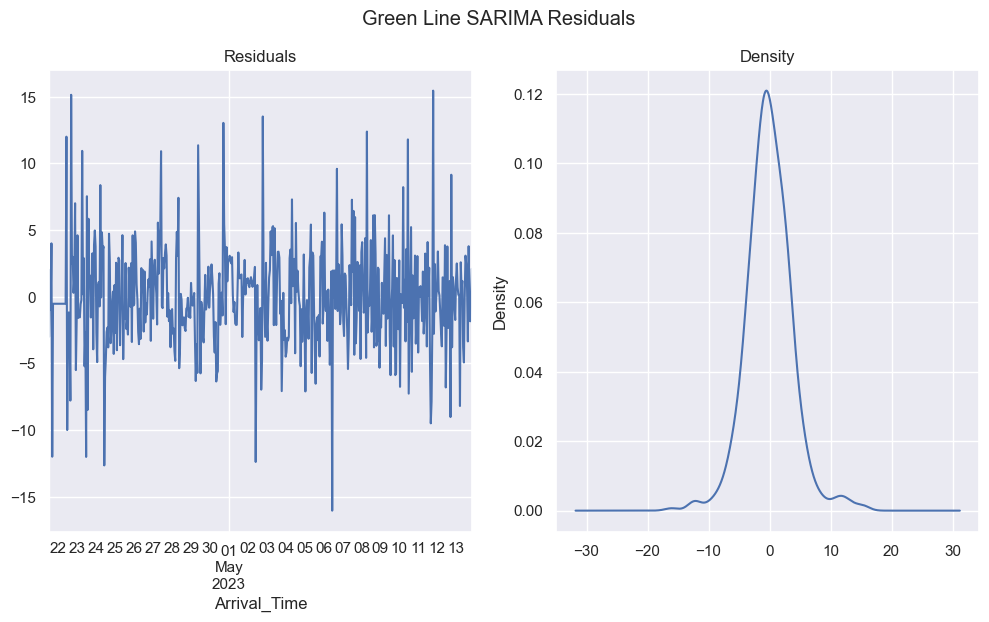

In [187]:
#check residuals
import matplotlib.pyplot as plt
residuals = result.resid[1:]
fig, ax = plt.subplots(1,2)
residuals.plot(title='Residuals', ax=ax[0])
residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.suptitle("Green Line SARIMA Residuals")
plt.show()
#residuals looks good
#random noise on the left
#normally distributed about the mean on the right

### Predict

In [188]:
#use sarima model to predict on test data set
start = len(df_train)
end = len(df_train) + len(df_test) - 1

predictions = result.predict(start, end,
                             typ = 'levels').rename("Predictions")+df_green['Frq'] #undifference

<Axes: title={'center': 'Green Line Predictions'}, xlabel='Arrival_Time'>

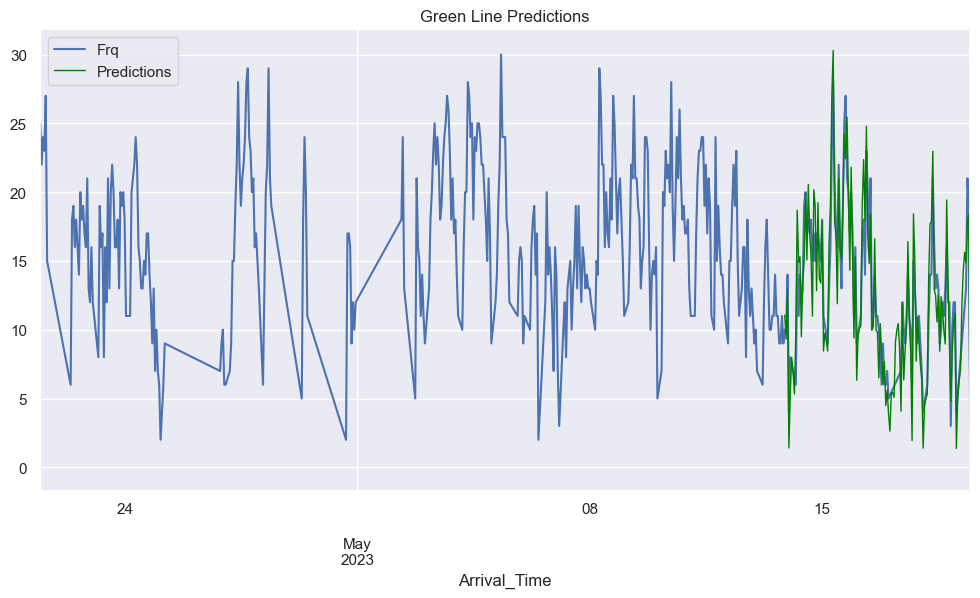

In [198]:
# plot predictions and actual values, showing whole dataset
df_green['Frq'].plot(legend = True)
predictions.plot(legend = True, title="Green Line Predictions", label='Predictions', color="green", lw="1")

<Axes: title={'center': 'Green Line Predictions'}, xlabel='Arrival_Time'>

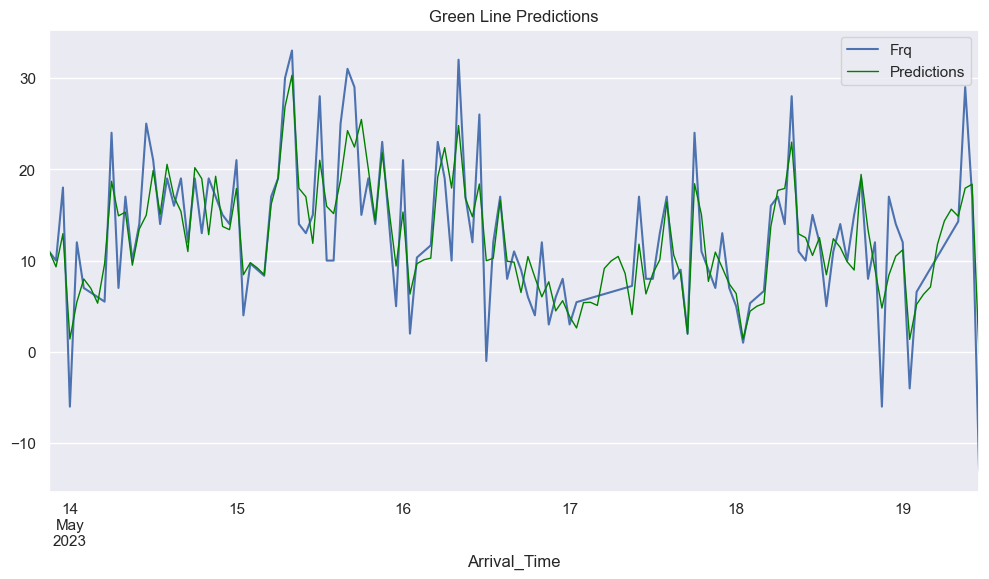

In [199]:
# plot predictions and actual values, zoom on testing dataset
df_test_undiff = df_test+df_green['Frq'] #undiff
df_test_undiff.dropna(inplace=True)
predictions.dropna(inplace=True)
df_test_undiff.plot(legend = True, label="Frq")
predictions.plot(legend = True, title="Green Line Predictions", label="Predictions", lw="1", color="green")

### Evaluate

In [200]:
# Load specific evaluation tools
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
  
# Calculate root mean squared error
rmse(df_test_undiff, predictions)

#example interpretation: The weighted average error between the predictions and actuals in this dataset is 9.55, which is likely a good value given that the average actual height in the dataset is 170.

4.1263270417629165

### Forecast

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.72018D+00    |proj g|=  3.09600D-01


 This problem is unconstrained.



At iterate    5    f=  2.64522D+00    |proj g|=  2.22752D-02

At iterate   10    f=  2.64467D+00    |proj g|=  5.21802D-04

At iterate   15    f=  2.64466D+00    |proj g|=  1.05504D-03

At iterate   20    f=  2.64465D+00    |proj g|=  7.26870D-04

At iterate   25    f=  2.64462D+00    |proj g|=  4.64008D-04

At iterate   30    f=  2.64462D+00    |proj g|=  4.11274D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     31     33      1     0     0   3.436D-05   2.645D+00
  F =   2.6446161710575633     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


<Axes: xlabel='Arrival_Time'>

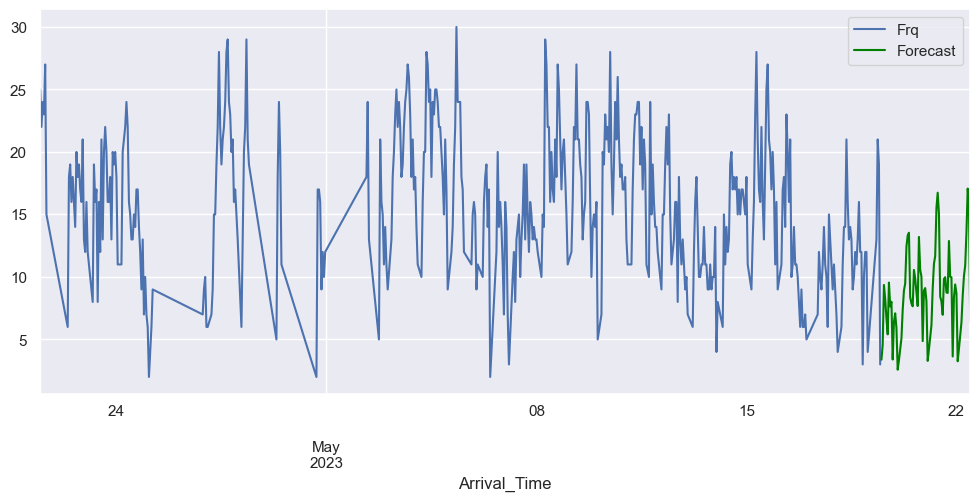

In [202]:
# Train the model on the full dataset
model = SARIMAX(df_green['Frq'], 
                        order = (3, 0, 3), 
                        seasonal_order =(2, 1, 0, 24))
result = model.fit()
  
# Forecast for the next 3 years
forecast = result.predict(start = len(df_green), 
                          end = (len(df_green)-1) + 3 * 24, 
                          typ = 'levels').rename('Forecast')
  
# Plot the forecast values
df_green['Frq'].plot(figsize = (12, 5), legend = True)
forecast.plot(legend = True, color="green")

In [203]:
#final model summary
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                 Frq   No. Observations:                  673
Model:             SARIMAX(3, 0, 3)x(2, 1, [], 24)   Log Likelihood               -1779.827
Date:                             Sat, 27 May 2023   AIC                           3577.653
Time:                                     12:57:43   BIC                           3617.932
Sample:                                 04-21-2023   HQIC                          3593.278
                                      - 05-19-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.2459      0.262      4.763      0.000       0.733       1.759
ar.L2         -0.9096      0.388     -2.341      0.019      -1.671      -0.148
ar.L3          0.5671      0.198      2.864      0.004       0.179       0.955
ma.L1         -0.6216      0.258     -2.411      0.016      -1.127      -0.116
ma.L2          0.6473      0.261      2.484      0.013       0.137       1.158
ma.L3         -0.2603      0.067     -3.861      0.000      -0.392      -0.128
ar.S.L24      -0.6979      0.036    -19.434      0.000      -0.768      -0.628
ar.S.L48      -0.3569      0.036     -9.898      0.000      -0.428      -0.286
sigma2        13.7909      0.590     23.391      0.000      12.635      14.946
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               115.17
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               1.20   Skew:                             0.16
Prob(H) (two-sided):                  0.19   Kurtosis:                         5.04
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Orange - Complete

### Check Stationarity

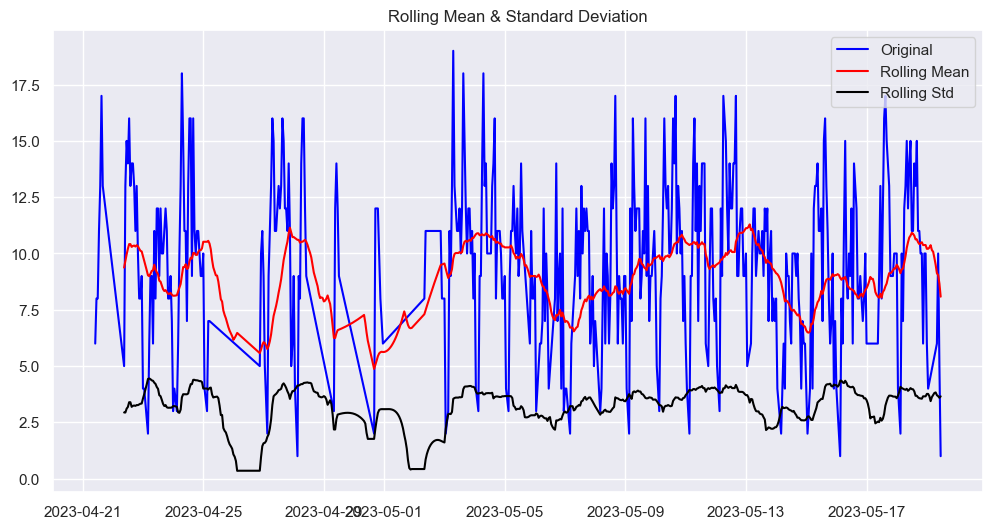

Results of Dickey-Fuller Test:
Test Statistic                  -3.755297
p-value                          0.003399
#Lags Used                      20.000000
Number of Observations Used    653.000000
Critical Value (1%)             -3.440404
Critical Value (5%)             -2.865976
Critical Value (10%)            -2.569132
dtype: float64


In [204]:
#We're looking for constant mean, no visible patterns/trends, 
#and a test statistic < critical value

test_stationarity(df_org)

#test statistic is less than 1% critical value, good
#mean and std aren't so constant, could be better
#not super visible pattern, okay

In [207]:
#remove trend and seasonality via differencing
df_org['Diff'] = df_org['Frq'] - df_org['Frq'].shift(1)
df_org.head()

,Frq,Diff
Arrival_Time,,
2023-04-21 10:00:00,6.0,NaN
2023-04-21 11:00:00,8.0,2.0
2023-04-21 12:00:00,8.0,0.0
2023-04-21 13:00:00,11.0,3.0
2023-04-21 14:00:00,13.0,2.0


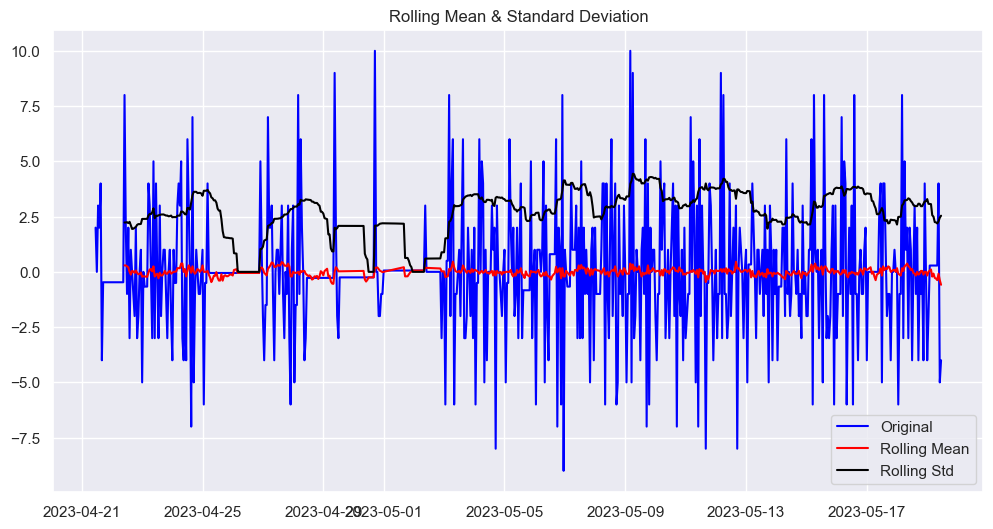

Results of Dickey-Fuller Test:
Test Statistic                -1.217115e+01
p-value                        1.419809e-22
#Lags Used                     2.000000e+01
Number of Observations Used    6.520000e+02
Critical Value (1%)           -3.440419e+00
Critical Value (5%)           -2.865983e+00
Critical Value (10%)          -2.569136e+00
dtype: float64


In [208]:
#test for stationarity again

#first remove the na's created by the shifting
df_org.dropna(inplace=True)
df_org.sort_index(inplace=True)
test_stationarity(df_org['Diff'])
#looking much better
#mean is constant
#no visibile pattern
#test statistic is less than 1% confidence level
#we will want to make sure to use differencing in our model

### Build Model

Now that we've taken care of stationarity, let's assess how to build an ARIMA prediction model
- Good for short-term forecasting
- Only needs historical data

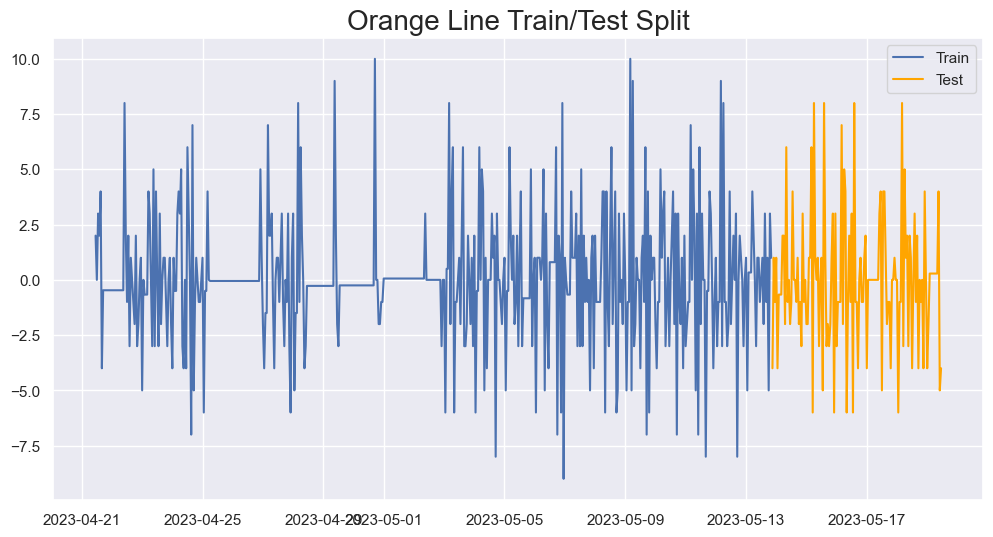

In [209]:
# split into train and test sets
X = df_org['Diff']
size = int(len(X) * 0.8)
df_train, df_test = X[0:size], X[size:len(X)]

#visualize train test split
plt.title('Orange Line Train/Test Split', size=20)
plt.plot(df_train, label='Train')
plt.plot(df_test, label='Test', color='orange')
plt.legend();

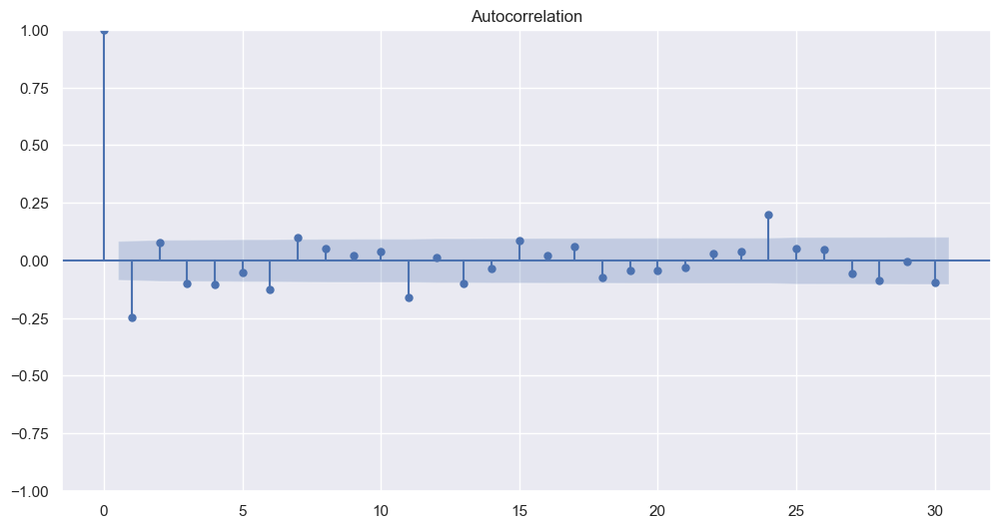

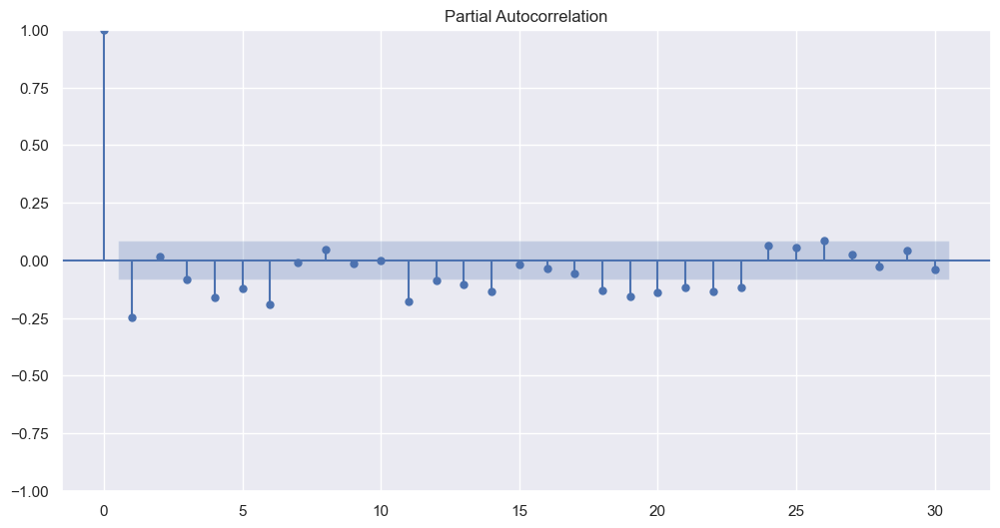

In [210]:
#Need to figure out p and q values
#Plot ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#from statsmodels.tsa.stattools import acf, pacf

acf_original = plot_acf(df_train, lags=30)
pacf_original = plot_pacf(df_train, lags=30)

#because we see ACF and PACF following similar behavior of a big drop
#at the beginning and then a gradual decline, we will combine the
# Auto Regressive (AR), Moving Average (MA), and Integrated (differencing)
#model -- ARIMA

#based on where the residuals cross the confidence interval in PACF, let's
#try p = 1
#based on where the residuals cross the confidence interval in ACF, let's
#try q = 2
#try d = 0 because we already adjusted with differencing

In [211]:
#build a first model
from statsmodels.tsa.arima.model import ARIMA
model=ARIMA(df_train,order=(1,0,2)) #p,d,q
model_fit=model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   Diff   No. Observations:                  538
Model:                 ARIMA(1, 0, 2)   Log Likelihood               -1263.472
Date:                Sat, 27 May 2023   AIC                           2536.943
Time:                        13:01:04   BIC                           2558.383
Sample:                    04-21-2023   HQIC                          2545.330
                         - 05-13-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0030      0.003      1.057      0.291      -0.003       0.009
ar.L1          0.7531      0.044     17.193      0.000       0.667       0.839
ma.L1         -1.1127      1.607     -0.692      0.489      -4.262       2.037
ma.L2          0.1127      0.200      0.564      0.573      -0.279       0.504
sigma2         6.3653     10.204      0.624      0.533     -13.635      26.366
===================================================================================
Ljung-Box (L1) (Q):                   0.11   Jarque-Bera (JB):                50.19
Prob(Q):                              0.74   Prob(JB):                         0.00
Heteroskedasticity (H):               1.66   Skew:                             0.54
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.04
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [212]:
# Import the library
from pmdarima import auto_arima
  
# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

#use stepwise autoarima to find best fit including seasonal order
stepwise_fit = auto_arima(df_train, start_p = 1, start_q = 1,
                          max_p = 3, max_q = 3, m = 24,
                          start_P = 0, seasonal = True, 
                          d = None, D = 1,
                          trace = True,
                          error_action ='ignore',   # we don't want to know if an order does not work
                          suppress_warnings = True,  # we don't want convergence warnings
                          stepwise = True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=3.99 sec
 ARIMA(0,0,0)(0,1,0)[24] intercept   : AIC=2750.652, Time=0.12 sec
 ARIMA(1,0,0)(1,1,0)[24] intercept   : AIC=2575.538, Time=1.12 sec
 ARIMA(0,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=1.83 sec
 ARIMA(0,0,0)(0,1,0)[24]             : AIC=2748.662, Time=0.09 sec
 ARIMA(1,0,0)(0,1,0)[24] intercept   : AIC=2675.222, Time=0.28 sec
 ARIMA(1,0,0)(2,1,0)[24] intercept   : AIC=2519.129, Time=3.57 sec
 ARIMA(1,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=6.77 sec
 ARIMA(1,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=2.66 sec
 ARIMA(0,0,0)(2,1,0)[24] intercept   : AIC=2579.250, Time=2.75 sec
 ARIMA(2,0,0)(2,1,0)[24] intercept   : AIC=2516.710, Time=4.42 sec
 ARIMA(2,0,0)(1,1,0)[24] intercept   : AIC=2575.190, Time=1.72 sec
 ARIMA(2,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=8.32 sec
 ARIMA(2,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=3.34 sec
 ARIMA(3,0,0)(2,1,0)[24] intercept   : AIC=2510.7

In [213]:
#use results from stepwise to train model on training set
#SARIMA:Seasonal ARIMA

from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(df_train, 
                order = (3, 0, 1), 
                seasonal_order =(2, 1, 0, 24))
  
result = model.fit()
result.summary()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.34390D+00    |proj g|=  8.61647D-02


 This problem is unconstrained.



At iterate    5    f=  2.31321D+00    |proj g|=  1.63156D-02

At iterate   10    f=  2.28968D+00    |proj g|=  2.57313D-02

At iterate   15    f=  2.28244D+00    |proj g|=  4.07999D-03

At iterate   20    f=  2.28238D+00    |proj g|=  4.07028D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     20     23      1     0     0   4.070D-05   2.282D+00
  F =   2.2823841999690280     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                Diff   No. Observations:                  538
Model:             SARIMAX(3, 0, 1)x(2, 1, [], 24)   Log Likelihood               -1227.923
Date:                             Sat, 27 May 2023   AIC                           2469.845
Time:                                     13:10:12   BIC                           2499.541
Sample:                                 04-21-2023   HQIC                          2481.484
                                      - 05-13-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4752      0.042     11.212      0.000       0.392       0.558
ar.L2          0.1762      0.048      3.697      0.000       0.083       0.270
ar.L3         -0.0564      0.046     -1.216      0.224      -0.147       0.035
ma.L1         -0.9451      0.021    -45.716      0.000      -0.986      -0.905
ar.S.L24      -0.5904      0.041    -14.286      0.000      -0.671      -0.509
ar.S.L48      -0.3412      0.043     -7.888      0.000      -0.426      -0.256
sigma2         6.7926      0.326     20.855      0.000       6.154       7.431
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                75.49
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               1.11   Skew:                             0.24
Prob(H) (two-sided):                  0.49   Kurtosis:                         4.81
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

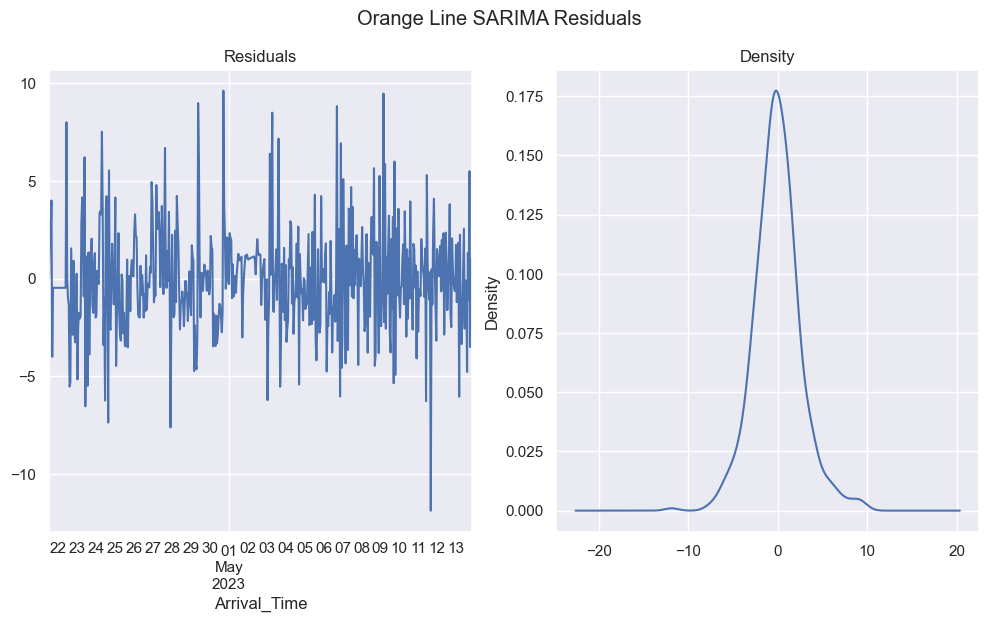

In [214]:
#check residuals
import matplotlib.pyplot as plt
residuals = result.resid[1:]
fig, ax = plt.subplots(1,2)
residuals.plot(title='Residuals', ax=ax[0])
residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.suptitle("Orange Line SARIMA Residuals")
plt.show()
#residuals looks good
#random noise on the left
#normally distributed about the mean on the right

### Predict

In [215]:
#use sarima model to predict on test data set
start = len(df_train)
end = len(df_train) + len(df_test) - 1

predictions = result.predict(start, end,
                             typ = 'levels').rename("Predictions")+df_org['Frq'] #undifference

<Axes: title={'center': 'Orange Line Predictions'}, xlabel='Arrival_Time'>

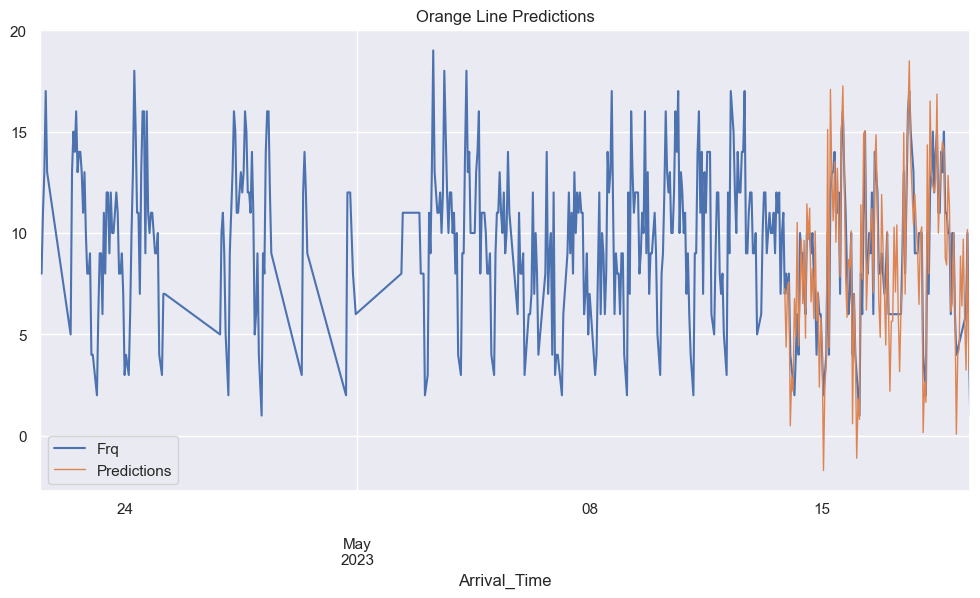

In [219]:
# plot predictions and actual values, showing whole dataset
df_org['Frq'].plot(legend = True)
predictions.plot(legend = True, title="Orange Line Predictions", label='Predictions', lw=1)

<Axes: title={'center': 'Orange Line Predictions'}, xlabel='Arrival_Time'>

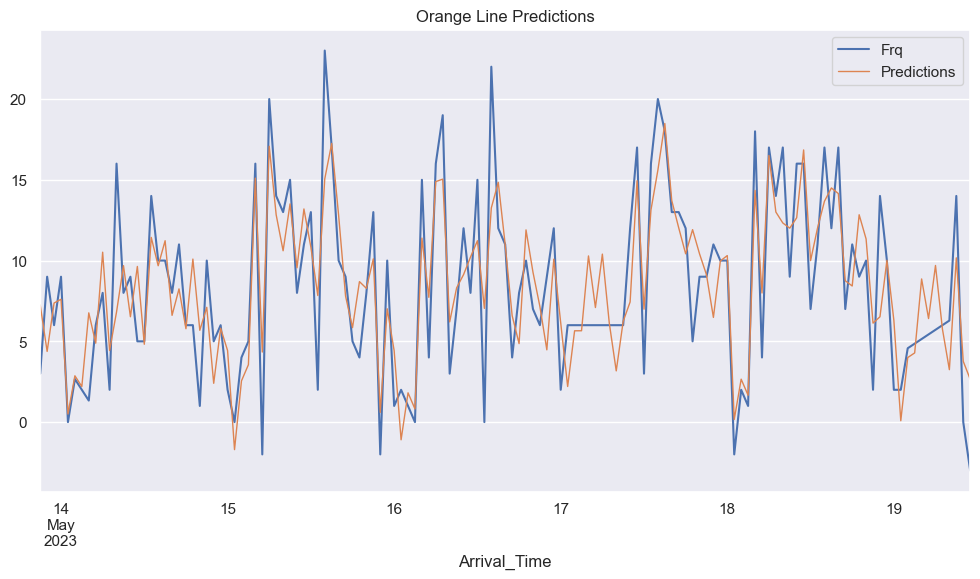

In [220]:
# plot predictions and actual values, zoom on testing dataset
df_test_undiff = df_test+df_org['Frq'] #undiff
df_test_undiff.dropna(inplace=True)
predictions.dropna(inplace=True)
df_test_undiff.plot(legend = True, label="Frq")
predictions.plot(legend = True, title="Orange Line Predictions", label="Predictions", lw=1)

### Evaluate

In [221]:
# Load specific evaluation tools
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
  
# Calculate root mean squared error
rmse(df_test_undiff, predictions)

#example interpretation: The weighted average error between the predictions and actuals in this dataset is 9.55, which is likely a good value given that the average actual height in the dataset is 170.

3.1739652180098803

### Forecast

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.32914D+00    |proj g|=  8.36872D-02


 This problem is unconstrained.



At iterate    5    f=  2.30484D+00    |proj g|=  9.10030D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7      9     12      1     0     0   1.420D-05   2.305D+00
  F =   2.3048390620548100     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


<Axes: xlabel='Arrival_Time'>

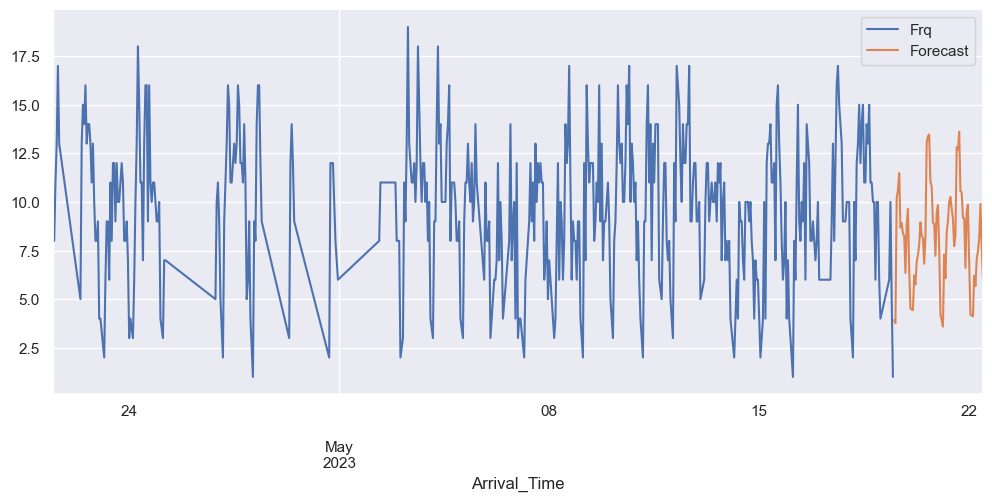

In [222]:
# Train the model on the full dataset
model = SARIMAX(df_org['Frq'], 
                        order = (3, 0, 1), 
                        seasonal_order =(2, 1, 0, 24))
result = model.fit()
  
# Forecast for the next 3 years
forecast = result.predict(start = len(df_org), 
                          end = (len(df_org)-1) + 3 * 24, 
                          typ = 'levels').rename('Forecast')
  
# Plot the forecast values
df_org['Frq'].plot(figsize = (12, 5), legend = True)
forecast.plot(legend = True)

In [223]:
#final model summary
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                 Frq   No. Observations:                  673
Model:             SARIMAX(3, 0, 1)x(2, 1, [], 24)   Log Likelihood               -1551.157
Date:                             Sat, 27 May 2023   AIC                           3116.313
Time:                                     13:12:17   BIC                           3147.641
Sample:                                 04-21-2023   HQIC                          3128.466
                                      - 05-19-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2998      3.261      0.092      0.927      -6.092       6.691
ar.L2          0.2869      1.592      0.180      0.857      -2.834       3.408
ar.L3          0.0485      0.654      0.074      0.941      -1.233       1.330
ma.L1          0.1854      3.261      0.057      0.955      -6.205       6.576
ar.S.L24      -0.5632      0.037    -15.369      0.000      -0.635      -0.491
ar.S.L48      -0.3586      0.038     -9.449      0.000      -0.433      -0.284
sigma2         6.8501      0.311     22.015      0.000       6.240       7.460
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                38.36
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               1.08   Skew:                             0.09
Prob(H) (two-sided):                  0.59   Kurtosis:                         4.18
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Blue - Complete

### Check Stationarity

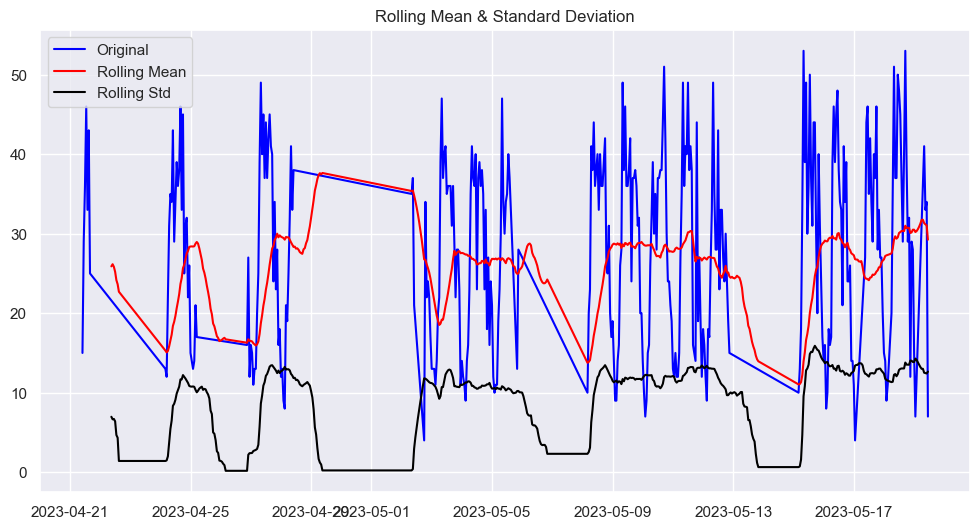

Results of Dickey-Fuller Test:
Test Statistic                  -2.800682
p-value                          0.058176
#Lags Used                      20.000000
Number of Observations Used    653.000000
Critical Value (1%)             -3.440404
Critical Value (5%)             -2.865976
Critical Value (10%)            -2.569132
dtype: float64


In [224]:
#We're looking for constant mean, no visible patterns/trends, 
#and a test statistic < critical value

test_stationarity(df_blue)

#test statistic is less than 10% critical value, okay
#mean and std aren't so constant, could be better
#not super visible pattern, okay

In [225]:
#remove trend and seasonality via differencing
#df_red['First Difference'] = df_red['Frq'] - df_red['Frq'].shift(1)
df_blue['Diff'] = df_blue['Frq'] - df_blue['Frq'].shift(1)
df_blue.head()

,Frq,Diff
Arrival_Time,,
2023-04-21 10:00:00,15.0,NaN
2023-04-21 11:00:00,29.0,14.0
2023-04-21 12:00:00,36.0,7.0
2023-04-21 13:00:00,46.0,10.0
2023-04-21 14:00:00,33.0,-13.0


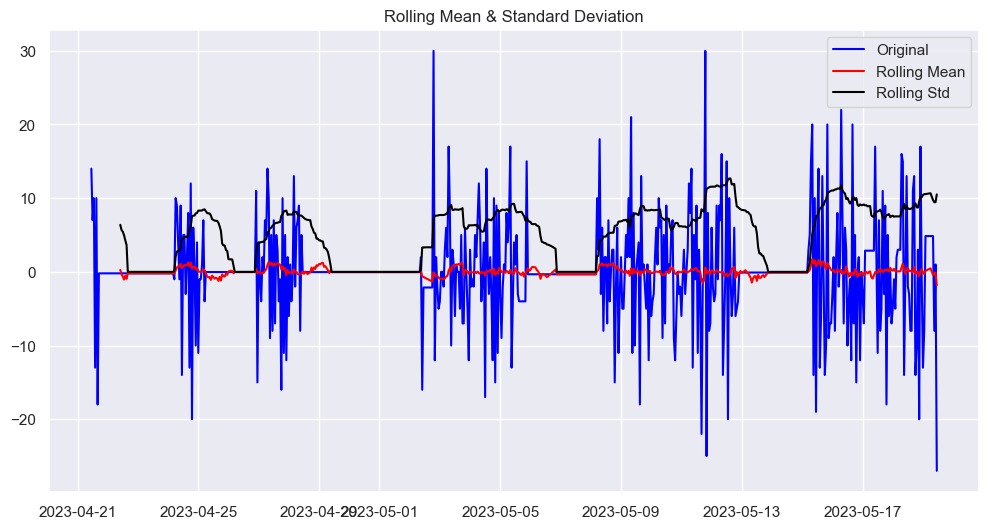

Results of Dickey-Fuller Test:
Test Statistic                -1.138097e+01
p-value                        8.513350e-21
#Lags Used                     1.900000e+01
Number of Observations Used    6.530000e+02
Critical Value (1%)           -3.440404e+00
Critical Value (5%)           -2.865976e+00
Critical Value (10%)          -2.569132e+00
dtype: float64


In [226]:
#test for stationarity again

#first remove the na's created by the shifting
df_blue.dropna(inplace=True)
df_blue.sort_index(inplace=True)
test_stationarity(df_blue['Diff'])
#looking much better
#mean is constant
#no visibile pattern
#test statistic is less than 1% confidence level
#we will want to make sure to use differencing in our model

### Build Model

Now that we've taken care of stationarity, let's assess how to build an ARIMA prediction model
- Good for short-term forecasting
- Only needs historical data

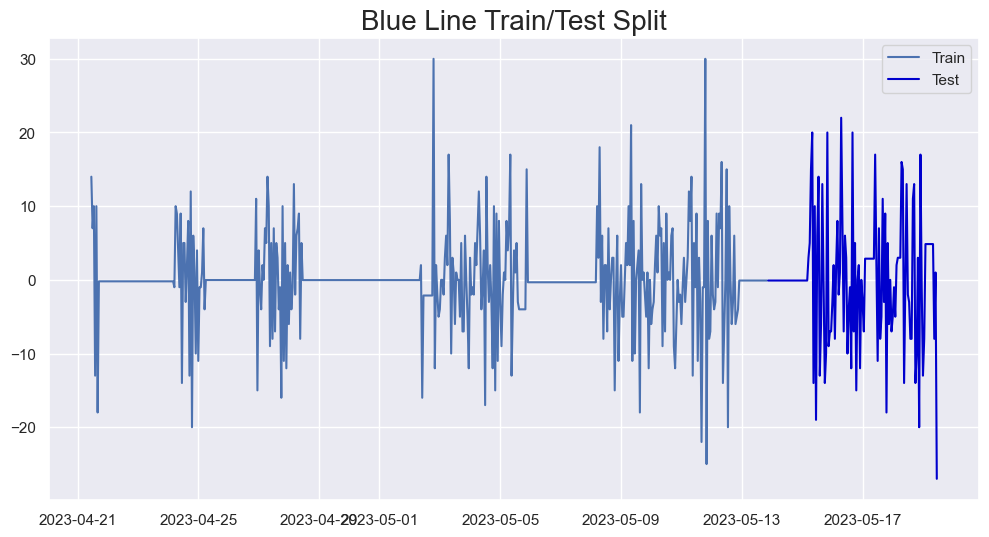

In [229]:
# split into train and test sets
X = df_blue['Diff']
size = int(len(X) * 0.8)
df_train, df_test = X[0:size], X[size:len(X)]

#visualize train test split
plt.title('Blue Line Train/Test Split', size=20)
plt.plot(df_train, label='Train')
plt.plot(df_test, label='Test', color='mediumblue')
plt.legend();

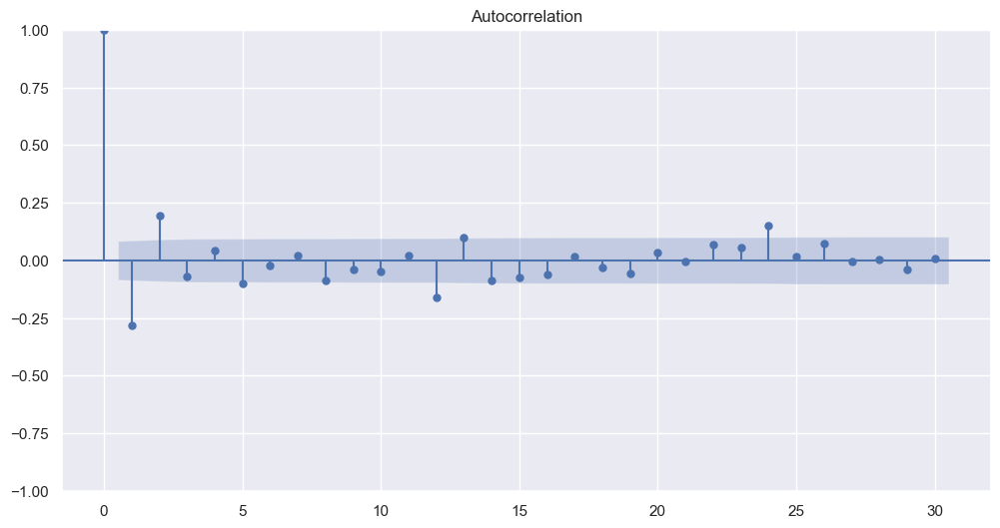

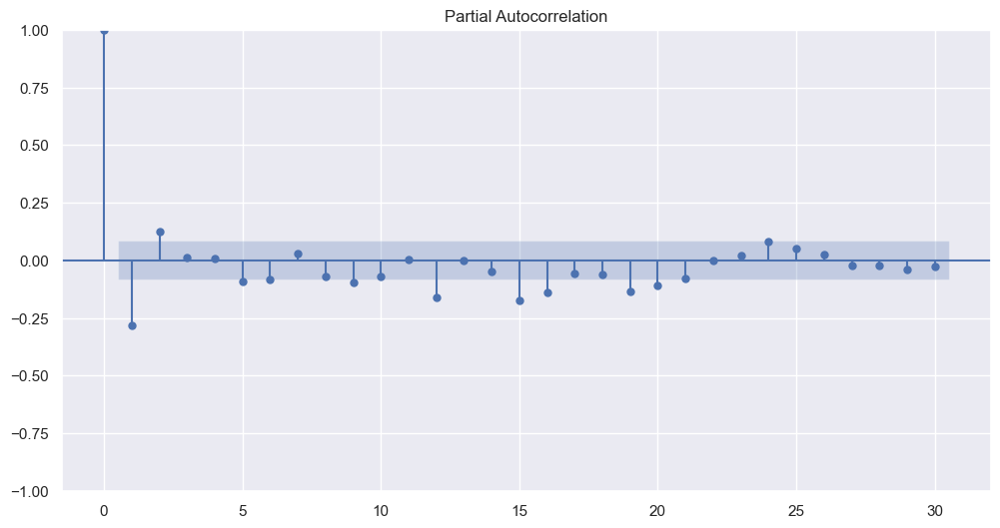

In [230]:
#Need to figure out p and q values
#Plot ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#from statsmodels.tsa.stattools import acf, pacf

acf_original = plot_acf(df_train, lags=30)
pacf_original = plot_pacf(df_train, lags=30)

#because we see ACF and PACF following similar behavior of a big drop
#at the beginning and then a gradual decline, we will combine the
# Auto Regressive (AR), Moving Average (MA), and Integrated (differencing)
#model -- ARIMA

#based on where the residuals cross the confidence interval in PACF, let's
#try p = 2
#based on where the residuals cross the confidence interval in ACF, let's
#try q = 2
#try d = 0 because we already adjusted with differencing

In [231]:
#build a first model
from statsmodels.tsa.arima.model import ARIMA
model=ARIMA(df_train,order=(2,0,2)) #p,d,q
model_fit=model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   Diff   No. Observations:                  538
Model:                 ARIMA(2, 0, 2)   Log Likelihood               -1681.315
Date:                Sat, 27 May 2023   AIC                           3374.631
Time:                        13:14:04   BIC                           3400.358
Sample:                    04-21-2023   HQIC                          3384.694
                         - 05-13-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0042      0.242     -0.017      0.986      -0.478       0.470
ar.L1         -0.1589      0.437     -0.363      0.716      -1.016       0.698
ar.L2          0.1123      0.291      0.386      0.700      -0.458       0.683
ma.L1         -0.0919      0.433     -0.212      0.832      -0.940       0.756
ma.L2          0.0408      0.197      0.207      0.836      -0.345       0.426
sigma2        30.3304      1.039     29.200      0.000      28.295      32.366
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               622.70
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               1.94   Skew:                             0.53
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.16
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [232]:
# Import the library
from pmdarima import auto_arima
  
# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

#use stepwise autoarima to find best fit including seasonal order
stepwise_fit = auto_arima(df_train, start_p = 1, start_q = 1,
                          max_p = 3, max_q = 3, m = 24,
                          start_P = 0, seasonal = True, 
                          d = None, D = 1,
                          trace = True,
                          error_action ='ignore',   # we don't want to know if an order does not work
                          suppress_warnings = True,  # we don't want convergence warnings
                          stepwise = True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=2.80 sec
 ARIMA(0,0,0)(0,1,0)[24] intercept   : AIC=3546.728, Time=0.10 sec
 ARIMA(1,0,0)(1,1,0)[24] intercept   : AIC=3354.635, Time=1.42 sec
 ARIMA(0,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=2.07 sec
 ARIMA(0,0,0)(0,1,0)[24]             : AIC=3544.733, Time=0.09 sec
 ARIMA(1,0,0)(0,1,0)[24] intercept   : AIC=3469.356, Time=0.44 sec
 ARIMA(1,0,0)(2,1,0)[24] intercept   : AIC=3311.502, Time=4.78 sec
 ARIMA(1,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=7.03 sec
 ARIMA(1,0,0)(1,1,1)[24] intercept   : AIC=inf, Time=2.29 sec
 ARIMA(0,0,0)(2,1,0)[24] intercept   : AIC=3378.557, Time=2.83 sec
 ARIMA(2,0,0)(2,1,0)[24] intercept   : AIC=3312.783, Time=5.24 sec
 ARIMA(1,0,1)(2,1,0)[24] intercept   : AIC=3312.818, Time=7.04 sec
 ARIMA(0,0,1)(2,1,0)[24] intercept   : AIC=3322.645, Time=3.66 sec
 ARIMA(2,0,1)(2,1,0)[24] intercept   : AIC=3314.741, Time=8.19 sec
 ARIMA(1,0,0)(2,1,0)[24]             : 

In [233]:
#use results from stepwise to train model on training set
#SARIMA:Seasonal ARIMA

from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(df_train, 
                order = (1, 0, 0), 
                seasonal_order =(2, 1, 0, 24))
  
result = model.fit()
result.summary()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.09324D+00    |proj g|=  4.15983D-02


 This problem is unconstrained.



At iterate    5    f=  3.06924D+00    |proj g|=  2.66961D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4      8     10      1     0     0   3.101D-06   3.068D+00
  F =   3.0683410389044772     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                               Diff   No. Observations:                  538
Model:             SARIMAX(1, 0, 0)x(2, 1, 0, 24)   Log Likelihood               -1650.767
Date:                            Sat, 27 May 2023   AIC                           3309.535
Time:                                    13:21:36   BIC                           3326.504
Sample:                                04-21-2023   HQIC                          3316.186
                                     - 05-13-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3596      0.036    -10.037      0.000      -0.430      -0.289
ar.S.L24      -0.6111      0.035    -17.230      0.000      -0.681      -0.542
ar.S.L48      -0.3097      0.036     -8.500      0.000      -0.381      -0.238
sigma2        35.3114      1.208     29.236      0.000      32.944      37.679
===================================================================================
Ljung-Box (L1) (Q):                   0.11   Jarque-Bera (JB):               860.54
Prob(Q):                              0.74   Prob(JB):                         0.00
Heteroskedasticity (H):               1.78   Skew:                             0.46
Prob(H) (two-sided):                  0.00   Kurtosis:                         9.27
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

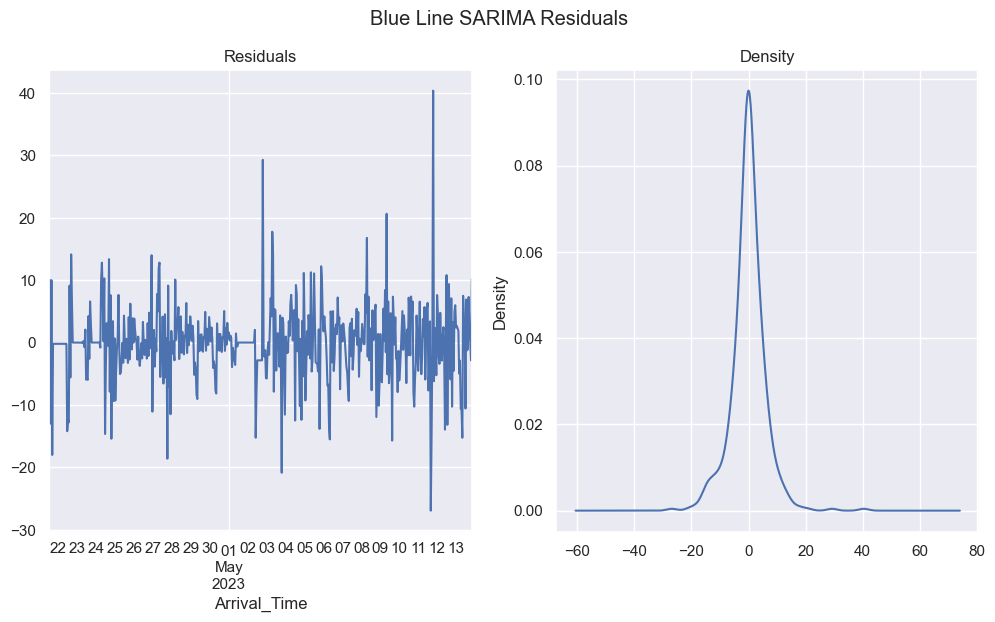

In [234]:
#check residuals
import matplotlib.pyplot as plt
residuals = result.resid[1:]
fig, ax = plt.subplots(1,2)
residuals.plot(title='Residuals', ax=ax[0])
residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.suptitle("Blue Line SARIMA Residuals")
plt.show()
#residuals looks good
#random noise on the left
#normally distributed about the mean on the right

### Predict

In [235]:
#use sarima model to predict on test data set
start = len(df_train)
end = len(df_train) + len(df_test) - 1

predictions = result.predict(start, end,
                             typ = 'levels').rename("Predictions")+df_blue['Frq'] #undifference

<Axes: title={'center': 'Blue Line Predictions'}, xlabel='Arrival_Time'>

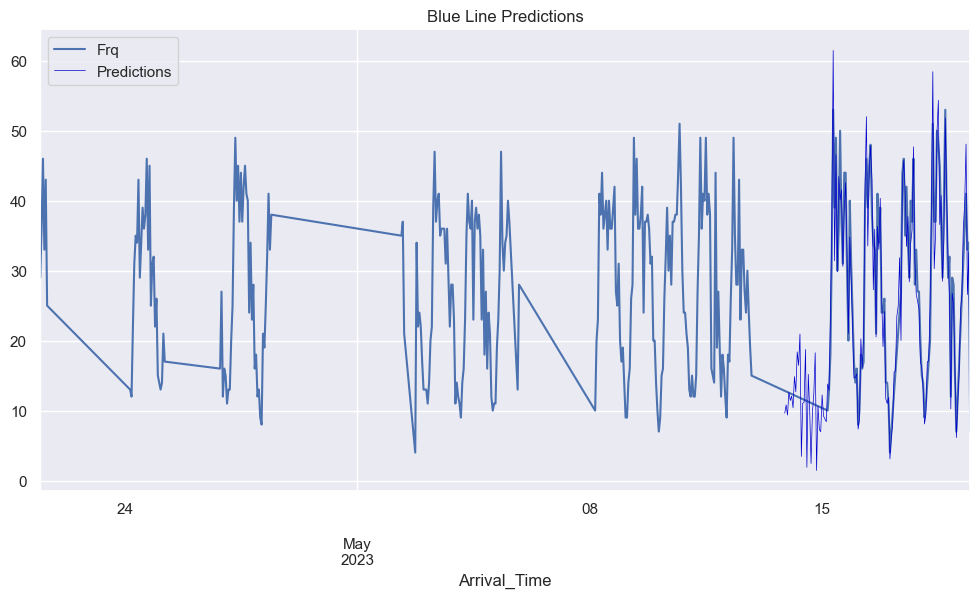

In [237]:
# plot predictions and actual values, showing whole dataset
df_blue['Frq'].plot(legend = True)
predictions.plot(legend = True, title="Blue Line Predictions", label='Predictions', lw=.5, color="mediumblue")

<Axes: title={'center': 'Blue Line Predictions'}, xlabel='Arrival_Time'>

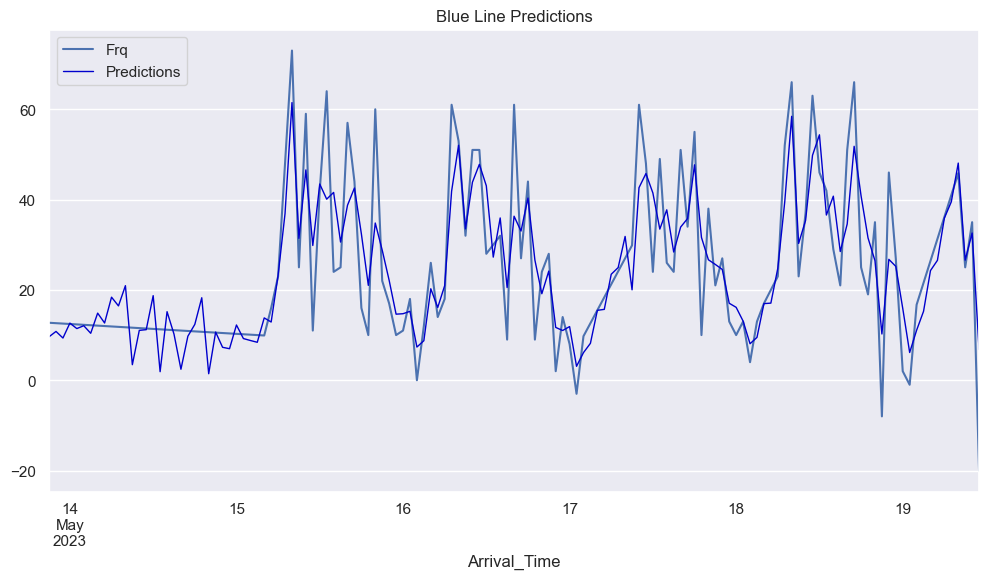

In [239]:
# plot predictions and actual values, zoom on testing dataset
df_test_undiff = df_test+df_blue['Frq'] #undiff
df_test_undiff.dropna(inplace=True)
predictions.dropna(inplace=True)
df_test_undiff.plot(legend = True, label="Frq")
predictions.plot(legend = True, title="Blue Line Predictions", label="Predictions", lw=1, color="mediumblue")

### Evaluate

In [240]:
# Load specific evaluation tools
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
  
# Calculate root mean squared error
rmse(df_test_undiff, predictions)

#example interpretation: The weighted average error between the predictions and actuals in this dataset is 9.55, which is likely a good value given that the average actual height in the dataset is 170.

9.31514872704857

### Forecast

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.22145D+00    |proj g|=  2.12168D-01

At iterate    5    f=  3.18259D+00    |proj g|=  2.00256D-02

At iterate   10    f=  3.18091D+00    |proj g|=  4.84590D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     11     13      1     0     0   9.840D-06   3.181D+00
  F =   3.1809118757318138     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<Axes: xlabel='Arrival_Time'>

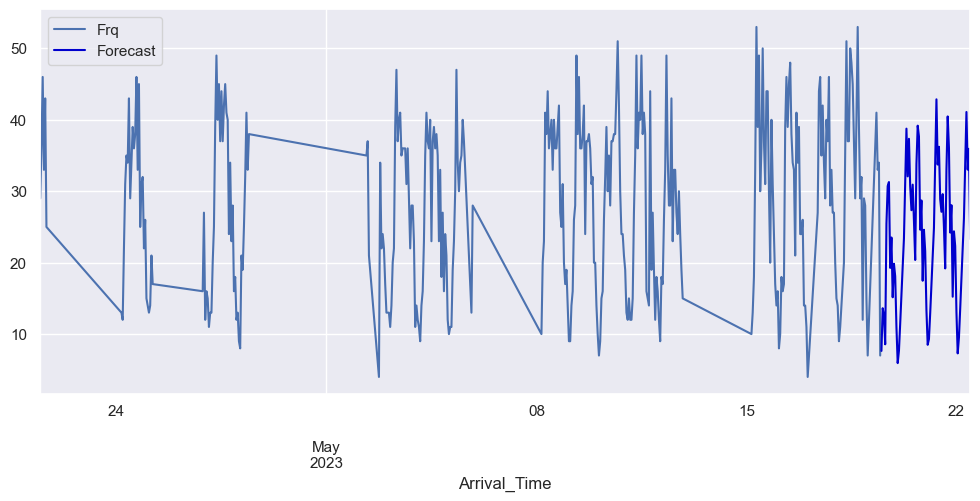

In [241]:
# Train the model on the full dataset
model = model = SARIMAX(df_blue['Frq'], 
                        order = (1, 0, 0), 
                        seasonal_order =(2, 1, 0, 24))
result = model.fit()
  
# Forecast for the next 3 years
forecast = result.predict(start = len(df_blue), 
                          end = (len(df_blue)-1) + 3 * 24, 
                          typ = 'levels').rename('Forecast')
  
# Plot the forecast values
df_blue['Frq'].plot(figsize = (12, 5), legend = True)
forecast.plot(legend = True, color="mediumblue")

In [242]:
#final model summary
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                Frq   No. Observations:                  673
Model:             SARIMAX(1, 0, 0)x(2, 1, 0, 24)   Log Likelihood               -2140.754
Date:                            Sat, 27 May 2023   AIC                           4289.507
Time:                                    13:23:35   BIC                           4307.409
Sample:                                04-21-2023   HQIC                          4296.452
                                     - 05-19-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8150      0.019     42.407      0.000       0.777       0.853
ar.S.L24      -0.5845      0.033    -17.534      0.000      -0.650      -0.519
ar.S.L48      -0.2799      0.033     -8.402      0.000      -0.345      -0.215
sigma2        42.2180      1.470     28.727      0.000      39.338      45.098
===================================================================================
Ljung-Box (L1) (Q):                  26.15   Jarque-Bera (JB):               352.81
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.50   Skew:                             0.18
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.59
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""